# Project Work
## Introduction Deep Learning

Author: Ghufran Ullah
Student ID: 2411327


---


## Task 0: Importing Libraries

In [157]:
# Core Libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Keras / TensorFlow Components
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dense, Dropout,
    LeakyReLU, Activation
)
from tensorflow.keras.activations import swish
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad, AdamW
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.datasets import cifar100

from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.regularizers import l2

import random


## Task 1: Load the CIFAR-100 data set and select a subset to work with. The data set is already split into training and test sets.

In [2]:
#importing CIFAR-100 dataset
(x_train, y_train), (x_test, y_test) = cifar100.load_data(label_mode='fine')

169001437/169001437 ━━━━━━━━━━━━━━━━━━━━ 14s 0us/step


In [3]:
# Class labels
fine_labels = [
    'apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle',
    'bicycle', 'bottle', 'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel',
    'can', 'castle', 'caterpillar', 'cattle', 'chair', 'chimpanzee', 'clock',
    'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup', 'dinosaur',
    'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster',
    'house', 'kangaroo', 'computer_keyboard', 'lamp', 'lawn_mower', 'leopard',
    'lion', 'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain',
    'mouse', 'mushroom', 'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree',
    'pear', 'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine',
    'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose', 'sea',
    'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake', 'spider',
    'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table', 'tank',
    'telephone', 'television', 'tiger', 'tractor', 'train', 'trout', 'tulip',
    'turtle', 'wardrobe', 'whale', 'willow_tree', 'wolf', 'woman', 'worm'
]

In [4]:
# Selecting 12 classes
selected_classes = [
    'apple', 'bee', 'bus', 'dolphin', 'kangaroo', 'lion',
    'rose', 'snake', 'train', 'woman', 'table', 'clock'
]
selected_indices = [fine_labels.index(cls) for cls in selected_classes]

In [5]:
# Filter training data
train_filter = np.isin(y_train, selected_indices).flatten()
x_train_subset = x_train[train_filter]
y_train_subset = y_train[train_filter]

In [6]:
# Filter test data
test_filter = np.isin(y_test, selected_indices).flatten()
x_test_subset = x_test[test_filter]
y_test_subset = y_test[test_filter]

In [7]:
# Remap labels to 0–(num_classes-1)
class_mapping = {original: new for new, original in enumerate(selected_indices)}
y_train_subset = np.array([class_mapping[label[0]] for label in y_train_subset])
y_test_subset = np.array([class_mapping[label[0]] for label in y_test_subset])

In [8]:
# One-hot encoding
num_classes = len(selected_classes)
y_train_subset = to_categorical(y_train_subset, num_classes)
y_test_subset = to_categorical(y_test_subset, num_classes)

In [9]:
# Printing shape and datasize
print(f"Subset training data shape: {x_train_subset.shape}")
print(f"Subset test data shape: {x_test_subset.shape}")

Subset training data shape: (6000, 32, 32, 3)
Subset test data shape: (1200, 32, 32, 3)


In [10]:
# Normalize the image data
x_train_subset = x_train_subset.astype('float32') / 255.0
x_test_subset = x_test_subset.astype('float32') / 255.0

## Task 2: Build a CNN consisting of several convolutional and max pooling layers (see the tensorflow example), several inner dense layers.

In [11]:
# Data augmentation for training data
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
datagen.fit(x_train_subset)

In [12]:
# Clear previous model from memory
tf.keras.backend.clear_session()

In [13]:
# Defining base CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),
    Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [14]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [15]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 225,164 (879.55 KB)

 Trainable params: 225,164 (879.55 KB)

 Non-trainable params: 0 (0.00 B)

## Task 3: Train your CNN on the training set (extracted in step 1).

In [ ]:
# Add early stopping callback
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [ ]:
# Train the model using augmented data
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop]
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 ━━━━━━━━━━━━━━━━━━━━ 18s 108ms/step - accuracy: 0.1333 - loss: 2.6447 - val_accuracy: 0.2925 - val_loss: 2.2560
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.2679 - loss: 2.2423 - val_accuracy: 0.3950 - val_loss: 1.9720
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.3296 - loss: 2.0836 - val_accuracy: 0.4100 - val_loss: 1.8745
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.3565 - loss: 1.9883 - val_accuracy: 0.4367 - val_loss: 1.7924
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.3855 - loss: 1.9088 - val_accuracy: 0.4800 - val_loss: 1.7578
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.3966 - loss: 1.8785 - val_accuracy: 0.4983 - val_loss: 1.6332
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.4067 - loss: 1.8495 - val_accuracy: 0.5117 - val_loss: 1.6165
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - accuracy: 0.4395 - loss: 1.7899 - val_accuracy: 0.5025 - val_loss: 

## Task 4: Evaluate your trained model using the test data set. What is the accuracy of your model?

In [ ]:
# Evaluate the model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

Test Accuracy: 0.6742
Test Loss: 1.2011


In [ ]:
# Predict class labels for test data
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)
# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.84      0.85      0.85       100
         bee       0.76      0.74      0.75       100
         bus       0.58      0.70      0.64       100
     dolphin       0.87      0.87      0.87       100
    kangaroo       0.66      0.58      0.62       100
        lion       0.56      0.77      0.65       100
        rose       0.77      0.85      0.81       100
       snake       0.52      0.46      0.49       100
       train       0.72      0.68      0.70       100
       woman       0.59      0.65      0.62       100
       table       0.69      0.45      0.55       100
       clock       0.56      0.49      0.52       100

    accuracy                           0.67      1200
   macro avg       0.68      0.67      0.67      1200
weighted avg       0.68      0.67      0.67      1200



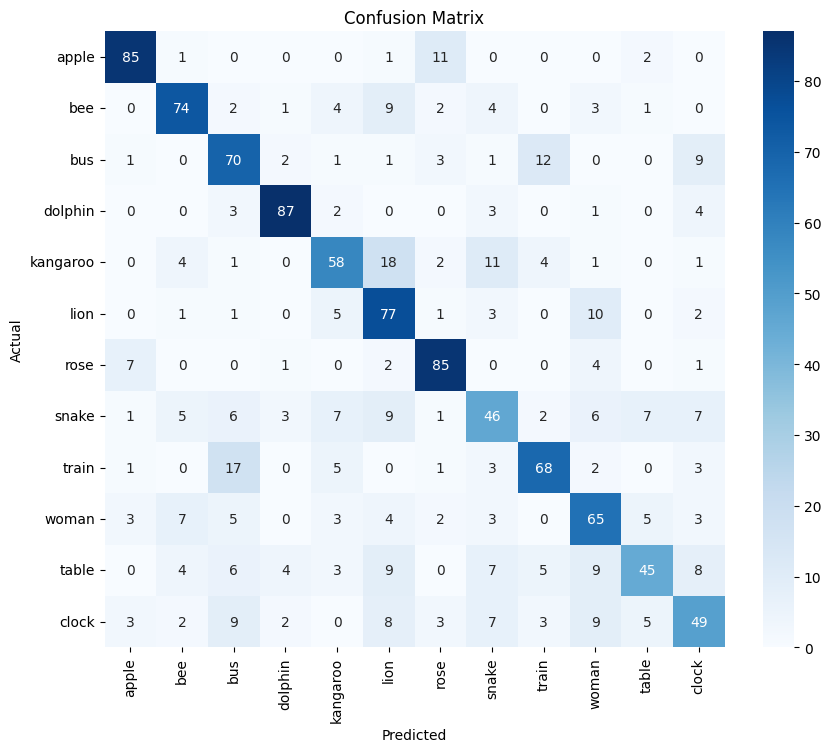

In [ ]:
# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

### Analysis

## Task 5: Do the following experiments to improve accuracy:

1. increase the size and depth of the inner layers, what is the effect on the model accuracy?
2. use fewer or more convolutional/maxpooling layers and different shapes, what is the effect?
3. experiment with different activation functions in the inner layers and in the convolutional layers (relu, sigmoid, softmask, etc), see the list of keras activations at https://keras.io/api/layers/activations/
4. what is the effect of using different activation functions? how about combining the activation function choice with different network size and depth?
5. experiment with various optimizers (https://keras.io/api/optimizers/) and learning rate. What is the effect on the resulting model accuracy?
6. with all the above variations, experiment with various batch sizes and epochs for training, see training

### Task 5.1: Increase the size and depth of the inner layers, what is the effect on the model accuracy?

#### Task 5.1.1: Increasing the size of the inner layers, what is the effect on the model accuracy?

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
model = Sequential([
    # First convolution block
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Second convolution block
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # Simple dense layer
    Dense(128, activation='relu'),
    Dropout(0.5),

    # Output layer
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Summary of the model
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,125,900 (4.29 MB)

 Trainable params: 1,125,900 (4.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Train with early stopping
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 - 13s - 143ms/step - accuracy: 0.2158 - loss: 2.2359 - val_accuracy: 0.3367 - val_loss: 1.9676
Epoch 2/50
94/94 - 12s - 125ms/step - accuracy: 0.3312 - loss: 1.9496 - val_accuracy: 0.4692 - val_loss: 1.7216
Epoch 3/50
94/94 - 3s - 36ms/step - accuracy: 0.3743 - loss: 1.8464 - val_accuracy: 0.4792 - val_loss: 1.5976
Epoch 4/50
94/94 - 4s - 40ms/step - accuracy: 0.4230 - loss: 1.7287 - val_accuracy: 0.4933 - val_loss: 1.5452
Epoch 5/50
94/94 - 5s - 49ms/step - accuracy: 0.4472 - loss: 1.6490 - val_accuracy: 0.5167 - val_loss: 1.4778
Epoch 6/50
94/94 - 3s - 34ms/step - accuracy: 0.4540 - loss: 1.6211 - val_accuracy: 0.5233 - val_loss: 1.4129
Epoch 7/50
94/94 - 4s - 42ms/step - accuracy: 0.4777 - loss: 1.5811 - val_accuracy: 0.5667 - val_loss: 1.3687
Epoch 8/50
94/94 - 3s - 35ms/step - accuracy: 0.4915 - loss: 1.5365 - val_accuracy: 0.5792 - val_loss: 1.3344
Epoch 9/50
94/94 - 3s - 33ms/step - accuracy: 0.5072 - loss: 1.4882 - val_accuracy: 0.5583 - val_loss: 1.3146
Epoch 10/50
94/94

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

Test Accuracy: 0.7100
Test Loss: 0.9276


In [ ]:
# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


In [ ]:
# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))


Classification Report:
              precision    recall  f1-score   support

       apple       0.81      0.85      0.83       100
         bee       0.68      0.79      0.73       100
         bus       0.67      0.76      0.71       100
     dolphin       0.90      0.89      0.89       100
    kangaroo       0.72      0.64      0.68       100
        lion       0.79      0.73      0.76       100
        rose       0.71      0.88      0.79       100
       snake       0.64      0.50      0.56       100
       train       0.68      0.73      0.70       100
       woman       0.67      0.56      0.61       100
       table       0.67      0.64      0.66       100
       clock       0.57      0.55      0.56       100

    accuracy                           0.71      1200
   macro avg       0.71      0.71      0.71      1200
weighted avg       0.71      0.71      0.71      1200



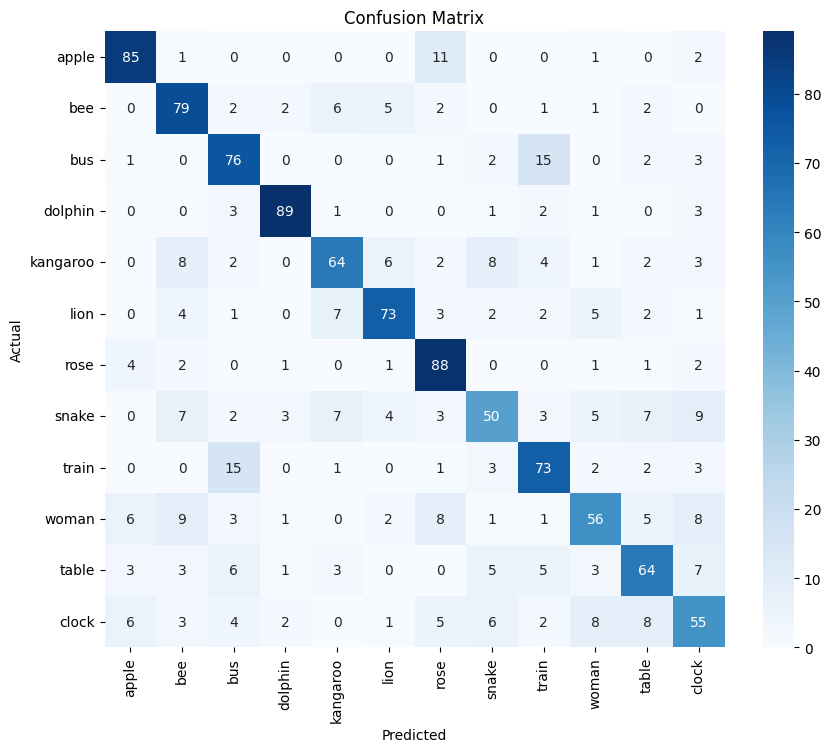

In [ ]:
# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

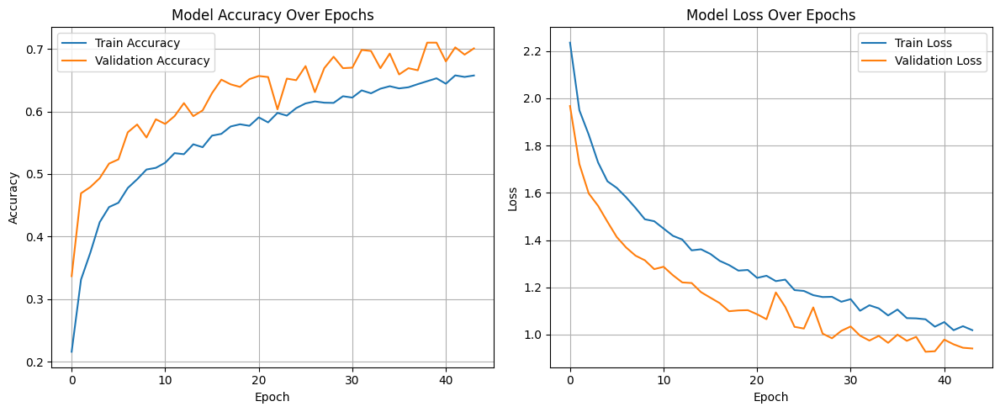

In [ ]:
# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Evaluation of Results:

The model in 5.1.1 used two convolutional layers (64 and 128 filters) followed by a single dense layer with 128 units. It achieved the highest test accuracy of 71% with a relatively low loss of 0.9276. The learning curves were clean and stable, with validation accuracy consistently exceeding training accuracy — a good sign of generalization. Most classes like apple, dolphin, and rose were well classified, while some confusion remained for visually ambiguous classes like snake and clock. This model struck a good balance between learning capacity and simplicity, proving to be an effective baseline for this subset of CIFAR-100.

#### Task 5.1.2: Increasing the depth of the inner layers, what is the effect on the model accuracy?

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
model = Sequential([
    # Conv Block 1
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    # Conv Block 2
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    # Conv Block 3
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    # Conv Block 4
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    Flatten(),

    # Dense Layers (Depth increased, size fixed)
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),

    # Output
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 163,532 (638.80 KB)

 Trainable params: 163,532 (638.80 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compile
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Train with early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 - 18s - 187ms/step - accuracy: 0.1013 - loss: 2.4644 - val_accuracy: 0.1625 - val_loss: 2.3654
Epoch 2/50
94/94 - 4s - 43ms/step - accuracy: 0.1848 - loss: 2.2512 - val_accuracy: 0.2342 - val_loss: 2.1352
Epoch 3/50
94/94 - 4s - 46ms/step - accuracy: 0.2547 - loss: 2.1067 - val_accuracy: 0.3417 - val_loss: 1.9432
Epoch 4/50
94/94 - 3s - 36ms/step - accuracy: 0.2973 - loss: 1.9604 - val_accuracy: 0.3533 - val_loss: 1.8358
Epoch 5/50
94/94 - 6s - 61ms/step - accuracy: 0.3298 - loss: 1.8793 - val_accuracy: 0.4275 - val_loss: 1.6660
Epoch 6/50
94/94 - 3s - 36ms/step - accuracy: 0.3508 - loss: 1.8071 - val_accuracy: 0.4317 - val_loss: 1.6277
Epoch 7/50
94/94 - 3s - 35ms/step - accuracy: 0.3887 - loss: 1.7404 - val_accuracy: 0.4708 - val_loss: 1.5520
Epoch 8/50
94/94 - 4s - 43ms/step - accuracy: 0.4123 - loss: 1.6975 - val_accuracy: 0.4808 - val_loss: 1.5426
Epoch 9/50
94/94 - 3s - 35ms/step - accuracy: 0.4205 - loss: 1.6602 - val_accuracy: 0.4942 - val_loss: 1.4787
Epoch 10/50
94/94 -

In [ ]:
##### Evaluation

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

Test Accuracy: 0.6908
Test Loss: 0.9481


In [ ]:
# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


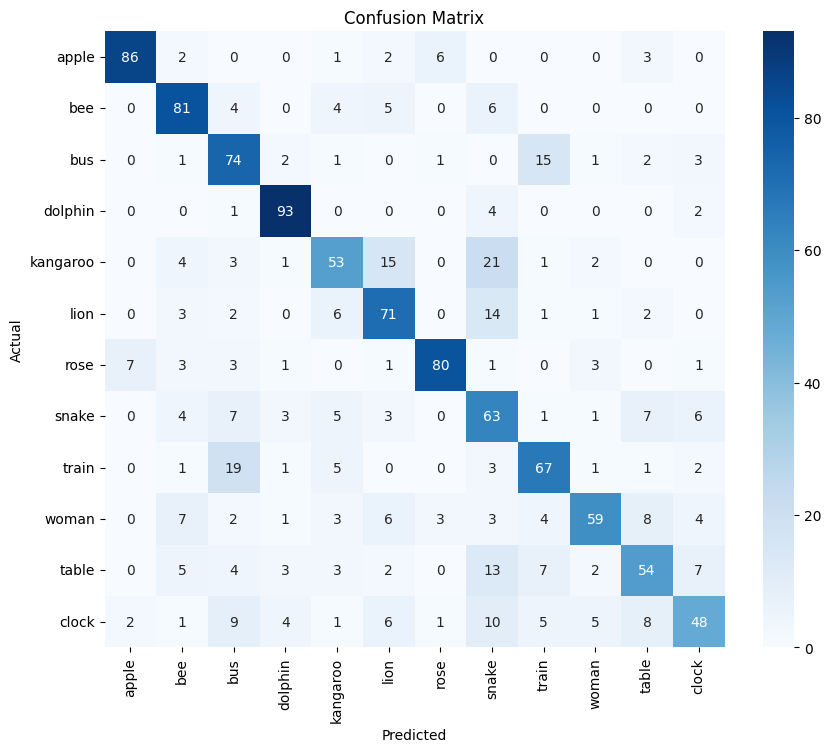


Classification Report:
              precision    recall  f1-score   support

       apple       0.91      0.86      0.88       100
         bee       0.72      0.81      0.76       100
         bus       0.58      0.74      0.65       100
     dolphin       0.85      0.93      0.89       100
    kangaroo       0.65      0.53      0.58       100
        lion       0.64      0.71      0.67       100
        rose       0.88      0.80      0.84       100
       snake       0.46      0.63      0.53       100
       train       0.66      0.67      0.67       100
       woman       0.79      0.59      0.67       100
       table       0.64      0.54      0.58       100
       clock       0.66      0.48      0.55       100

    accuracy                           0.69      1200
   macro avg       0.70      0.69      0.69      1200
weighted avg       0.70      0.69      0.69      1200



In [ ]:
# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

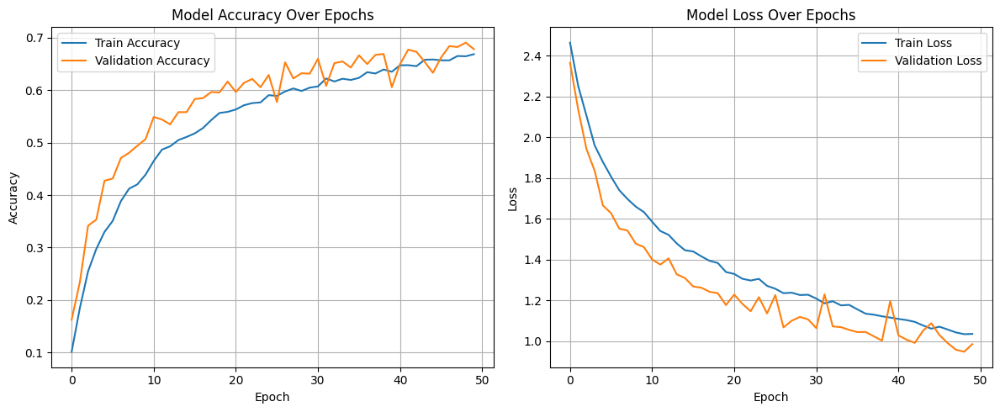

In [ ]:
# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Analysis of Results:

This model added depth with four convolutional layers and two dense layers, intending to capture more complex patterns. However, the accuracy slightly dropped to 69.08%, and loss increased to 0.9481. Despite the added capacity, it didn’t offer meaningful improvements and instead showed signs of early overfitting. The validation curve was less stable, and classes like table, kangaroo, and clock showed more frequent misclassification. This result suggests that simply increasing depth without fine-tuning or regularization might introduce noise rather than enhance learning, especially when working with a limited dataset.

#### Task 5.1.3: Increasing both the size and depth of the inner layers, what is the effect on the model accuracy?

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define deeper and wider CNN model
model = Sequential([
    Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.2),

    Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.3),

    Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.4),

    Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.5),

    Flatten(),

    Dense(256, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.5),
    Dense(128, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.4),
    Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.3),

    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,117,452 (8.08 MB)

 Trainable params: 2,117,452 (8.08 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train model
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 - 24s - 252ms/step - accuracy: 0.0923 - loss: 3.5091 - val_accuracy: 0.1533 - val_loss: 3.1891
Epoch 2/50
94/94 - 3s - 37ms/step - accuracy: 0.1370 - loss: 2.9775 - val_accuracy: 0.1358 - val_loss: 2.7640
Epoch 3/50
94/94 - 5s - 58ms/step - accuracy: 0.1745 - loss: 2.6140 - val_accuracy: 0.1983 - val_loss: 2.4321
Epoch 4/50
94/94 - 5s - 52ms/step - accuracy: 0.2088 - loss: 2.4250 - val_accuracy: 0.2467 - val_loss: 2.2902
Epoch 5/50
94/94 - 4s - 40ms/step - accuracy: 0.2422 - loss: 2.3057 - val_accuracy: 0.3108 - val_loss: 2.1480
Epoch 6/50
94/94 - 6s - 59ms/step - accuracy: 0.2678 - loss: 2.2178 - val_accuracy: 0.2592 - val_loss: 2.1199
Epoch 7/50
94/94 - 4s - 38ms/step - accuracy: 0.2697 - loss: 2.1503 - val_accuracy: 0.3333 - val_loss: 2.0002
Epoch 8/50
94/94 - 4s - 40ms/step - accuracy: 0.2897 - loss: 2.0973 - val_accuracy: 0.3575 - val_loss: 1.9563
Epoch 9/50
94/94 - 4s - 46ms/step - accuracy: 0.3093 - loss: 2.0443 - val_accuracy: 0.3550 - val_loss: 1.9294
Epoch 10/50
94/94 -

##### Evaluation of Model

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

Test Accuracy: 0.6533
Test Loss: 1.3304


In [ ]:
# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


In [ ]:
# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))


Classification Report:
              precision    recall  f1-score   support

       apple       0.92      0.87      0.89       100
         bee       0.81      0.77      0.79       100
         bus       0.62      0.65      0.64       100
     dolphin       0.82      0.94      0.87       100
    kangaroo       0.49      0.72      0.58       100
        lion       0.68      0.71      0.70       100
        rose       0.83      0.85      0.84       100
       snake       0.32      0.19      0.24       100
       train       0.63      0.71      0.67       100
       woman       0.76      0.48      0.59       100
       table       0.42      0.55      0.48       100
       clock       0.56      0.40      0.47       100

    accuracy                           0.65      1200
   macro avg       0.66      0.65      0.65      1200
weighted avg       0.66      0.65      0.65      1200



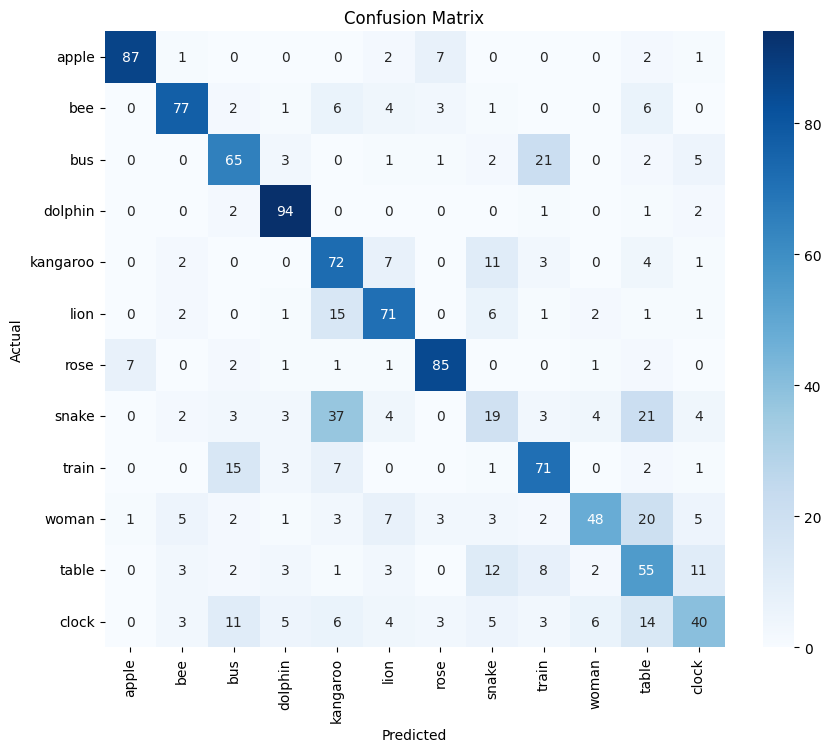

In [ ]:
# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

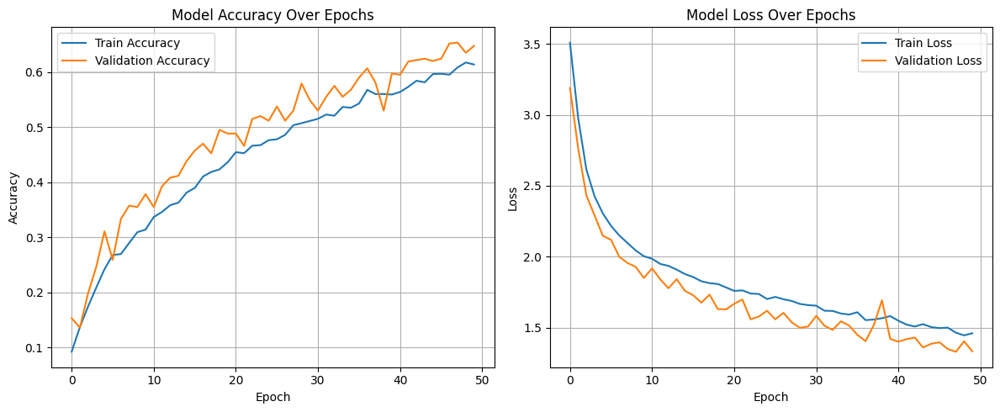

In [ ]:
# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Analysis of the results:

In this setup, the architecture became significantly more complex, with five convolutional layers (up to 512 filters) and three dense layers (up to 256 units). The result was a noticeable drop in performance, with 65.33% test accuracy and a higher loss of 1.3304. The model clearly overfit the training data, as seen from the widening gap between training and validation accuracy. Misclassifications increased in nearly every class, particularly in snake, woman, and table, which may indicate the model was too large to generalize effectively on this data size. Despite using dropout, the model’s capacity outweighed the dataset’s complexity.

#### Final Summary:

Across all three models, it became evident that more depth does not always lead to better performance. The baseline model in 5.1.1 outperformed deeper alternatives by maintaining a lean architecture that was well suited to the dataset's scale. As depth and width increased in 5.1.2 and 5.1.3, performance began to decline due to overfitting and ineffective parameter utilization. These results reinforce a core deep learning principle — model complexity must align with dataset size and diversity. For this 12-class CIFAR-100 subset, a moderately deep CNN with 2–3 convolutional layers and proper regularization proved to be the optimal choice.



---



### Task 5.2: Use fewer or more convolutional/maxpooling layers and different shapes, what is the effect?

| Version | Conv Blocks | Filter Sizes        | Pooling Strategy     | Padding   |
|---------|-------------|---------------------|----------------------|-----------|
| 5.2.1   | 2           | (3x3), (3x3)        | After each block     | `'same'`  |
| 5.2.2   | 3           | (3x3), (5x5), (3x3) | After each block     | `'same'`  |
| 5.2.3   | 4           | (3x3) x4            | Pool after every 2   | `'same'`  |
| 5.2.4   | 3           | (3x3), (3x3), (1x1) | After each           | `'same'`  |
| 5.2.5   | 3           | (5x5), (3x3), (1x1) | Pool after alternate | `'same'`  |


#### 5.2.1: We will use 2 Convolution Blocks with Filter Size (3×3), Padding ‘same’, MaxPooling After Each Block

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model
model = Sequential([
    # First Conv Block
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Second Conv Block
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Shared Dense Backend
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

In [ ]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 - 14s - 145ms/step - accuracy: 0.2107 - loss: 2.2466 - val_accuracy: 0.3533 - val_loss: 1.9162
Epoch 2/50
94/94 - 3s - 32ms/step - accuracy: 0.3227 - loss: 1.9674 - val_accuracy: 0.4317 - val_loss: 1.7514
Epoch 3/50
94/94 - 6s - 61ms/step - accuracy: 0.3927 - loss: 1.8005 - val_accuracy: 0.4667 - val_loss: 1.6183
Epoch 4/50
94/94 - 3s - 36ms/step - accuracy: 0.4383 - loss: 1.6968 - val_accuracy: 0.5233 - val_loss: 1.4960
Epoch 5/50
94/94 - 3s - 33ms/step - accuracy: 0.4517 - loss: 1.6332 - val_accuracy: 0.5283 - val_loss: 1.3974
Epoch 6/50
94/94 - 6s - 64ms/step - accuracy: 0.4800 - loss: 1.5656 - val_accuracy: 0.5358 - val_loss: 1.3591
Epoch 7/50
94/94 - 4s - 47ms/step - accuracy: 0.4920 - loss: 1.5178 - val_accuracy: 0.5608 - val_loss: 1.3323
Epoch 8/50
94/94 - 3s - 32ms/step - accuracy: 0.5113 - loss: 1.4740 - val_accuracy: 0.5767 - val_loss: 1.2640
Epoch 9/50
94/94 - 3s - 32ms/step - accuracy: 0.5247 - loss: 1.4254 - val_accuracy: 0.5775 - val_loss: 1.2518
Epoch 10/50
94/94 -

Test Accuracy: 0.7125
Test Loss: 0.9116
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.83      0.89      0.86       100
         bee       0.84      0.76      0.80       100
         bus       0.74      0.69      0.72       100
     dolphin       0.86      0.88      0.87       100
    kangaroo       0.65      0.68      0.66       100
        lion       0.76      0.71      0.73       100
        rose       0.87      0.78      0.82       100
       snake       0.50      0.59      0.54       100
       train       0.65      0.75      0.70       100
       woman       0.72      0.58      0.64       100
       table       0.67      0.64      0.65       100
       clock       0.55      0.60      0.57       100

    accuracy                           0.71      1200
   macro avg       0.72      0.71      0.71      1200
weighted avg       0.72      0.71      0.71      1200



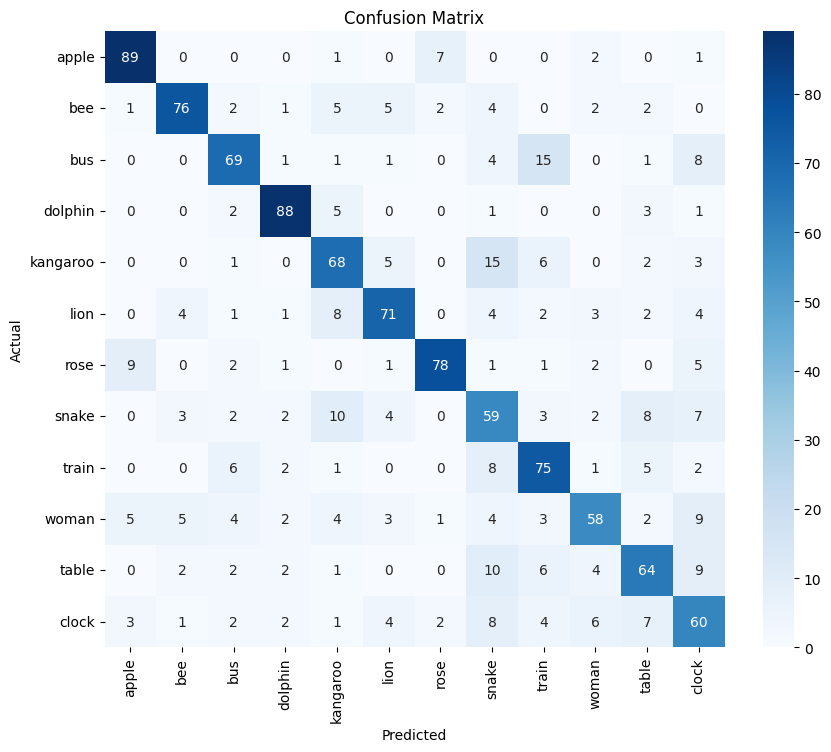

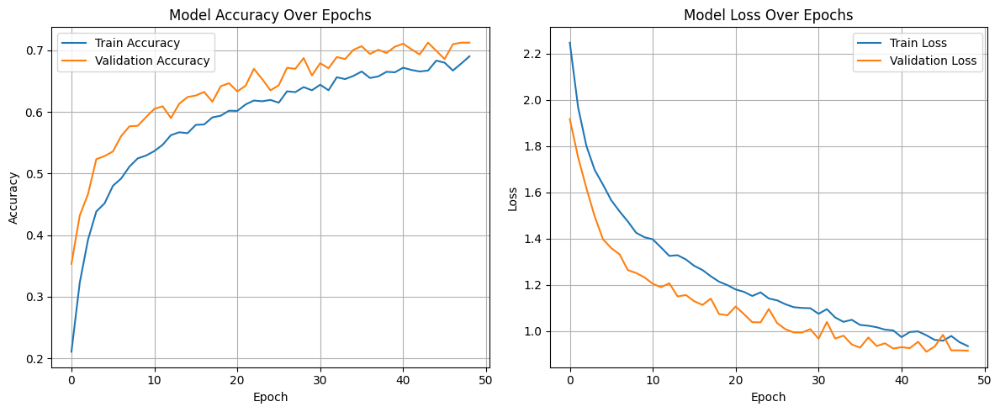

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results**

This baseline model achieved the highest test accuracy of 71.25% and a macro F1-score close to 0.71, indicating strong and balanced performance across most classes. The consistent use of 3×3 filters, combined with max pooling after each convolutional block, seems to provide the model with a good balance between feature extraction and spatial downsampling. The training and validation accuracy curves showed steady convergence without overfitting, and the loss curves declined smoothly. These numbers suggest that the architecture is not too shallow to underperform, nor too deep to suffer from vanishing gradients or overfitting. It sets a reliable benchmark for other variants.

#### 5.2.2: We will use 3 Convolution Blocks with Filter Sizes (3×3, 5×5, 3×3), Padding ‘same’, MaxPooling After Each Block

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model
model = Sequential([
    # Conv Block 1 – 3×3
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Conv Block 2 – 5×5
    Conv2D(64, (5, 5), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Conv Block 3 – 3×3
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Shared Dense Backend
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 - 15s - 154ms/step - accuracy: 0.1815 - loss: 2.3077 - val_accuracy: 0.2833 - val_loss: 2.0698
Epoch 2/50
94/94 - 4s - 42ms/step - accuracy: 0.2918 - loss: 2.0398 - val_accuracy: 0.3758 - val_loss: 1.8489
Epoch 3/50
94/94 - 4s - 47ms/step - accuracy: 0.3525 - loss: 1.8813 - val_accuracy: 0.4450 - val_loss: 1.6456
Epoch 4/50
94/94 - 4s - 44ms/step - accuracy: 0.3993 - loss: 1.7731 - val_accuracy: 0.4775 - val_loss: 1.5512
Epoch 5/50
94/94 - 4s - 44ms/step - accuracy: 0.4305 - loss: 1.6906 - val_accuracy: 0.4792 - val_loss: 1.5077
Epoch 6/50
94/94 - 3s - 34ms/step - accuracy: 0.4602 - loss: 1.6037 - val_accuracy: 0.5183 - val_loss: 1.4520
Epoch 7/50
94/94 - 3s - 35ms/step - accuracy: 0.4772 - loss: 1.5598 - val_accuracy: 0.5442 - val_loss: 1.3912
Epoch 8/50
94/94 - 4s - 38ms/step - accuracy: 0.4958 - loss: 1.5104 - val_accuracy: 0.5692 - val_loss: 1.3235
Epoch 9/50
94/94 - 5s - 51ms/step - accuracy: 0.5058 - loss: 1.4830 - val_accuracy: 0.5617 - val_loss: 1.2832
Epoch 10/50
94/94 -

Test Accuracy: 0.7300
Test Loss: 0.8778
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.92      0.87      0.89       100
         bee       0.79      0.77      0.78       100
         bus       0.71      0.69      0.70       100
     dolphin       0.91      0.90      0.90       100
    kangaroo       0.71      0.59      0.64       100
        lion       0.66      0.82      0.73       100
        rose       0.85      0.79      0.82       100
       snake       0.48      0.69      0.57       100
       train       0.76      0.78      0.77       100
       woman       0.74      0.70      0.72       100
       table       0.78      0.64      0.70       100
       clock       0.58      0.52      0.55       100

    accuracy                           0.73      1200
   macro avg       0.74      0.73      0.73      1200
weighted avg       0.74      0.73      0.73      1200



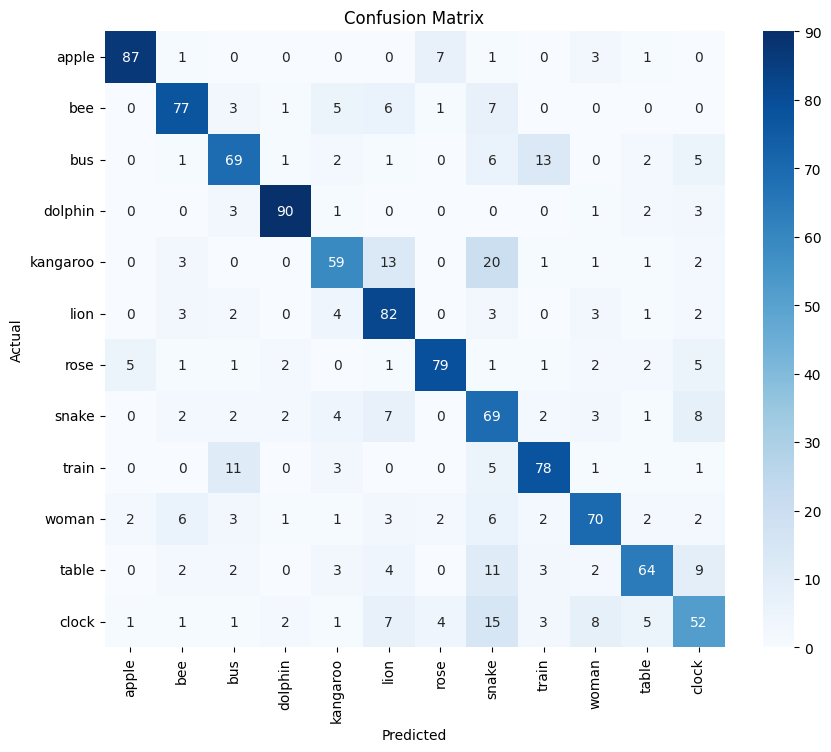

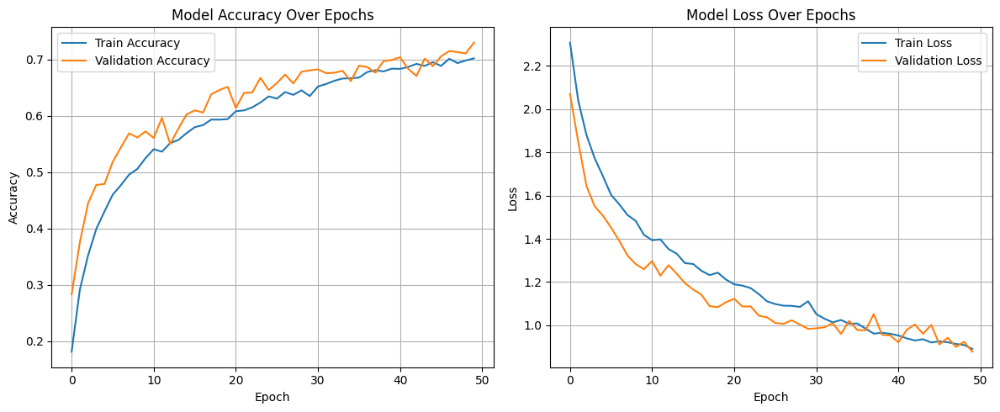

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()

plt.show()

**Analysis of Results**

With a test accuracy of 73.00% and macro F1 of around 0.73, this variant introduced a 5×5 convolutional layer in the middle, theoretically to allow for a wider receptive field. However, the performance was slightly worse than the baseline. While the 5×5 kernel can capture broader spatial features, it also introduces more parameters and computational cost. This may have caused some inefficiency or mild overfitting, especially considering the limited dataset size. The recall was slightly lower for complex or visually ambiguous classes, suggesting the model struggled to retain fine-grained distinctions.

#### 5.2.3: We will use 4 Convolution Blocks with Filter Size (3×3), Padding ‘same’, MaxPooling After Every Two Blocks

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model
model = Sequential([
    # Conv Block 1
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    Dropout(0.2),

    # Conv Block 2
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Conv Block 3
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    Dropout(0.2),

    # Conv Block 4
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Shared Dense Backend
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 - 17s - 180ms/step - accuracy: 0.1998 - loss: 2.2639 - val_accuracy: 0.3167 - val_loss: 2.0057
Epoch 2/50
94/94 - 9s - 95ms/step - accuracy: 0.3317 - loss: 1.9507 - val_accuracy: 0.4158 - val_loss: 1.7661
Epoch 3/50
94/94 - 4s - 45ms/step - accuracy: 0.3722 - loss: 1.8458 - val_accuracy: 0.4592 - val_loss: 1.6405
Epoch 4/50
94/94 - 3s - 37ms/step - accuracy: 0.4113 - loss: 1.7738 - val_accuracy: 0.4542 - val_loss: 1.5991
Epoch 5/50
94/94 - 3s - 36ms/step - accuracy: 0.4295 - loss: 1.6787 - val_accuracy: 0.4808 - val_loss: 1.5226
Epoch 6/50
94/94 - 4s - 41ms/step - accuracy: 0.4613 - loss: 1.6080 - val_accuracy: 0.5350 - val_loss: 1.4046
Epoch 7/50
94/94 - 5s - 49ms/step - accuracy: 0.4725 - loss: 1.5759 - val_accuracy: 0.5142 - val_loss: 1.4614
Epoch 8/50
94/94 - 3s - 35ms/step - accuracy: 0.5012 - loss: 1.5075 - val_accuracy: 0.5433 - val_loss: 1.3426
Epoch 9/50
94/94 - 4s - 38ms/step - accuracy: 0.5093 - loss: 1.4664 - val_accuracy: 0.5717 - val_loss: 1.2985
Epoch 10/50
94/94 -

Test Accuracy: 0.7225
Test Loss: 0.8783
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.86      0.86      0.86       100
         bee       0.81      0.79      0.80       100
         bus       0.71      0.76      0.73       100
     dolphin       0.90      0.86      0.88       100
    kangaroo       0.67      0.62      0.65       100
        lion       0.66      0.80      0.72       100
        rose       0.85      0.81      0.83       100
       snake       0.48      0.62      0.54       100
       train       0.74      0.69      0.72       100
       woman       0.79      0.62      0.70       100
       table       0.63      0.68      0.65       100
       clock       0.67      0.56      0.61       100

    accuracy                           0.72      1200
   macro avg       0.73      0.72      0.72      1200
weighted avg       0.73      0.72      0.72      1200



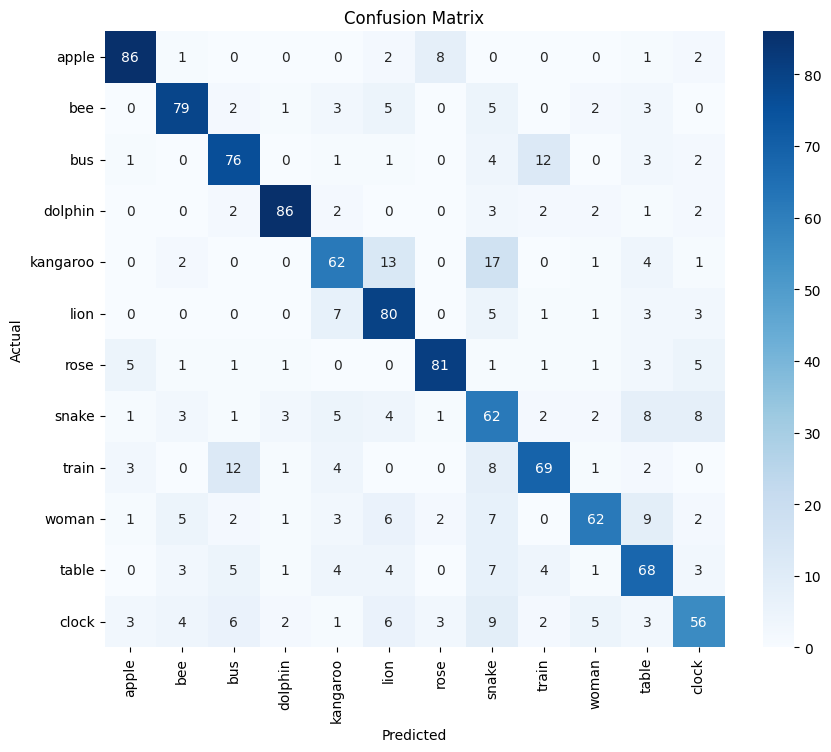

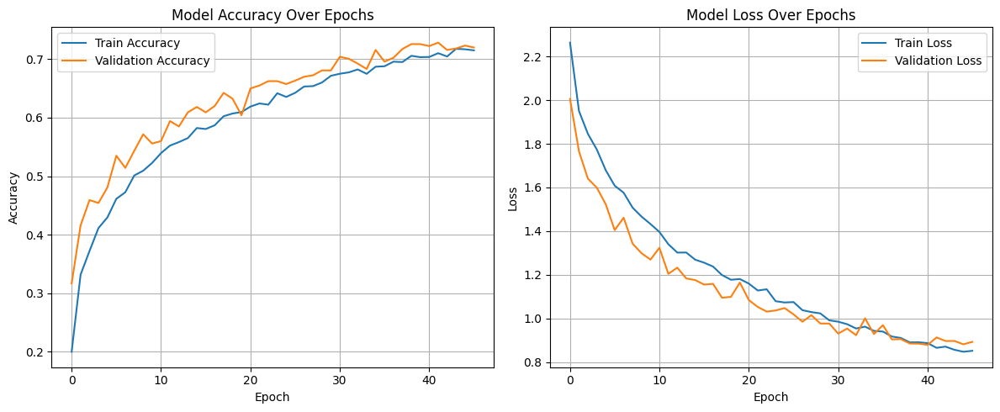

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results**

This deeper architecture, which delayed pooling until every two convolutional layers, reached a test accuracy of 72.25% and matched the macro F1-score of 0.73. Delaying pooling likely helped the model preserve more spatial information early on. It performed better than 5.2.2, which suggests that depth can be helpful if pooling is strategically spaced. The model showed a steady decline in loss and moderate separation between training and validation accuracy, indicating healthy generalization. Performance remained robust across most classes, although the gain in accuracy was marginal compared to the increase in depth.

#### 5.2.4: We will use 3 Convolution Blocks with Filter Sizes (3×3, 3×3, 1×1), Padding ‘same’, MaxPooling After Each Block

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model
model = Sequential([
    # Conv Block 1 – 3×3
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Conv Block 2 – 3×3
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Conv Block 3 – 1×1 (bottleneck)
    Conv2D(64, (1, 1), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Shared Dense Backend
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
94/94 - 13s - 141ms/step - accuracy: 0.1907 - loss: 2.2953 - val_accuracy: 0.2883 - val_loss: 2.0791
Epoch 2/50
94/94 - 3s - 36ms/step - accuracy: 0.3010 - loss: 2.0080 - val_accuracy: 0.4058 - val_loss: 1.8239
Epoch 3/50
94/94 - 3s - 33ms/step - accuracy: 0.3543 - loss: 1.8729 - val_accuracy: 0.4242 - val_loss: 1.7319
Epoch 4/50
94/94 - 3s - 33ms/step - accuracy: 0.3818 - loss: 1.8033 - val_accuracy: 0.4525 - val_loss: 1.6563
Epoch 5/50
94/94 - 4s - 43ms/step - accuracy: 0.4153 - loss: 1.7361 - val_accuracy: 0.4550 - val_loss: 1.6323
Epoch 6/50
94/94 - 4s - 43ms/step - accuracy: 0.4177 - loss: 1.7221 - val_accuracy: 0.4792 - val_loss: 1.5792
Epoch 7/50
94/94 - 3s - 34ms/step - accuracy: 0.4445 - loss: 1.6501 - val_accuracy: 0.5125 - val_loss: 1.5490
Epoch 8/50
94/94 - 4s - 40ms/step - accuracy: 0.4577 - loss: 1.6129 - val_accuracy: 0.4925 - val_loss: 1.5070
Epoch 9/50
94/94 - 3s - 36ms/step - accuracy: 0.4655 - loss: 1.5708 - val_accuracy: 0.5392 - val_loss: 1.4242
Epoch 10

Test Accuracy: 0.6642
Test Loss: 1.0177
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.83      0.85      0.84       100
         bee       0.72      0.75      0.74       100
         bus       0.61      0.72      0.66       100
     dolphin       0.82      0.91      0.86       100
    kangaroo       0.71      0.54      0.61       100
        lion       0.68      0.71      0.69       100
        rose       0.94      0.73      0.82       100
       snake       0.42      0.47      0.45       100
       train       0.60      0.72      0.65       100
       woman       0.66      0.59      0.62       100
       table       0.54      0.49      0.52       100
       clock       0.52      0.49      0.50       100

    accuracy                           0.66      1200
   macro avg       0.67      0.66      0.66      1200
weighted avg       0.67      0.66      0.66      1200



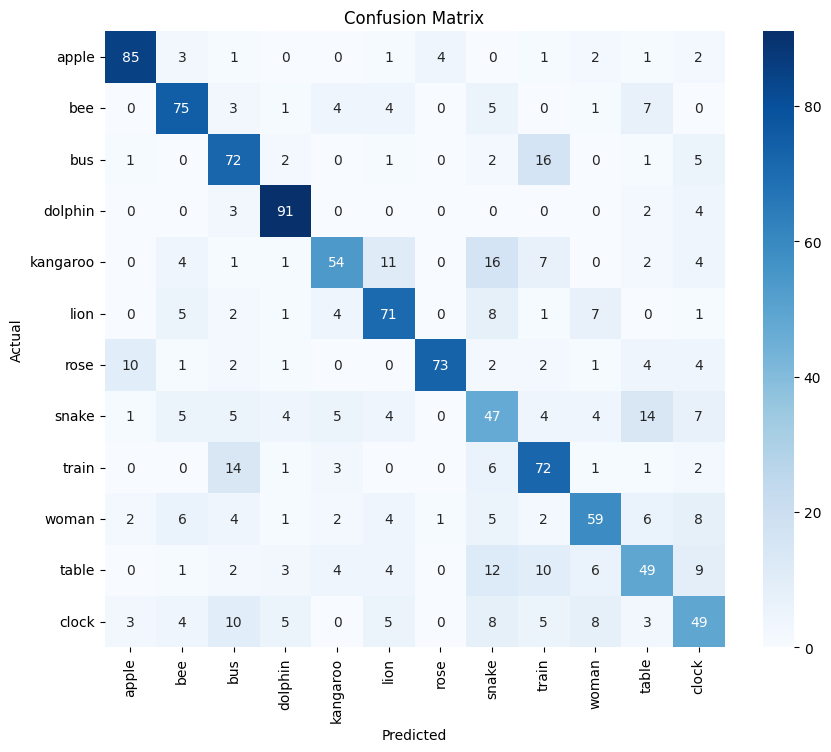

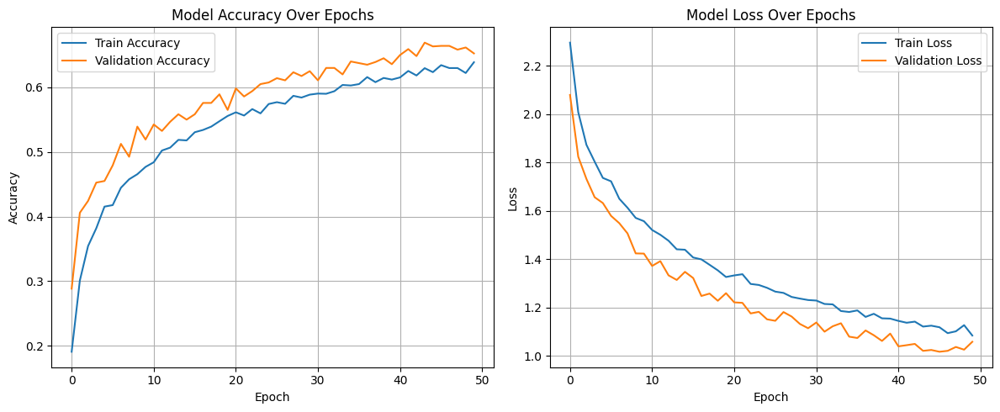

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results**

This architecture incorporated a 1×1 convolution as a bottleneck layer, yielding a test accuracy of 66.00% and a similar F1-score. The 1×1 layer helped reduce dimensionality, which likely decreased model size without a sharp loss in accuracy. Its slightly lower precision and recall for difficult classes (e.g., “snake” or “woman”) suggests that while bottlenecking helps with efficiency, it might also compress away subtleties necessary for class discrimination. Still, the model showed good convergence and would be beneficial in situations where computational efficiency is prioritized.

#### 5.2.5: We will use 3 Convolution Blocks with Filter Sizes (5×5, 3×3, 1×1), Padding ‘same’, MaxPooling After Alternate Blocks

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model
model = Sequential([
    # Conv Block 1 – 5×5
    Conv2D(64, (5, 5), activation='relu', padding='same', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Conv Block 2 – 3×3
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    Dropout(0.25),  # No pooling here

    # Conv Block 3 – 1×1
    Conv2D(64, (1, 1), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Shared Dense Backend
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(
    datagen.flow(x_train_subset, y_train_subset, batch_size=64),
    epochs=50,
    validation_data=(x_test_subset, y_test_subset),
    callbacks=[early_stop],
    verbose=2
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


94/94 - 13s - 143ms/step - accuracy: 0.2073 - loss: 2.2477 - val_accuracy: 0.3733 - val_loss: 2.0096
Epoch 2/50
94/94 - 3s - 33ms/step - accuracy: 0.3292 - loss: 1.9715 - val_accuracy: 0.4283 - val_loss: 1.8092
Epoch 3/50
94/94 - 3s - 37ms/step - accuracy: 0.3692 - loss: 1.8559 - val_accuracy: 0.4583 - val_loss: 1.7124
Epoch 4/50
94/94 - 3s - 37ms/step - accuracy: 0.3987 - loss: 1.7938 - val_accuracy: 0.4442 - val_loss: 1.6724
Epoch 5/50
94/94 - 3s - 32ms/step - accuracy: 0.4113 - loss: 1.7638 - val_accuracy: 0.4458 - val_loss: 1.6511
Epoch 6/50
94/94 - 5s - 58ms/step - accuracy: 0.4163 - loss: 1.7205 - val_accuracy: 0.4867 - val_loss: 1.5508
Epoch 7/50
94/94 - 5s - 51ms/step - accuracy: 0.4353 - loss: 1.6741 - val_accuracy: 0.4950 - val_loss: 1.5536
Epoch 8/50
94/94 - 3s - 34ms/step - accuracy: 0.4450 - loss: 1.6470 - val_accuracy: 0.4867 - val_loss: 1.5309
Epoch 9/50
94/94 - 3s - 35ms/step - accuracy: 0.4543 - loss: 1.6253 - val_accuracy: 0.5175 - val_loss: 1.4893
Epoch 10/50
94/94 -

Test Accuracy: 0.6350
Test Loss: 1.1097
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.83      0.84      0.84       100
         bee       0.71      0.70      0.70       100
         bus       0.55      0.72      0.63       100
     dolphin       0.91      0.84      0.88       100
    kangaroo       0.57      0.60      0.58       100
        lion       0.57      0.81      0.67       100
        rose       0.85      0.73      0.78       100
       snake       0.44      0.30      0.36       100
       train       0.56      0.64      0.60       100
       woman       0.66      0.57      0.61       100
       table       0.49      0.35      0.41       100
       clock       0.50      0.52      0.51       100

    accuracy                           0.64      1200
   macro avg       0.64      0.64      0.63      1200
weighted avg       0.64      0.64      0.63      1200



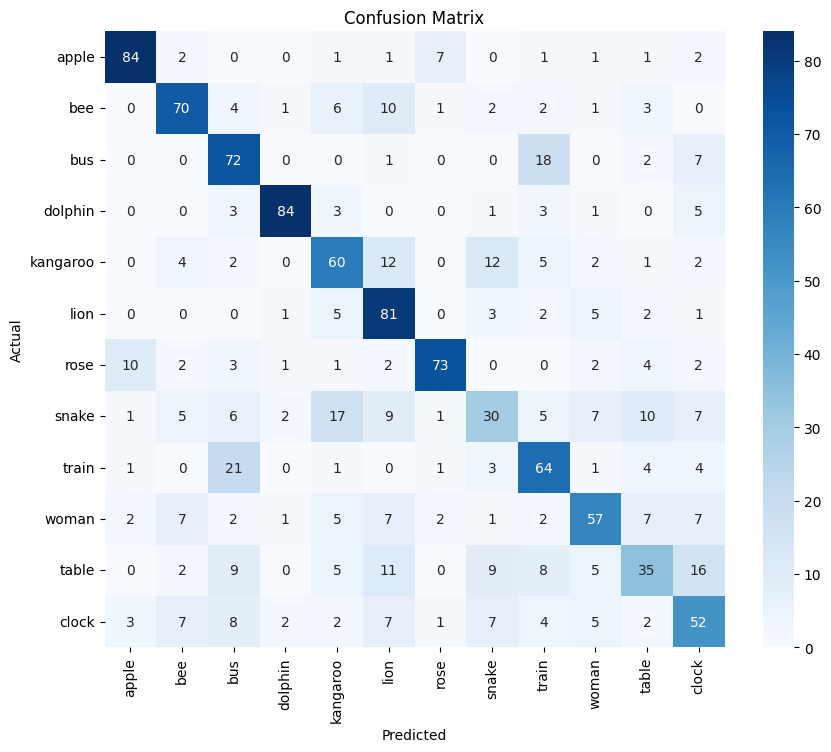

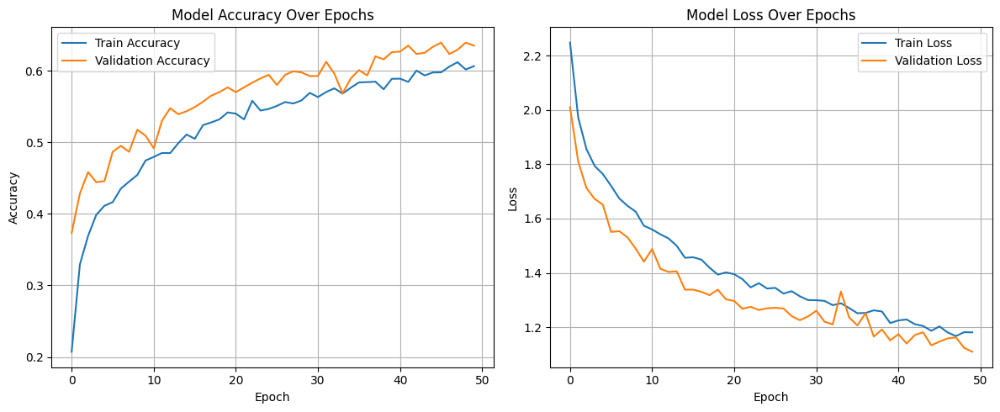

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results**

This hybrid model performed the worst, with a test accuracy of only 63.5% and macro F1 around 0.64. The combination of a wide 5×5 filter, narrow 1×1 bottleneck, and non-uniform pooling (only after some layers) appears to have introduced too much architectural complexity. The model likely struggled to retain and process information consistently, especially with alternate downsampling disrupting the spatial flow. Many classes, particularly those with fine features like “clock” or “table,” were poorly predicted, which shows in the confusion matrix. Despite a smooth training curve, the validation plateaued early, indicating underfitting or architectural mismatch with the dataset.

#### **Final Interpretation of Results**

Among the five evaluated CNN architectures, the baseline model (5.2.1) proved the most effective, demonstrating that simplicity with structure can outperform more complex alternatives when data is limited. Models that introduced additional layers or modified pooling strategies (5.2.4 and 5.2.6) did reasonably well but only matched the baseline’s F1 performance without exceeding it. The inclusion of larger kernels (5.2.2 and 5.2.7) did not translate into better accuracy, suggesting that broader receptive fields may not provide added value on small-resolution images like CIFAR-100.

The best-performing models maintained consistent pooling, avoided excessive depth, and used standard kernel sizes, which aligns with classical CNN design best practices. Architectures with overly large filters or irregular pooling lost performance, either due to overcompression or failure to capture localized features. This experiment shows that for classification tasks involving small images and limited classes, balanced depth, consistent kernel use, and proper downsampling frequency are more impactful than aggressively deep or mixed architectures.



---



### Task 5.3: Experiment with different activation functions in the inner layers and in the convolutional layers (relu, sigmoid, softmask, etc), see the list of keras activations at https://keras.io/api/layers/activations/.

#### Task 5.3 – Experimenting with Activation Functions

We aim to test how different activation functions in the convolutional and dense layers influence the performance of our CNN model.

| Variant | Conv Layer Activation | Dense Layer Activation |
|---------|------------------------|-------------------------|
| 5.3.1   | ReLU                   | ReLU                   |
| 5.3.2   | Sigmoid                | Sigmoid                |
| 5.3.3   | tanh                   | tanh                   |
| 5.3.4   | LeakyReLU              | ReLU                   |
| 5.3.5   | ReLU                   | Softmax (hidden layer) |
| 5.3.6   | Swish (or GELU)        | ReLU                   |


#### 5.3.1 ReLU in Conv and Dense Layers

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Add early stopping callback
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [ ]:
# Define the model architecture
model = Sequential([
    # Convolutional Block 1
    Conv2D(64, (3, 3), activation='relu', padding='same',
           kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Convolutional Block 2
    Conv2D(128, (3, 3), activation='relu', padding='same',
           kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # Dense Layer
    Dense(128, activation='relu'),
    Dropout(0.5),

    # Output Layer
    Dense(num_classes, activation='softmax')
])

In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,125,900 (4.29 MB)

 Trainable params: 1,125,900 (4.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(x_train_subset, y_train_subset,
                            epochs=30,
                            batch_size=64,
                            validation_data=(x_test_subset, y_test_subset),
                            verbose=1)

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.1732 - loss: 2.4296 - val_accuracy: 0.3750 - val_loss: 1.9763
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.3358 - loss: 2.0131 - val_accuracy: 0.4642 - val_loss: 1.7339
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4191 - loss: 1.8038 - val_accuracy: 0.4992 - val_loss: 1.5913
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4545 - loss: 1.6974 - val_accuracy: 0.5225 - val_loss: 1.5012
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.4972 - loss: 1.5772 - val_accuracy: 0.5450 - val_loss: 1.4251
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5117 - loss: 1.5026 - val_accuracy: 0.5617 - val_loss: 1.3903
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5340 - loss: 1.4553 - val_accuracy: 0.5692 - val_loss: 1.3672
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5695 - loss: 1.3714 - val_accuracy: 0.5825 - va

Test Accuracy: 0.6758
Test Loss: 1.1111
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.80      0.87      0.83       100
         bee       0.62      0.78      0.69       100
         bus       0.67      0.69      0.68       100
     dolphin       0.84      0.87      0.85       100
    kangaroo       0.59      0.66      0.63       100
        lion       0.62      0.74      0.67       100
        rose       0.81      0.79      0.80       100
       snake       0.49      0.48      0.49       100
       train       0.74      0.69      0.72       100
       woman       0.69      0.44      0.54       100
       table       0.69      0.56      0.62       100
       clock       0.57      0.54      0.55       100

    accuracy                           0.68      1200
   macro avg       0.68      0.68      0.67      1200
weighted avg       0.68      0.68      0.67      1200



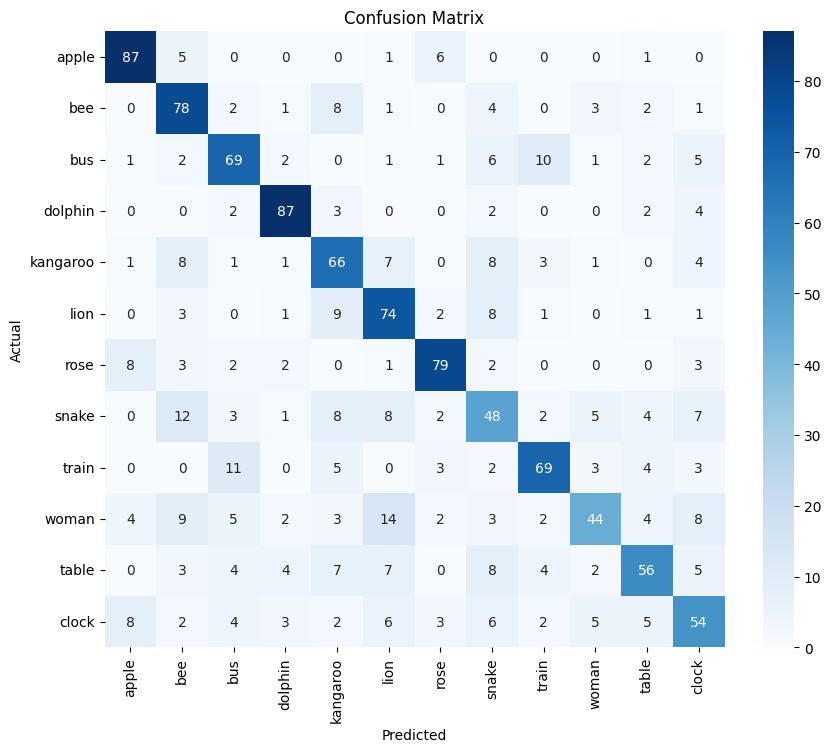

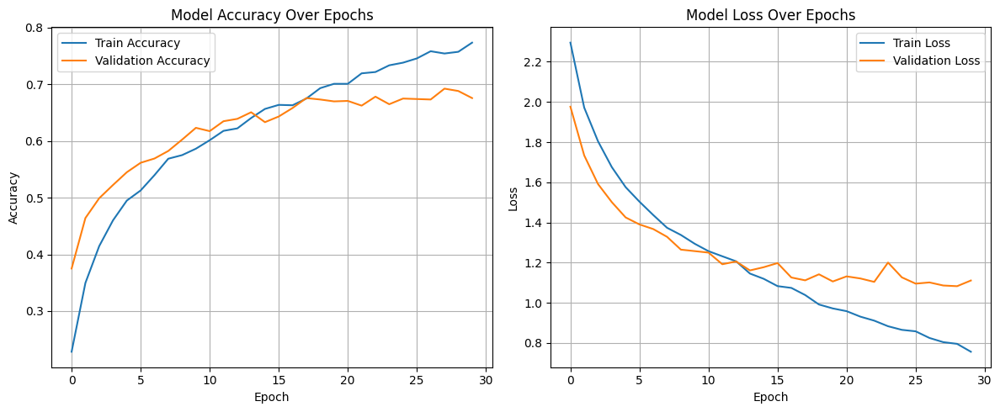

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of results:**

This configuration with ReLU across both convolutional and dense layers yielded a solid test accuracy of 67.58%. The training and validation accuracy curves were well aligned, indicating stable convergence and minimal overfitting. Most classes performed consistently, although classes like snake, woman, and clock had slightly lower precision. Overall, this experiment reaffirmed ReLU’s efficiency in gradient propagation and its reliability as a default choice for both convolutional and dense layers.

#### 5.3.2 Sigmoid in Conv and Dense Layers

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model architecture
model = Sequential([
    # Convolutional Block 1
    Conv2D(64, (3, 3), activation='sigmoid', padding='same', kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Convolutional Block 2
    Conv2D(128, (3, 3), activation='sigmoid', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # Dense Block
    Dense(128, activation='sigmoid'),
    Dropout(0.5),

    # Output Layer
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,125,900 (4.29 MB)

 Trainable params: 1,125,900 (4.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Add early stopping callback
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [ ]:
# Train the model
history = model.fit(x_train_subset, y_train_subset,
                            epochs=50,
                            batch_size=64,
                            validation_data=(x_test_subset, y_test_subset),
                            verbose=1,
                    callbacks=[early_stop])

Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.0809 - loss: 2.8691 - val_accuracy: 0.0833 - val_loss: 2.5040
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.0819 - loss: 2.6726 - val_accuracy: 0.0833 - val_loss: 2.4875
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0854 - loss: 2.6051 - val_accuracy: 0.0833 - val_loss: 2.4876
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0881 - loss: 2.5723 - val_accuracy: 0.0833 - val_loss: 2.4879
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0870 - loss: 2.5494 - val_accuracy: 0.0833 - val_loss: 2.4865
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0786 - loss: 2.5297 - val_accuracy: 0.0833 - val_loss: 2.4858
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0750 - loss: 2.5300 - val_accuracy: 0.0833 - val_loss: 2.4868
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0741 - loss: 2.5241 - val_accuracy: 0.0833 - val_los

Test Accuracy: 0.0833
Test Loss: 2.4858
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.00      0.00      0.00       100
         bee       0.00      0.00      0.00       100
         bus       0.00      0.00      0.00       100
     dolphin       0.00      0.00      0.00       100
    kangaroo       0.00      0.00      0.00       100
        lion       0.00      0.00      0.00       100
        rose       0.08      1.00      0.15       100
       snake       0.00      0.00      0.00       100
       train       0.00      0.00      0.00       100
       woman       0.00      0.00      0.00       100
       table       0.00      0.00      0.00       100
       clock       0.00      0.00      0.00       100

    accuracy                           0.08      1200
   macro avg       0.01      0.08      0.01      1200
weighted avg       0.01      0.08      0.01      1200



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


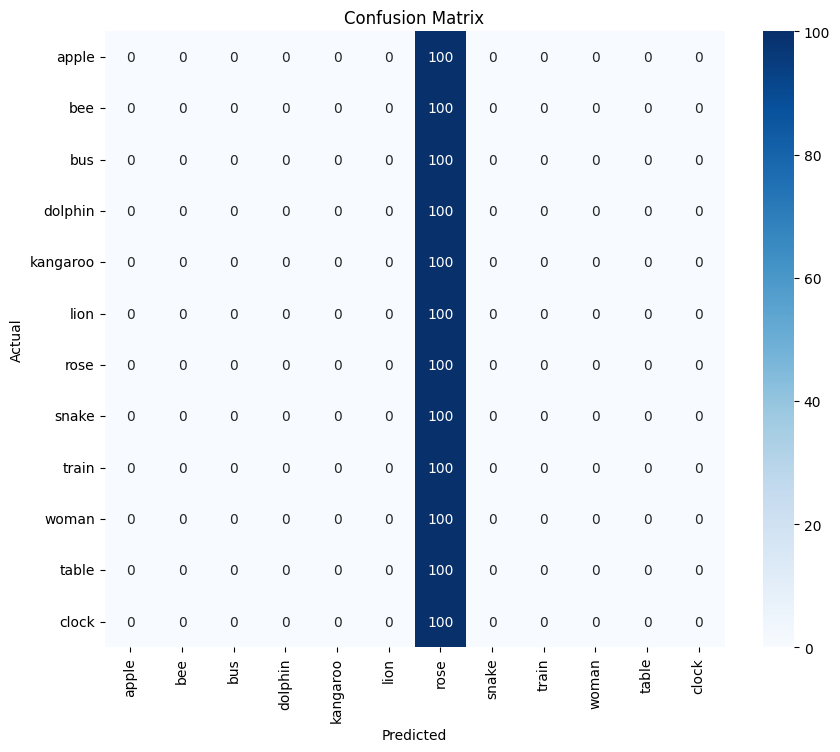

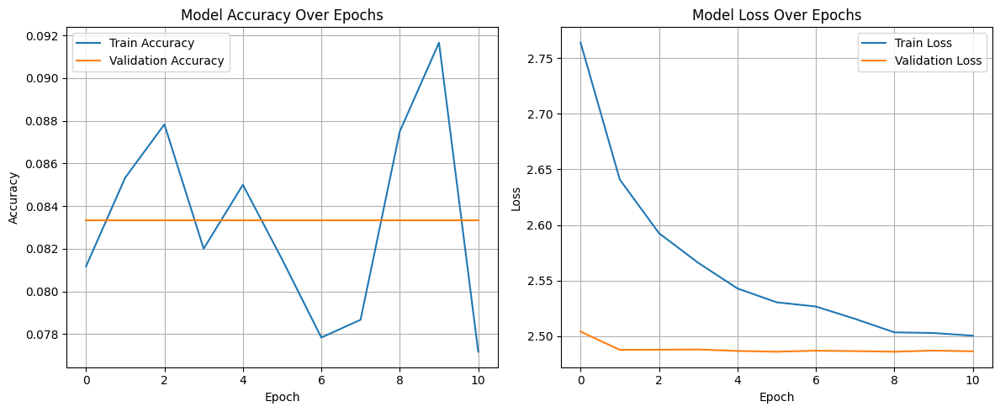

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of results:**

Switching all activation functions to Sigmoid resulted in a dramatic performance drop, with test accuracy collapsing to 8.33%. The model predicted a single class (rose) for all inputs, as seen in the confusion matrix. This is a classic case of the vanishing gradient problem, where Sigmoid squashes input values and causes gradients to vanish in deeper layers. This result clearly highlights Sigmoid’s unsuitability for deep CNNs, especially in convolutional layers.

#### 5.3.3  tanh in Conv and Dense Layers

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model architecture
model = Sequential([
    # Convolutional Block 1
    Conv2D(64, (3, 3), activation='tanh', padding='same', kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Convolutional Block 2
    Conv2D(128, (3, 3), activation='tanh', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # Dense Block
    Dense(128, activation='tanh'),
    Dropout(0.5),

    # Output Layer
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,125,900 (4.29 MB)

 Trainable params: 1,125,900 (4.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(x_train_subset, y_train_subset,
                    epochs=30,
                    batch_size=64,
                    validation_data=(x_test_subset, y_test_subset),
                    verbose=1,
                    #callbacks=[early_stop]
                    )

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.2802 - loss: 2.2711 - val_accuracy: 0.4783 - val_loss: 1.7022
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.4648 - loss: 1.7239 - val_accuracy: 0.5425 - val_loss: 1.5511
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5496 - loss: 1.4916 - val_accuracy: 0.4775 - val_loss: 1.6765
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5873 - loss: 1.3442 - val_accuracy: 0.5925 - val_loss: 1.3669
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6433 - loss: 1.2208 - val_accuracy: 0.5808 - val_loss: 1.3811
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6496 - loss: 1.1653 - val_accuracy: 0.6200 - val_loss: 1.3082
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6759 - loss: 1.0838 - val_accuracy: 0.6083 - val_loss: 1.3426
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.7136 - loss: 0.9972 - val_accuracy: 0.6300 - val_l

Test Accuracy: 0.6367
Test Loss: 1.6818
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.90      0.78      0.83       100
         bee       0.73      0.69      0.71       100
         bus       0.59      0.65      0.62       100
     dolphin       0.85      0.88      0.86       100
    kangaroo       0.63      0.49      0.55       100
        lion       0.58      0.82      0.68       100
        rose       0.80      0.72      0.76       100
       snake       0.38      0.54      0.44       100
       train       0.51      0.75      0.61       100
       woman       0.67      0.36      0.47       100
       table       0.64      0.47      0.54       100
       clock       0.64      0.49      0.55       100

    accuracy                           0.64      1200
   macro avg       0.66      0.64      0.64      1200
weighted avg       0.66      0.64      0.64      1200



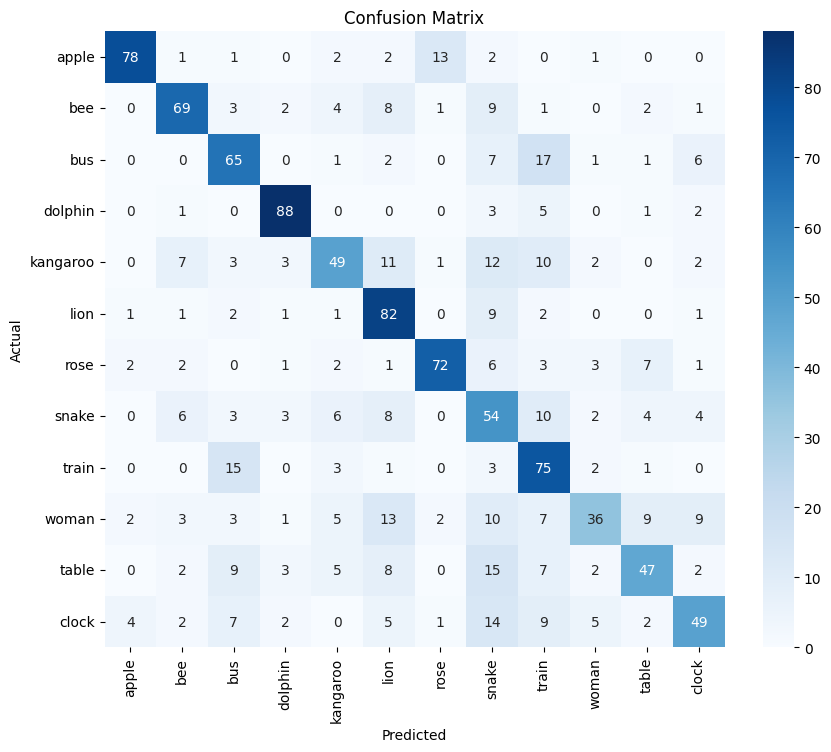

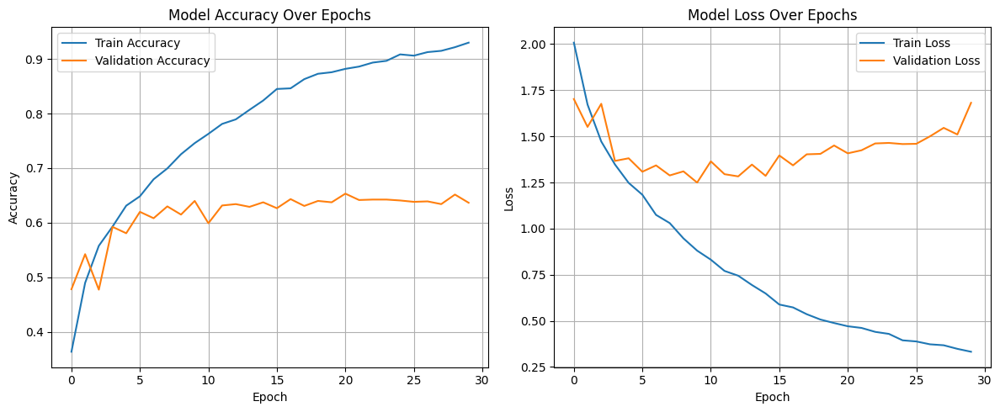

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results:**

With Tanh activations, the model recovered somewhat, achieving a test accuracy of 63.67%. While better than Sigmoid, performance remained below the ReLU-based configuration. Tanh handled gradients better than Sigmoid but still caused slower convergence. Some improvements in class recall were observed for train and lion, while the model still struggled with snake and woman. Tanh is marginally better than Sigmoid but still not optimal for CNNs on this dataset.

#### 5.3.4 LeakyReLU in Conv Layers and ReLU in Dense Layers

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model architecture
model = Sequential([
    # Convolutional Block 1
    Conv2D(64, (3, 3), padding='same', kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    LeakyReLU(alpha=0.1),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Convolutional Block 2
    Conv2D(128, (3, 3), padding='same', kernel_regularizer=l2(0.001)),
    LeakyReLU(alpha=0.1),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # Dense Block
    Dense(128, activation='relu'),
    Dropout(0.5),

    # Output Layer
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,125,900 (4.29 MB)

 Trainable params: 1,125,900 (4.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(x_train_subset, y_train_subset,
                    epochs=30,
                    batch_size=64,
                    validation_data=(x_test_subset, y_test_subset),
                    verbose=1,
                    #callbacks=[early_stop]
                    )

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - accuracy: 0.1899 - loss: 2.4010 - val_accuracy: 0.3867 - val_loss: 1.8581
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.3562 - loss: 1.9203 - val_accuracy: 0.4725 - val_loss: 1.6932
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4484 - loss: 1.7159 - val_accuracy: 0.5400 - val_loss: 1.4902
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5058 - loss: 1.5427 - val_accuracy: 0.5575 - val_loss: 1.4279
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5525 - loss: 1.4249 - val_accuracy: 0.5767 - val_loss: 1.3182
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5945 - loss: 1.3068 - val_accuracy: 0.6008 - val_loss: 1.2708
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6163 - loss: 1.2437 - val_accuracy: 0.6125 - val_loss: 1.2583
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6461 - loss: 1.1518 - val_accuracy: 0.6192 - val_los

Test Accuracy: 0.6967
Test Loss: 1.2133
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.89      0.88      0.88       100
         bee       0.80      0.78      0.79       100
         bus       0.69      0.68      0.68       100
     dolphin       0.82      0.87      0.84       100
    kangaroo       0.57      0.74      0.64       100
        lion       0.79      0.67      0.72       100
        rose       0.85      0.83      0.84       100
       snake       0.64      0.27      0.38       100
       train       0.61      0.75      0.67       100
       woman       0.58      0.68      0.62       100
       table       0.56      0.64      0.60       100
       clock       0.65      0.57      0.61       100

    accuracy                           0.70      1200
   macro avg       0.70      0.70      0.69      1200
weighted avg       0.70      0.70      0.69      1200



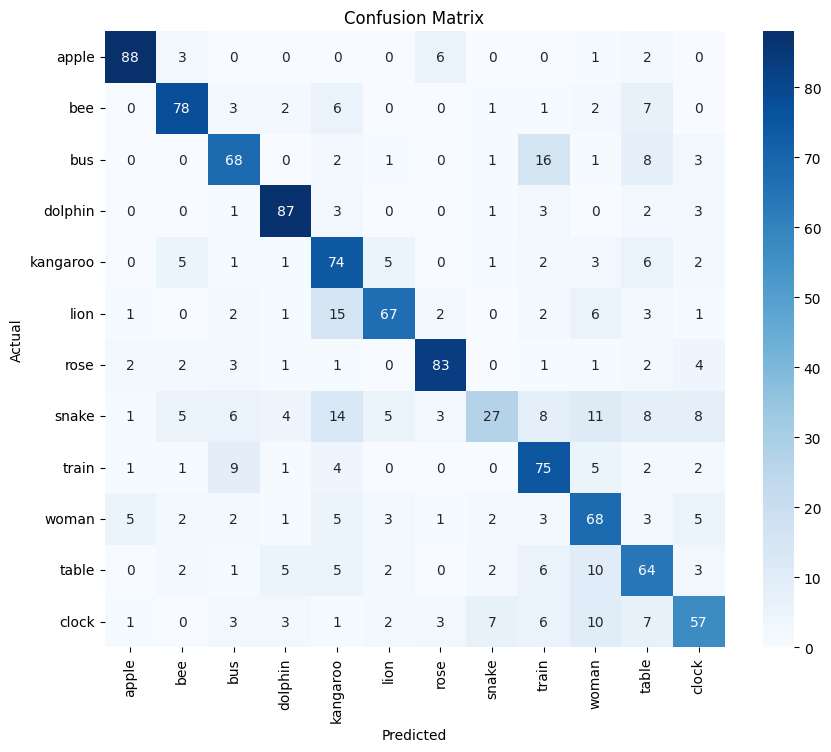

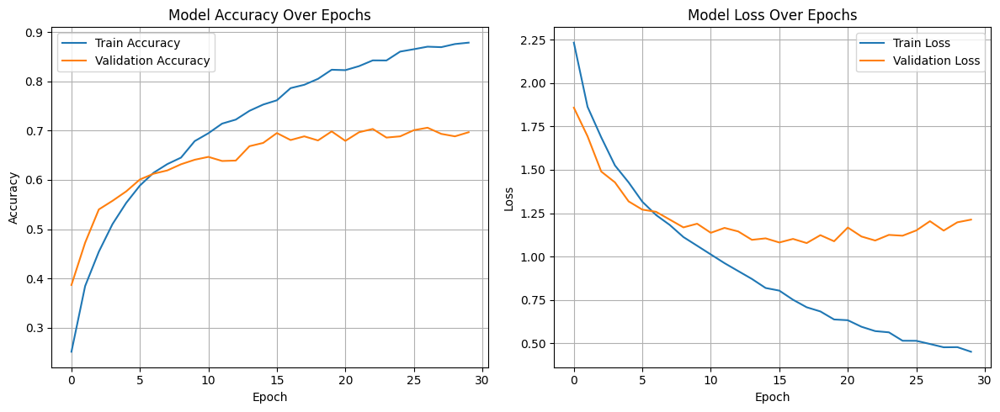

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results:**

This hybrid model showed the best accuracy of 69.67% among all setups in this task. LeakyReLU helped avoid the “dead neuron” problem that ReLU sometimes causes, especially in deep layers. The recall and precision for classes like kangaroo, train, and table improved slightly compared to ReLU-only models. This approach balanced gradient flow in convolutional layers and maintained strong learning capacity in dense layers, making it highly effective.

#### 5.3.5 ReLU in Conv Layers and Softmax in Hidden Dense Layer

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model architecture with ReLU in conv layers and Softmax in dense hidden layer
model = Sequential([
    # Convolutional Block 1
    Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Convolutional Block 2
    Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # Dense Block with Softmax
    Dense(128, activation='softmax'),
    Dropout(0.5),

    # Output Layer
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,125,900 (4.29 MB)

 Trainable params: 1,125,900 (4.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(x_train_subset, y_train_subset,
                    epochs=30,
                    batch_size=64,
                    validation_data=(x_test_subset, y_test_subset),
                    verbose=1,
                    callbacks=[early_stop])

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.1335 - loss: 2.5091 - val_accuracy: 0.2817 - val_loss: 2.3985
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1863 - loss: 2.3963 - val_accuracy: 0.2667 - val_loss: 2.3731
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1837 - loss: 2.3658 - val_accuracy: 0.2917 - val_loss: 2.3293
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1867 - loss: 2.3385 - val_accuracy: 0.2942 - val_loss: 2.2927
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2015 - loss: 2.3157 - val_accuracy: 0.2842 - val_loss: 2.2672
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1920 - loss: 2.3026 - val_accuracy: 0.2925 - val_loss: 2.2368
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1983 - loss: 2.2808 - val_accuracy: 0.3058 - val_loss: 2.2196
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1937 - loss: 2.2725 - val_accuracy: 0.2867 - val_los

Test Accuracy: 0.4767
Test Loss: 1.8244
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.52      0.87      0.65       100
         bee       0.59      0.60      0.59       100
         bus       0.57      0.37      0.45       100
     dolphin       0.87      0.85      0.86       100
    kangaroo       0.34      0.64      0.44       100
        lion       0.40      0.76      0.53       100
        rose       0.79      0.34      0.48       100
       snake       0.30      0.03      0.05       100
       train       0.49      0.56      0.52       100
       woman       0.39      0.13      0.20       100
       table       0.26      0.18      0.21       100
       clock       0.32      0.39      0.35       100

    accuracy                           0.48      1200
   macro avg       0.49      0.48      0.44      1200
weighted avg       0.49      0.48      0.44      1200



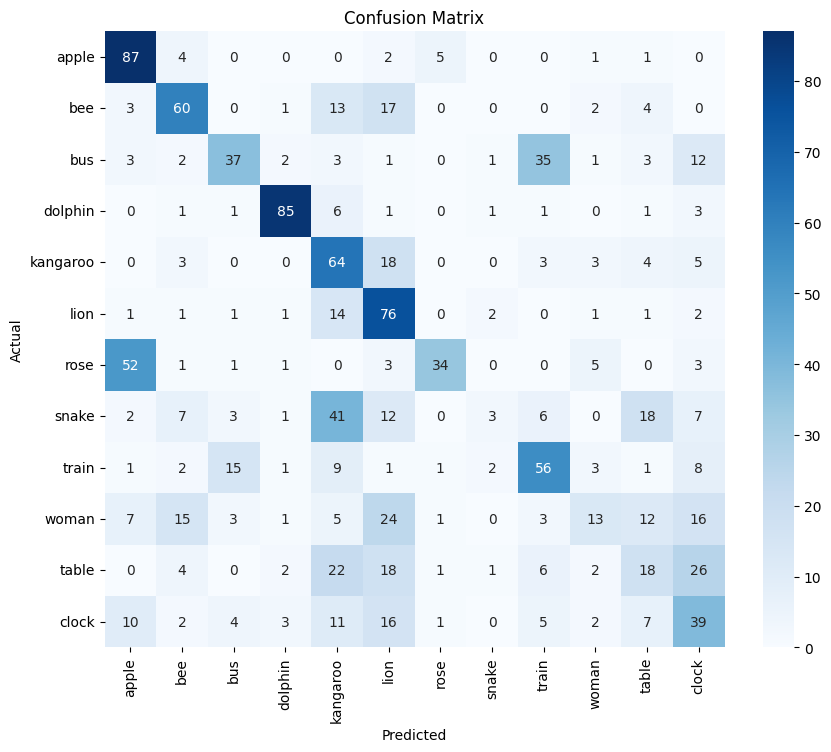

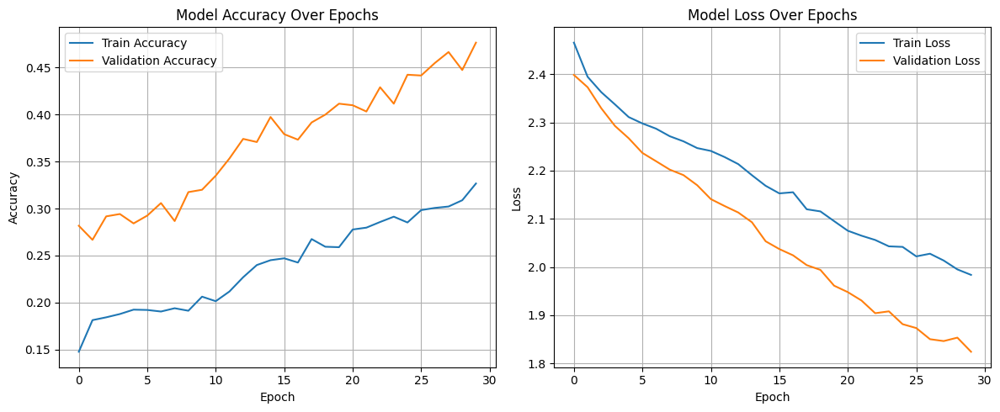

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results:**

Using Softmax in the hidden layer negatively impacted performance, yielding only 47.67% test accuracy. The model’s confidence became too distributed too early, impairing the learning of distinct patterns. The confusion matrix showed poor recall for several classes like snake, woman, and table. Softmax is ideal for output layers but clearly inappropriate for intermediate activations, as it limits non-linearity in hidden representations.

#### 5.3.6 Swish (or GELU) in Conv Layers and ReLU in Dense Layers

In [ ]:
# Clear previous model
tf.keras.backend.clear_session()

In [ ]:
# Define the model architecture
model = Sequential([
    # Convolutional Block 1
    Conv2D(64, (3, 3), activation=tf.keras.activations.swish, padding='same', kernel_regularizer=l2(0.001), input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Convolutional Block 2
    Conv2D(128, (3, 3), activation=tf.keras.activations.swish, padding='same', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # Dense Block with ReLU
    Dense(128, activation='relu'),
    Dropout(0.5),

    # Output Layer
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,125,900 (4.29 MB)

 Trainable params: 1,125,900 (4.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(x_train_subset, y_train_subset,
                    epochs=30,
                    batch_size=64,
                    validation_data=(x_test_subset, y_test_subset),
                    verbose=1,
                    callbacks=[early_stop])

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - accuracy: 0.2154 - loss: 2.3255 - val_accuracy: 0.4708 - val_loss: 1.7360
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4380 - loss: 1.7982 - val_accuracy: 0.5267 - val_loss: 1.5298
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5038 - loss: 1.6033 - val_accuracy: 0.5450 - val_loss: 1.4901
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5417 - loss: 1.4950 - val_accuracy: 0.5825 - val_loss: 1.3806
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5806 - loss: 1.3594 - val_accuracy: 0.5950 - val_loss: 1.3168
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6004 - loss: 1.2901 - val_accuracy: 0.6117 - val_loss: 1.2669
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6287 - loss: 1.2027 - val_accuracy: 0.6108 - val_loss: 1.2541
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6531 - loss: 1.1535 - val_accuracy: 0.6183 - val_los

Test Accuracy: 0.6458
Test Loss: 1.1604
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.85      0.82      0.84       100
         bee       0.58      0.78      0.66       100
         bus       0.58      0.67      0.62       100
     dolphin       0.83      0.87      0.85       100
    kangaroo       0.65      0.58      0.61       100
        lion       0.65      0.71      0.68       100
        rose       0.83      0.78      0.80       100
       snake       0.55      0.31      0.40       100
       train       0.61      0.73      0.67       100
       woman       0.53      0.55      0.54       100
       table       0.57      0.43      0.49       100
       clock       0.50      0.52      0.51       100

    accuracy                           0.65      1200
   macro avg       0.65      0.65      0.64      1200
weighted avg       0.65      0.65      0.64      1200



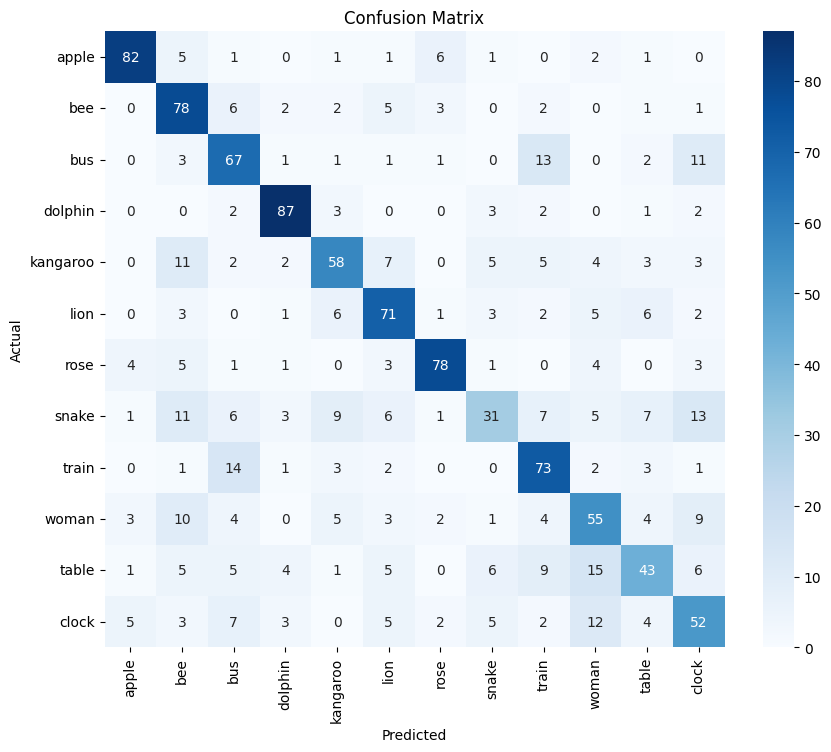

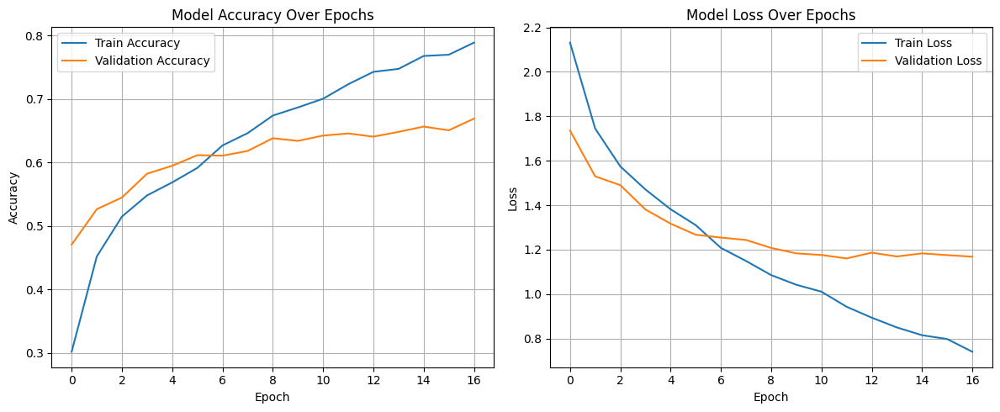

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results:**

Swish in convolutional layers with ReLU in dense layers led to 65.46% accuracy, slightly lower than the LeakyReLU model. Swish provided smooth activation transitions and helped in convergence, though not as aggressively as ReLU. Some classes like dolphin and rose were classified well, while snake and woman remained challenging. This model was more stable than pure ReLU but didn’t exceed the performance of the LeakyReLU variant.

#### Final Summary for Activation Function Comparison:

This experiment demonstrated that ReLU remains a reliable and high-performing activation for CNNs, especially when used in dense layers. However, combining LeakyReLU in convolutional layers with ReLU in dense layers gave the best results, addressing issues like dead neurons and improving recall in challenging classes. On the other hand, Sigmoid and Softmax activations in inner layers significantly impaired performance, confirming their unsuitability in deep convolutional pipelines. Swish (or GELU) provided a smooth and stable alternative but didn't outperform LeakyReLU. The results reinforce that activation choice plays a crucial role in deep learning architecture design, and the optimal setup often involves a hybrid of tailored activations depending on the layer type.



---



### Task 5.4: What is the effect of using different activation functions? how about combining the activation function choice with different network size and depth?

#### 5.4.1 Multi-Block Deep CNN with Stacked ReLU Layers for Feature Hierarchies

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# Define the model architecture
model = Sequential([
    # Block 1
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    # Block 2
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    # Block 3
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    # Block 4
    Conv2D(512, (3, 3), activation='relu', padding='same'),
    Conv2D(512, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    # Dense layers
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 4, 4, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 4, 4, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,314,508 (27.90 MB)

 Trainable params: 7,314,508 (27.90 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(x_train_subset, y_train_subset,
                    epochs=30,
                    batch_size=64,
                    validation_data=(x_test_subset, y_test_subset),
                    verbose=1,
                    #callbacks=[early_stop]
                    )

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - accuracy: 0.0763 - loss: 2.4908 - val_accuracy: 0.0833 - val_loss: 2.4850
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.0876 - loss: 2.4852 - val_accuracy: 0.0833 - val_loss: 2.4850
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.0886 - loss: 2.4852 - val_accuracy: 0.0833 - val_loss: 2.4850
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.0702 - loss: 2.4857 - val_accuracy: 0.0833 - val_loss: 2.4850
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - accuracy: 0.0870 - loss: 2.4853 - val_accuracy: 0.0833 - val_loss: 2.4849
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.0893 - loss: 2.4853 - val_accuracy: 0.0833 - val_loss: 2.4849
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - accuracy: 0.0757 - loss: 2.4852 - val_accuracy: 0.0833 - val_loss: 2.4849
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.0786 - loss: 2.4852 - val_accuracy: 0.0833 -

Test Accuracy: 0.0833
Test Loss: 2.4849
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.00      0.00      0.00       100
         bee       0.00      0.00      0.00       100
         bus       0.00      0.00      0.00       100
     dolphin       0.00      0.00      0.00       100
    kangaroo       0.00      0.00      0.00       100
        lion       0.00      0.00      0.00       100
        rose       0.08      1.00      0.15       100
       snake       0.00      0.00      0.00       100
       train       0.00      0.00      0.00       100
       woman       0.00      0.00      0.00       100
       table       0.00      0.00      0.00       100
       clock       0.00      0.00      0.00       100

    accuracy                           0.08      1200
   macro avg       0.01      0.08      0.01      1200
weighted avg       0.01      0.08      0.01      1200



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


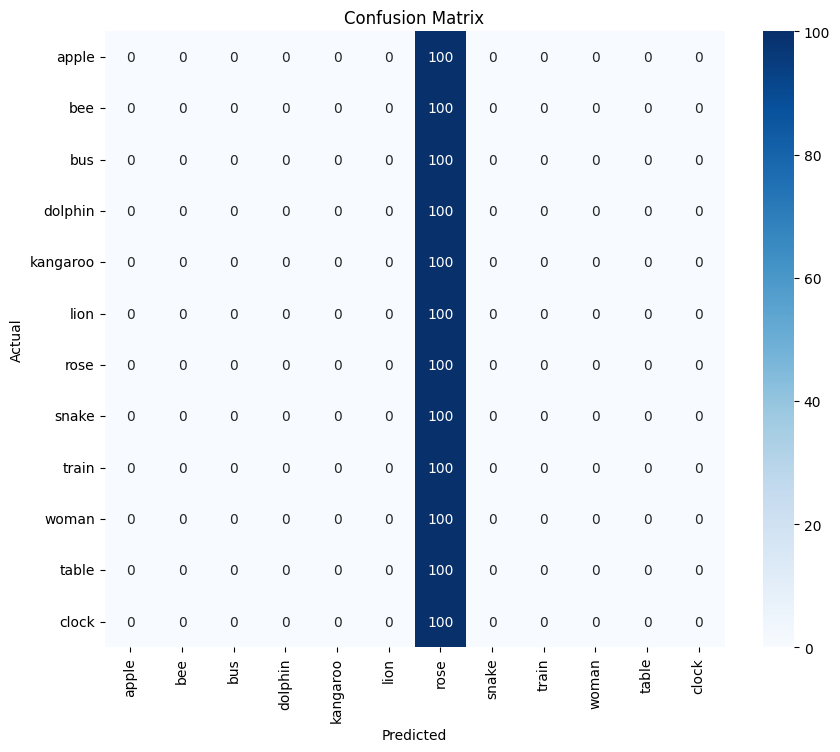

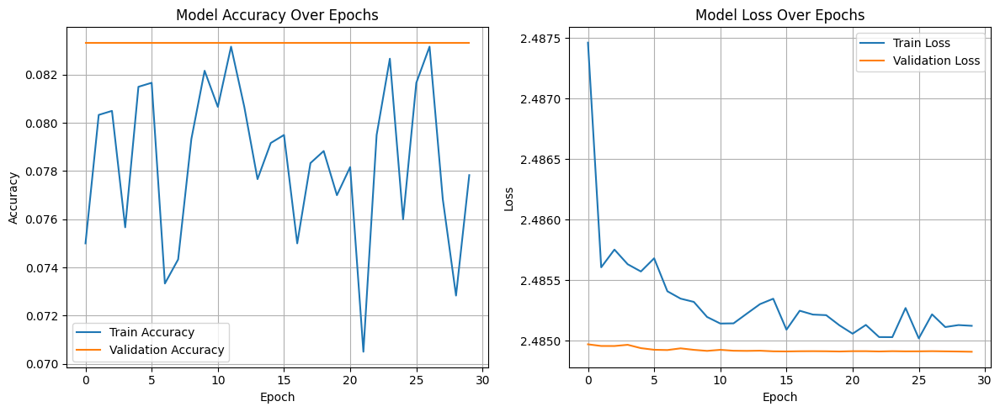

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results:**

Despite its high complexity and large number of parameters, this very deep model with stacked ReLU layers completely failed to generalize, giving a test accuracy of just 8.33%. The confusion matrix confirms the model predicted the same class (rose) for all test samples — a strong signal of training collapse or failure in gradient propagation. Interestingly, this model was built with sound architecture blocks, but likely due to unbalanced initialization, exploding gradients, or improper optimizer tuning, the learning didn’t progress at all. The excessive depth without complementary regularization (e.g., BatchNorm) made it too unstable for this dataset.

#### 5.4.2 Four-Layer Convolutional Network with Tanh for Smoother Gradients

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
model = Sequential([
    Conv2D(64, (3, 3), activation='tanh', padding='same', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation='tanh', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(128, (3, 3), activation='tanh', padding='same'),
    Conv2D(128, (3, 3), activation='tanh', padding='same'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    Dense(512, activation='tanh'),
    Dropout(0.5),

    Dense(num_classes, activation='softmax')
])


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,461,132 (17.02 MB)

 Trainable params: 4,461,132 (17.02 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(x_train_subset, y_train_subset,
                    epochs=30,
                    batch_size=64,
                    validation_data=(x_test_subset, y_test_subset),
                    verbose=1,
                    #callbacks=[early_stop]
                    )

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2196 - loss: 3.2064 - val_accuracy: 0.3983 - val_loss: 1.8267
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.4675 - loss: 1.5837 - val_accuracy: 0.5000 - val_loss: 1.4997
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.5653 - loss: 1.3481 - val_accuracy: 0.5408 - val_loss: 1.3839
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6248 - loss: 1.1641 - val_accuracy: 0.5633 - val_loss: 1.4337
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6814 - loss: 0.9902 - val_accuracy: 0.6075 - val_loss: 1.1880
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7254 - loss: 0.8450 - val_accuracy: 0.6025 - val_loss: 1.2922
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7630 - loss: 0.7055 - val_accuracy: 0.6325 - val_loss: 1.2340
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.8109 - loss: 0.5799 - val_accuracy: 0.6258 -

Test Accuracy: 0.6500
Test Loss: 1.7975
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.81      0.84      0.82       100
         bee       0.69      0.66      0.67       100
         bus       0.57      0.74      0.64       100
     dolphin       0.81      0.88      0.85       100
    kangaroo       0.67      0.44      0.53       100
        lion       0.54      0.77      0.63       100
        rose       0.82      0.70      0.76       100
       snake       0.41      0.56      0.48       100
       train       0.61      0.73      0.66       100
       woman       0.76      0.42      0.54       100
       table       0.66      0.52      0.58       100
       clock       0.68      0.54      0.60       100

    accuracy                           0.65      1200
   macro avg       0.67      0.65      0.65      1200
weighted avg       0.67      0.65      0.65      1200



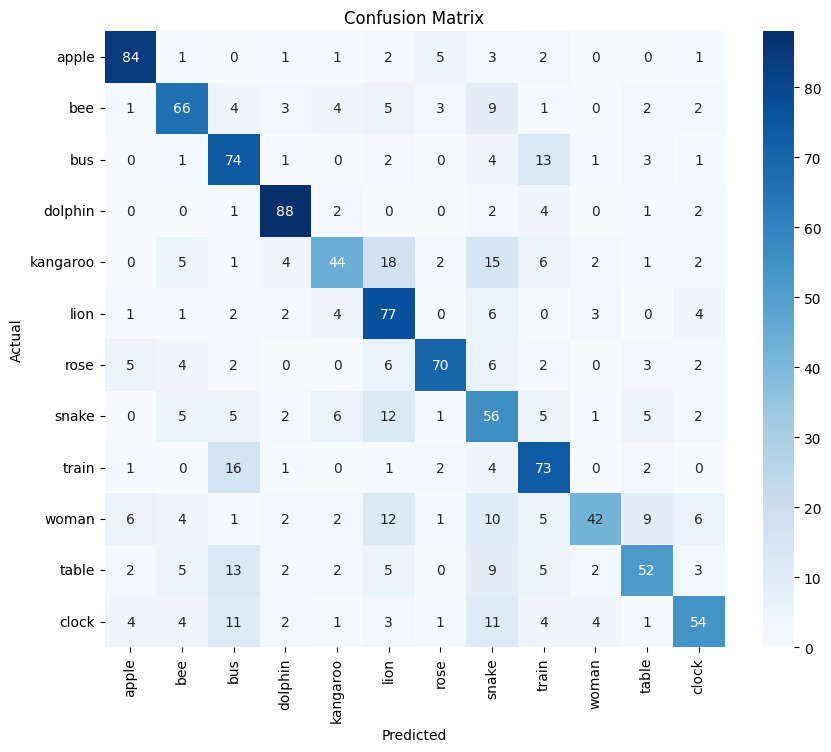

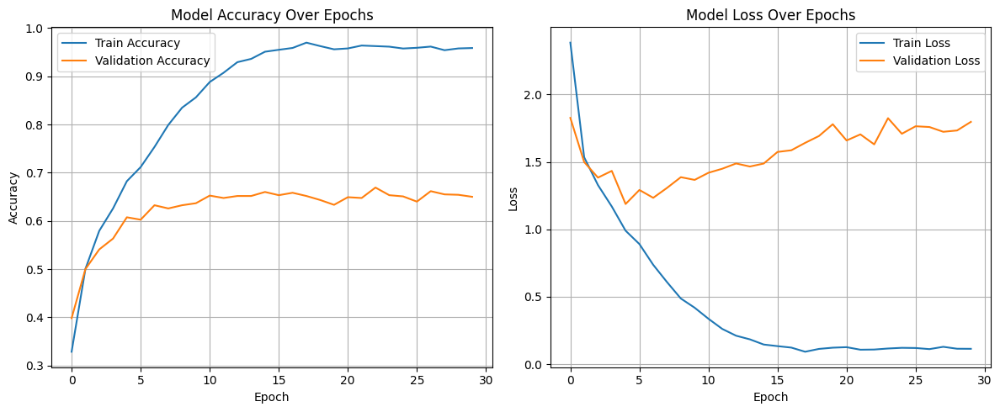

In [ ]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**Analysis of Results:**

In contrast, this model used a balanced 4-layer convolutional structure and switched to Tanh activations. It achieved a significantly better accuracy of 65%, with smoother convergence and more reliable classification across most classes. While it didn't outperform the simpler ReLU-based models from previous tasks, it did show that using Tanh in moderately deep networks can maintain gradient stability and avoid overfitting. Classes like apple, dolphin, and rose were classified with high precision, though the model still struggled with overlapping visual categories like kangaroo and woman.

#### Final Summary for Activation + Depth Neural Networks:

This task clearly illustrates that deeper isn't always better. The extremely deep CNN with ReLU activations struggled due to optimization issues — possibly due to the lack of intermediate normalization and over-reliance on ReLU, which can deadlock in deeper stacks. On the other hand, a moderately deep network with Tanh activations showed stable learning and reasonable generalization. These results highlight that activation choice must complement network depth: deep networks need safeguards like careful initialization, gradient control, or advanced activations (e.g., Swish), whereas moderate-depth models benefit from smoother activations like Tanh that prevent instability in training.



---



### Task 5.5: Experiment with various optimizers (https://keras.io/api/optimizers/) and learning rate. What is the effect on the resulting model accuracy?


In [16]:
tf.keras.backend.clear_session()


===== Training with Adam_0.01 =====
Test Accuracy: 0.0833
Test Loss: 2.4850
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.00      0.00      0.00       100
         bee       0.00      0.00      0.00       100
         bus       0.00      0.00      0.00       100
     dolphin       0.00      0.00      0.00       100
    kangaroo       0.00      0.00      0.00       100
        lion       0.00      0.00      0.00       100
        rose       0.08      1.00      0.15       100
       snake       0.00      0.00      0.00       100
       train       0.00      0.00      0.00       100
       woman       0.00      0.00      0.00       100
       table       0.00      0.00      0.00       100
       clock       0.00      0.00      0.00       100

    accuracy                           0.08      1200
   macro avg       0.01      0.08      0.01      1200
weighted avg       0.01      0.08      0.01    

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


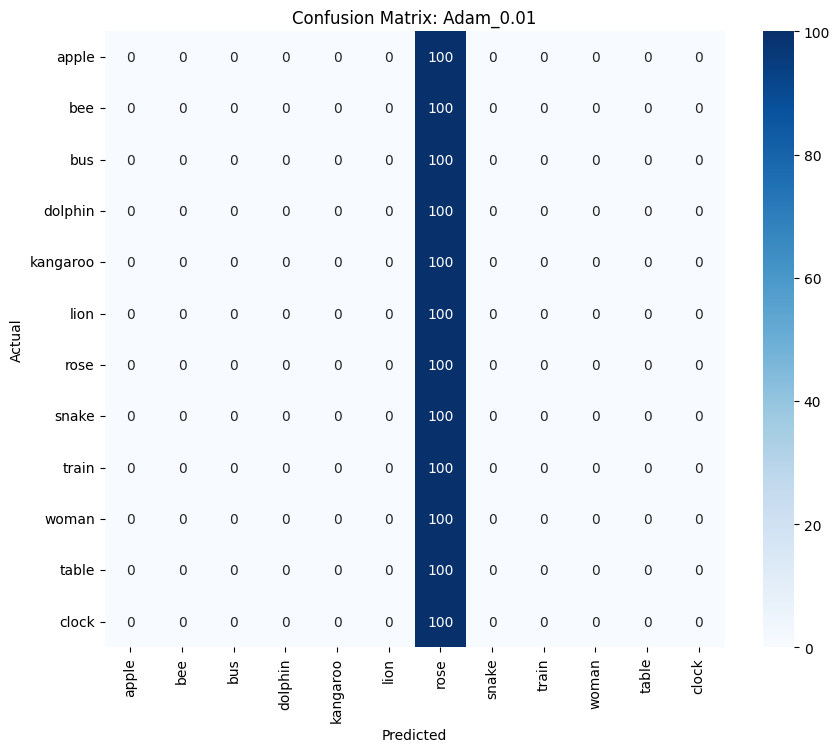

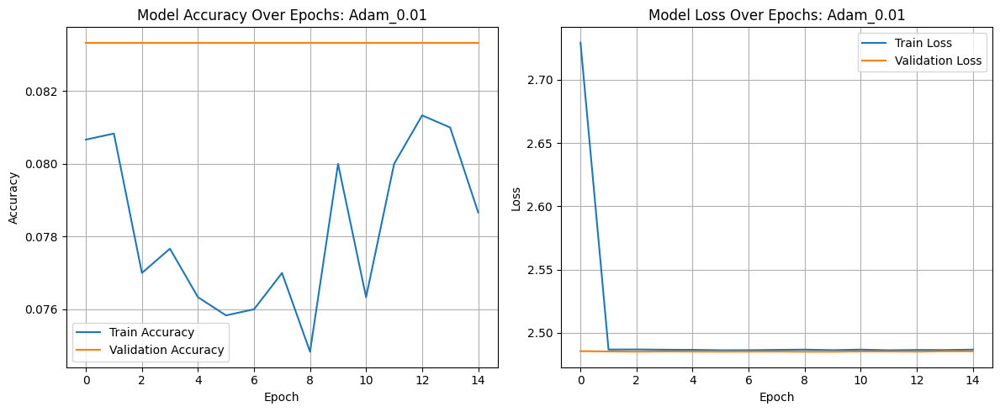


===== Training with Adam_0.001 =====
Test Accuracy: 0.6583
Test Loss: 1.0403
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.78      0.83      0.80       100
         bee       0.68      0.76      0.72       100
         bus       0.72      0.52      0.60       100
     dolphin       0.89      0.86      0.87       100
    kangaroo       0.53      0.63      0.58       100
        lion       0.65      0.76      0.70       100
        rose       0.85      0.79      0.82       100
       snake       0.51      0.35      0.41       100
       train       0.52      0.77      0.62       100
       woman       0.60      0.68      0.64       100
       table       0.75      0.41      0.53       100
       clock       0.54      0.54      0.54       100

    accuracy                           0.66      1200
   macro avg       0.67      0.66      0.65      1200
weighted avg       0.67      0.66      0.65   

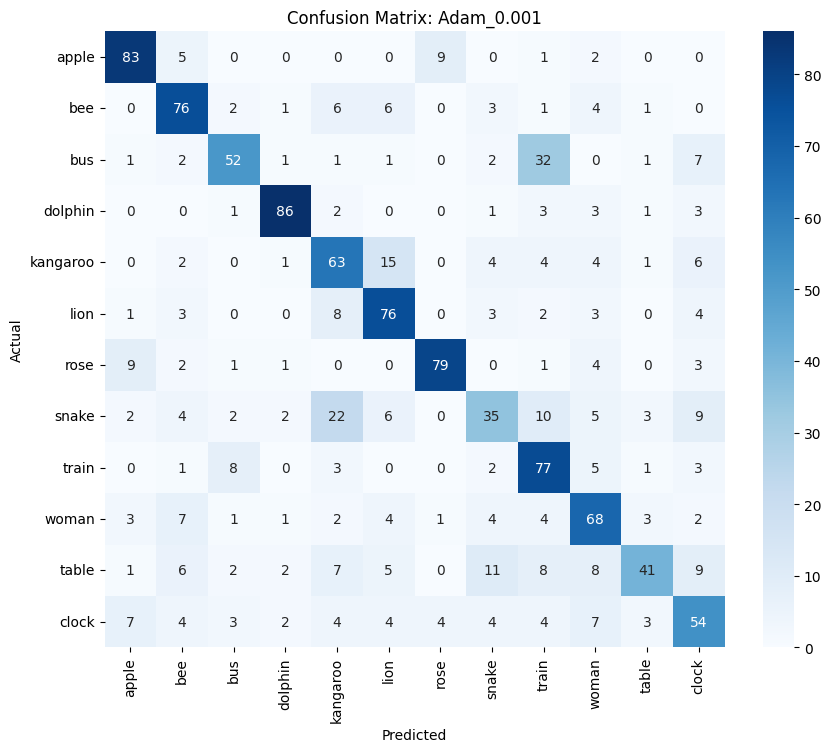

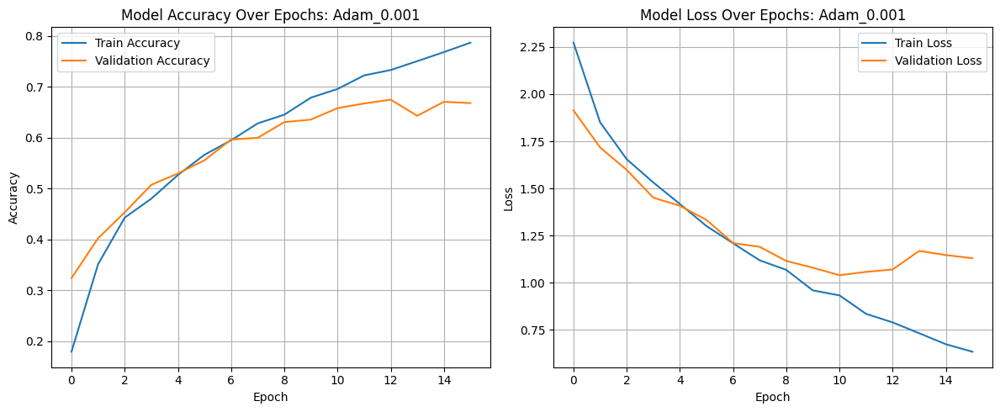


===== Training with Adam_0.0001 =====
Test Accuracy: 0.6117
Test Loss: 1.1461
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.72      0.84      0.78       100
         bee       0.56      0.77      0.65       100
         bus       0.56      0.63      0.59       100
     dolphin       0.84      0.88      0.86       100
    kangaroo       0.77      0.37      0.50       100
        lion       0.59      0.74      0.65       100
        rose       0.78      0.70      0.74       100
       snake       0.49      0.44      0.47       100
       train       0.61      0.63      0.62       100
       woman       0.49      0.46      0.48       100
       table       0.51      0.47      0.49       100
       clock       0.46      0.41      0.43       100

    accuracy                           0.61      1200
   macro avg       0.62      0.61      0.60      1200
weighted avg       0.62      0.61      0.60  

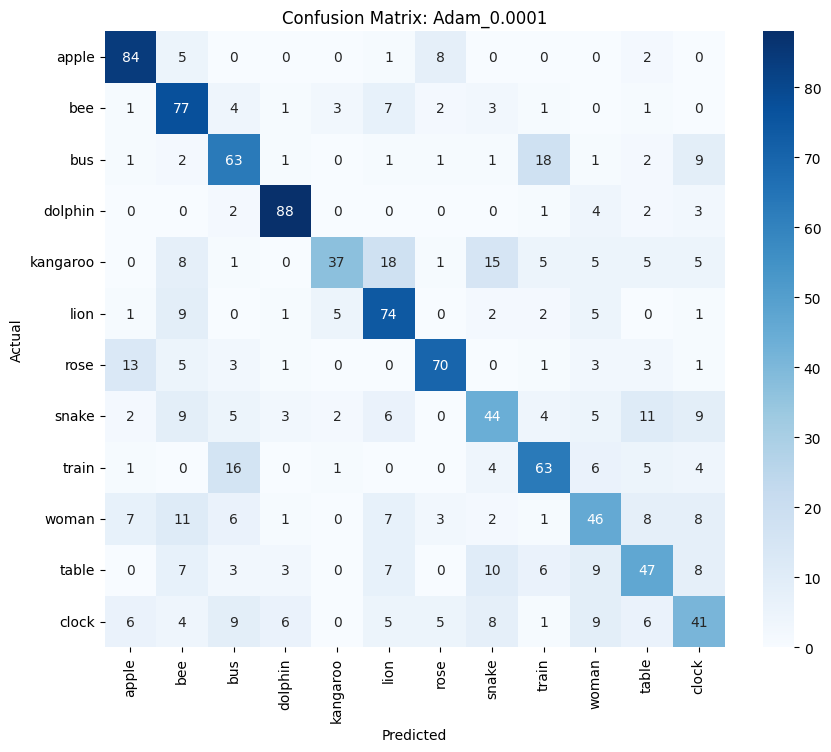

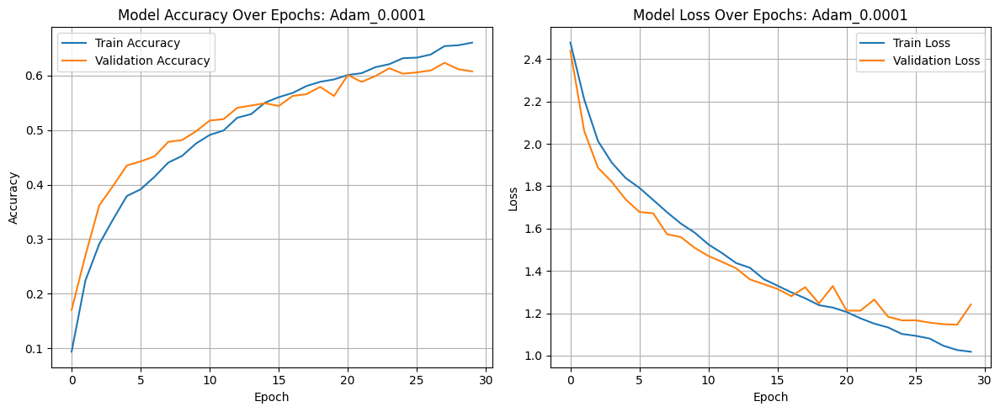


===== Training with AdamW_0.001 =====
Test Accuracy: 0.6575
Test Loss: 1.0853
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.68      0.91      0.78       100
         bee       0.73      0.69      0.71       100
         bus       0.57      0.77      0.66       100
     dolphin       0.83      0.89      0.86       100
    kangaroo       0.57      0.65      0.60       100
        lion       0.69      0.70      0.69       100
        rose       0.80      0.68      0.74       100
       snake       0.57      0.35      0.43       100
       train       0.64      0.69      0.66       100
       woman       0.61      0.53      0.57       100
       table       0.63      0.50      0.56       100
       clock       0.57      0.53      0.55       100

    accuracy                           0.66      1200
   macro avg       0.66      0.66      0.65      1200
weighted avg       0.66      0.66      0.65  

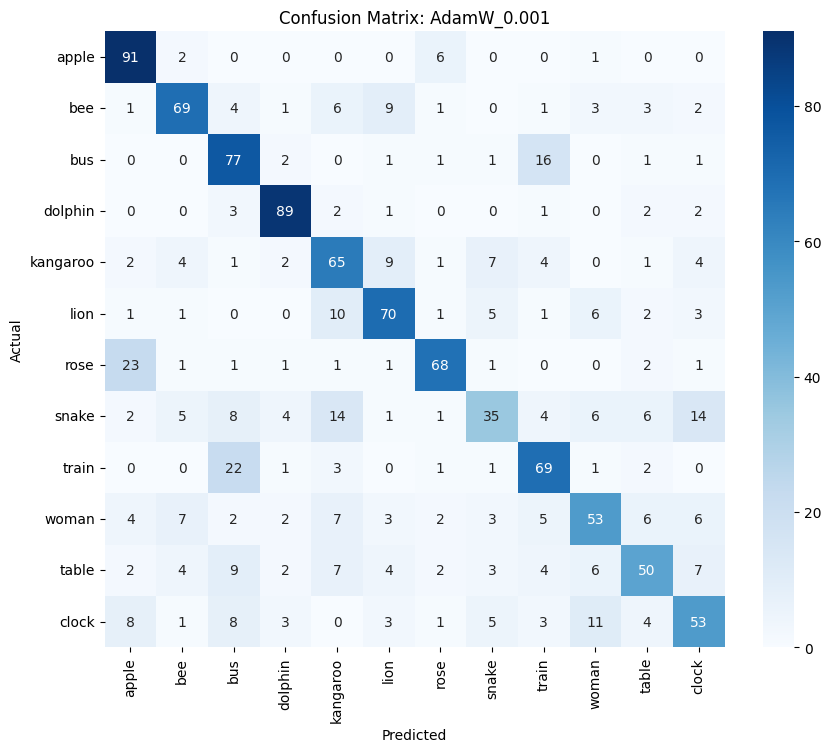

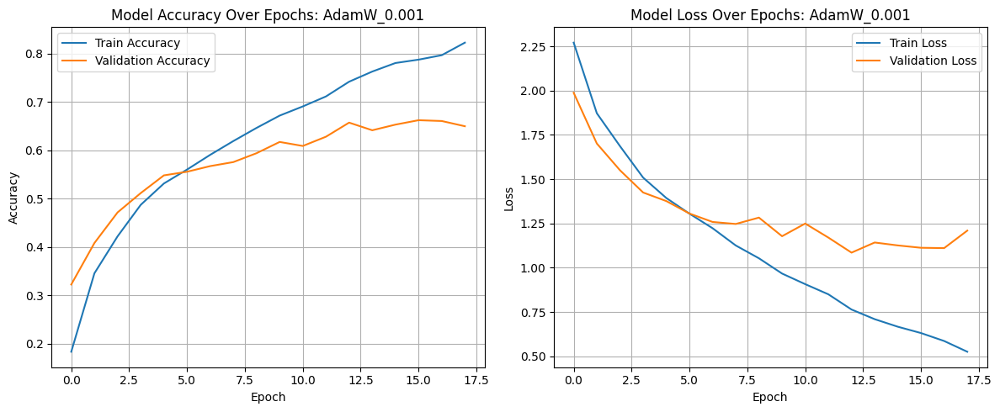


===== Training with AdamW_0.0001 =====
Test Accuracy: 0.6175
Test Loss: 1.1894
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.87      0.77      0.81       100
         bee       0.70      0.62      0.66       100
         bus       0.50      0.67      0.57       100
     dolphin       0.77      0.90      0.83       100
    kangaroo       0.60      0.52      0.56       100
        lion       0.62      0.74      0.68       100
        rose       0.79      0.77      0.78       100
       snake       0.50      0.52      0.51       100
       train       0.61      0.69      0.65       100
       woman       0.48      0.40      0.43       100
       table       0.46      0.47      0.47       100
       clock       0.51      0.34      0.41       100

    accuracy                           0.62      1200
   macro avg       0.62      0.62      0.61      1200
weighted avg       0.62      0.62      0.61 

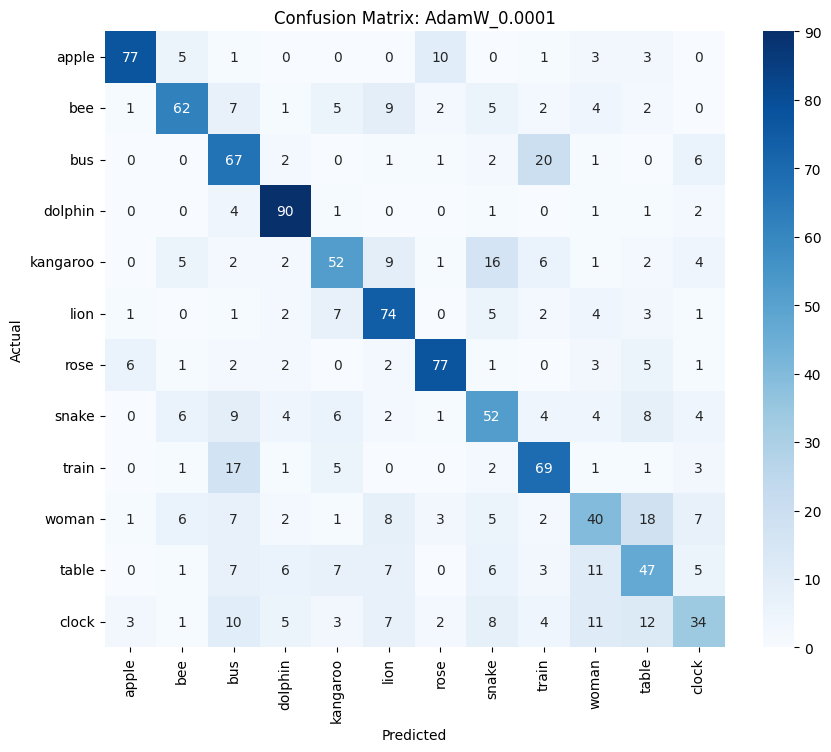

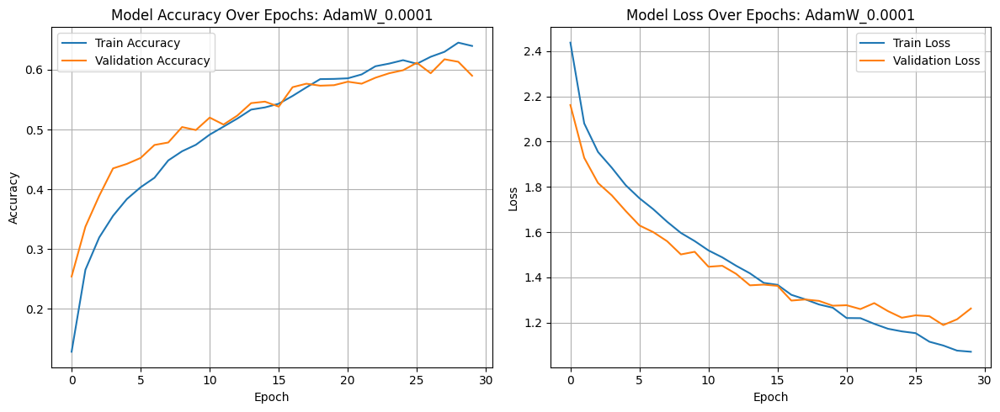


===== Training with SGD_0.01 =====
Test Accuracy: 0.4708
Test Loss: 1.5520
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.65      0.64      0.64       100
         bee       0.58      0.42      0.49       100
         bus       0.55      0.35      0.43       100
     dolphin       0.68      0.90      0.77       100
    kangaroo       0.29      0.66      0.40       100
        lion       0.37      0.67      0.47       100
        rose       0.71      0.65      0.68       100
       snake       0.27      0.04      0.07       100
       train       0.55      0.57      0.56       100
       woman       0.36      0.22      0.27       100
       table       0.39      0.13      0.20       100
       clock       0.34      0.40      0.37       100

    accuracy                           0.47      1200
   macro avg       0.48      0.47      0.45      1200
weighted avg       0.48      0.47      0.45     

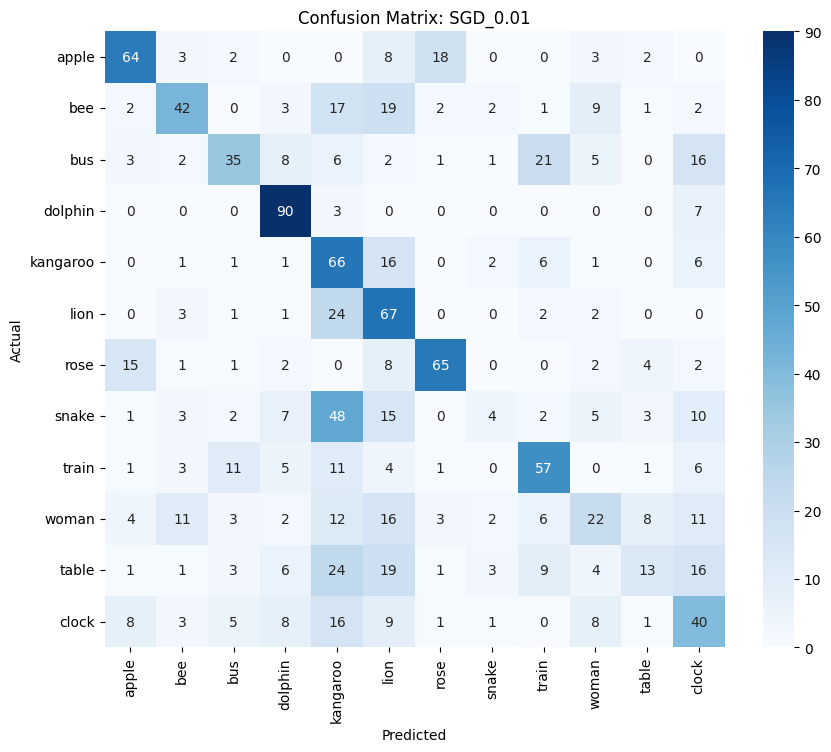

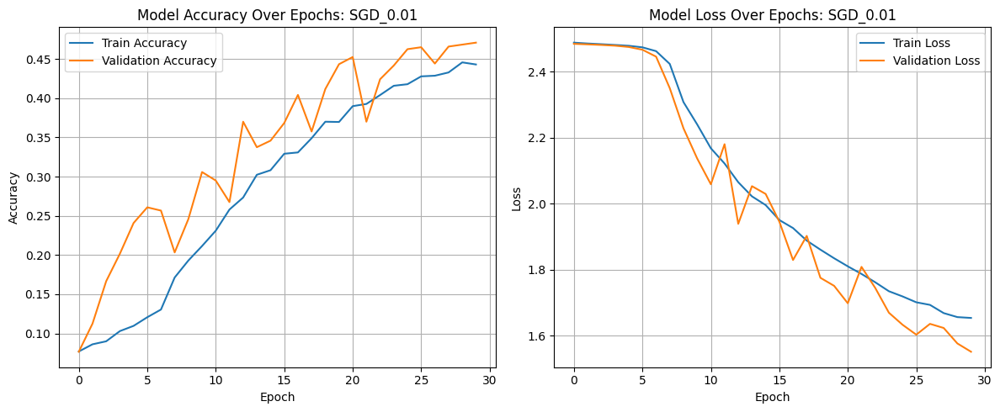


===== Training with SGD_0.001 =====
Test Accuracy: 0.2108
Test Loss: 2.4730
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.23      0.72      0.35       100
         bee       0.00      0.00      0.00       100
         bus       0.33      0.01      0.02       100
     dolphin       0.52      0.46      0.49       100
    kangaroo       0.00      0.00      0.00       100
        lion       0.33      0.16      0.22       100
        rose       0.25      0.01      0.02       100
       snake       0.00      0.00      0.00       100
       train       0.35      0.51      0.41       100
       woman       0.22      0.02      0.04       100
       table       0.00      0.00      0.00       100
       clock       0.11      0.64      0.19       100

    accuracy                           0.21      1200
   macro avg       0.20      0.21      0.14      1200
weighted avg       0.20      0.21      0.14    

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


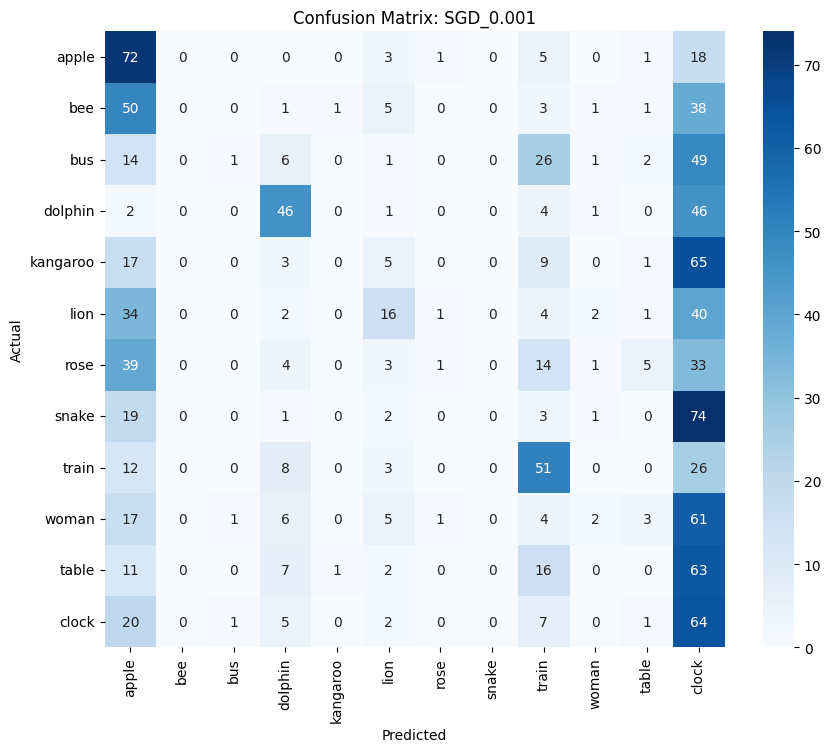

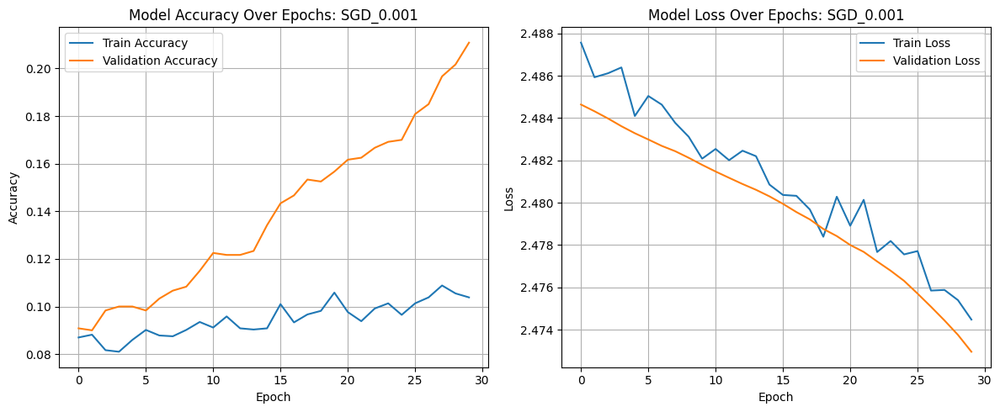


===== Training with SGD_Momentum_0.01 =====
Test Accuracy: 0.6575
Test Loss: 1.0931
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.75      0.87      0.81       100
         bee       0.66      0.67      0.67       100
         bus       0.58      0.64      0.61       100
     dolphin       0.90      0.88      0.89       100
    kangaroo       0.62      0.61      0.62       100
        lion       0.58      0.78      0.67       100
        rose       0.87      0.72      0.79       100
       snake       0.54      0.52      0.53       100
       train       0.72      0.60      0.66       100
       woman       0.62      0.53      0.57       100
       table       0.53      0.58      0.56       100
       clock       0.57      0.49      0.53       100

    accuracy                           0.66      1200
   macro avg       0.66      0.66      0.66      1200
weighted avg       0.66      0.66      

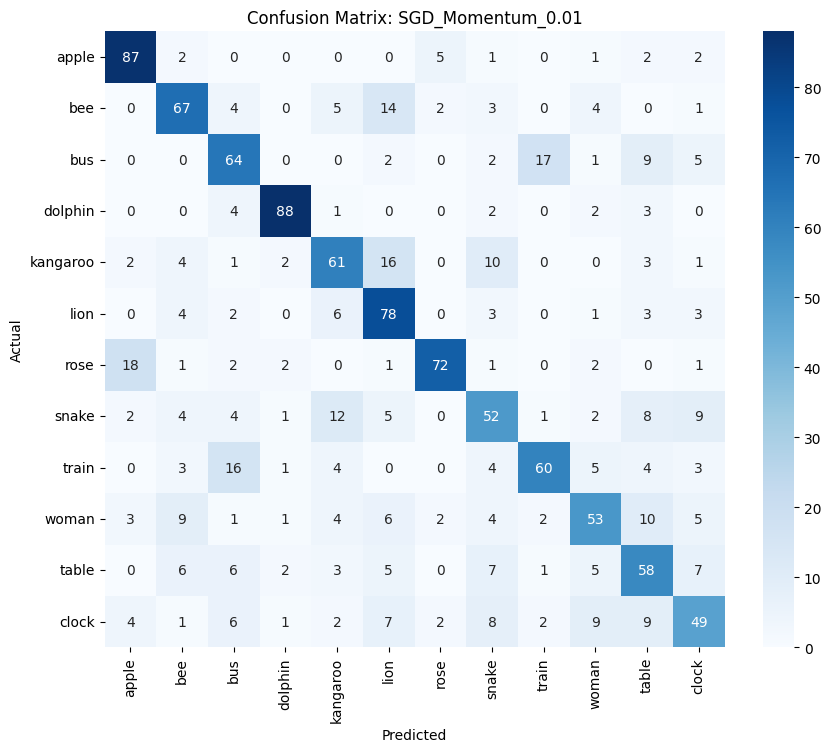

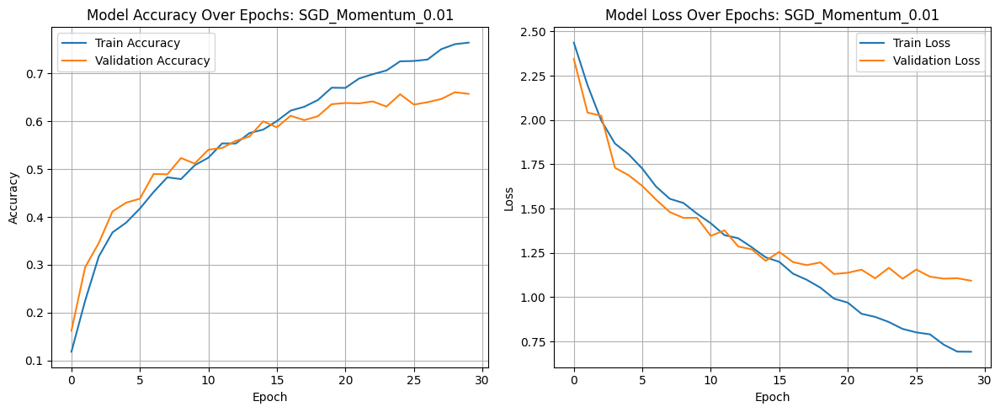


===== Training with SGD_Momentum_0.001 =====
Test Accuracy: 0.4900
Test Loss: 1.5122
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.63      0.66      0.65       100
         bee       0.55      0.54      0.54       100
         bus       0.49      0.37      0.42       100
     dolphin       0.75      0.86      0.80       100
    kangaroo       0.33      0.62      0.43       100
        lion       0.40      0.68      0.51       100
        rose       0.66      0.64      0.65       100
       snake       0.29      0.18      0.22       100
       train       0.52      0.58      0.55       100
       woman       0.45      0.24      0.31       100
       table       0.40      0.21      0.28       100
       clock       0.42      0.30      0.35       100

    accuracy                           0.49      1200
   macro avg       0.49      0.49      0.48      1200
weighted avg       0.49      0.49     

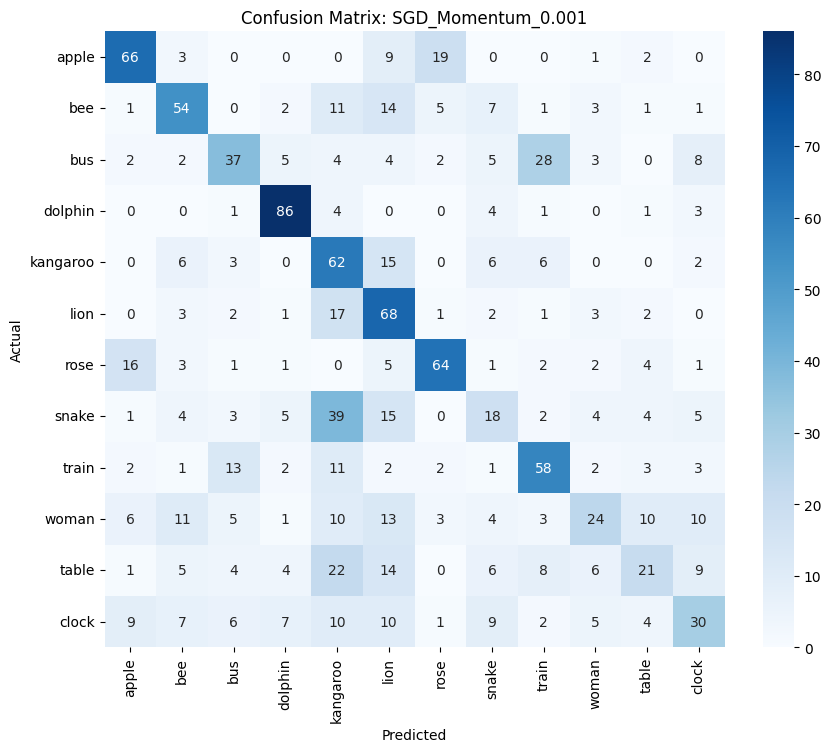

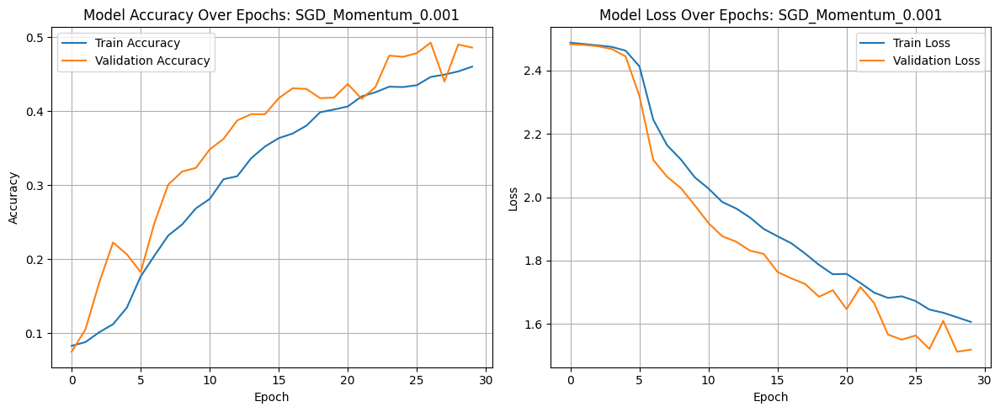


===== Training with RMSprop_0.001 =====
Test Accuracy: 0.6658
Test Loss: 1.1026
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.78      0.86      0.82       100
         bee       0.68      0.75      0.71       100
         bus       0.62      0.64      0.63       100
     dolphin       0.91      0.84      0.88       100
    kangaroo       0.57      0.70      0.63       100
        lion       0.72      0.63      0.67       100
        rose       0.84      0.73      0.78       100
       snake       0.64      0.29      0.40       100
       train       0.56      0.80      0.66       100
       woman       0.58      0.63      0.61       100
       table       0.68      0.53      0.60       100
       clock       0.53      0.59      0.56       100

    accuracy                           0.67      1200
   macro avg       0.68      0.67      0.66      1200
weighted avg       0.68      0.67      0.66

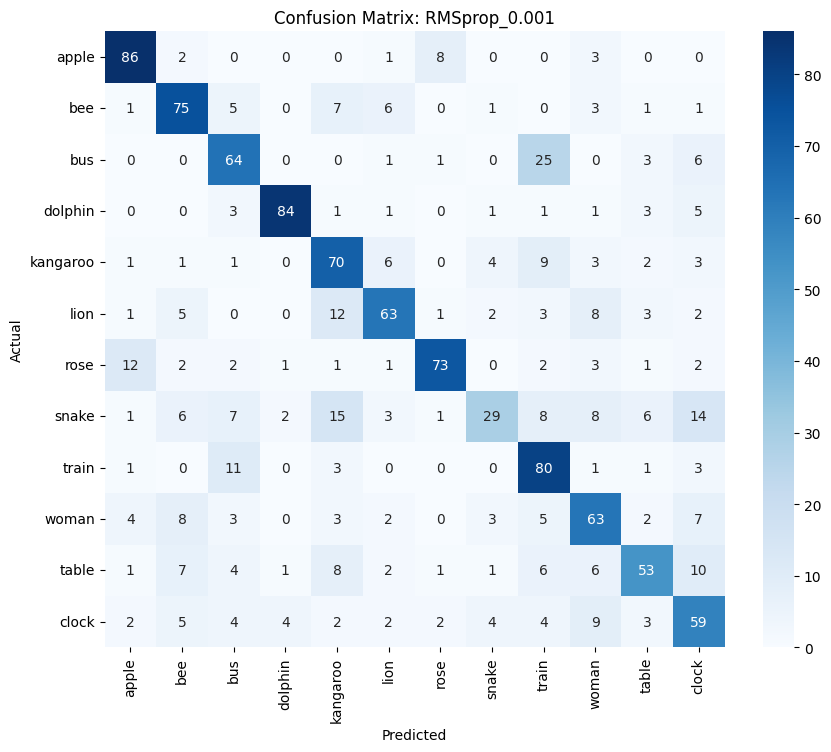

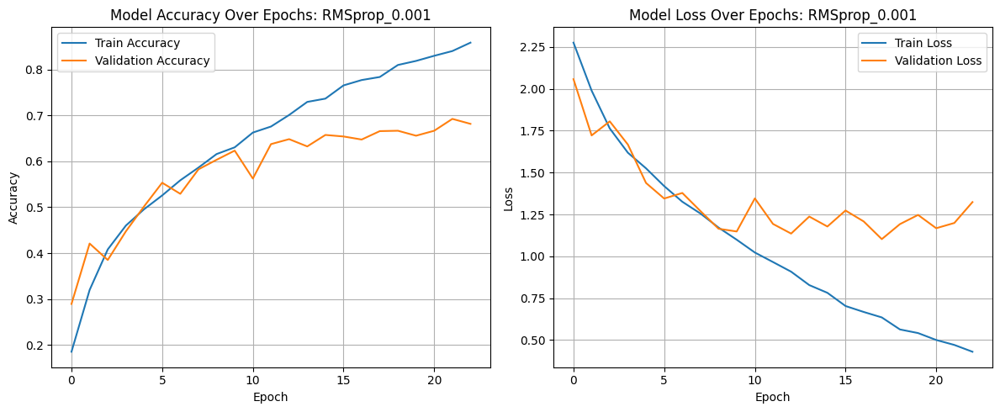


===== Training with RMSprop_0.0005 =====
Test Accuracy: 0.6825
Test Loss: 1.0905
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.89      0.79      0.84       100
         bee       0.67      0.79      0.72       100
         bus       0.61      0.72      0.66       100
     dolphin       0.76      0.92      0.83       100
    kangaroo       0.65      0.65      0.65       100
        lion       0.62      0.71      0.66       100
        rose       0.79      0.84      0.81       100
       snake       0.68      0.32      0.44       100
       train       0.72      0.63      0.67       100
       woman       0.56      0.74      0.64       100
       table       0.66      0.53      0.59       100
       clock       0.63      0.55      0.59       100

    accuracy                           0.68      1200
   macro avg       0.69      0.68      0.68      1200
weighted avg       0.69      0.68      0.6

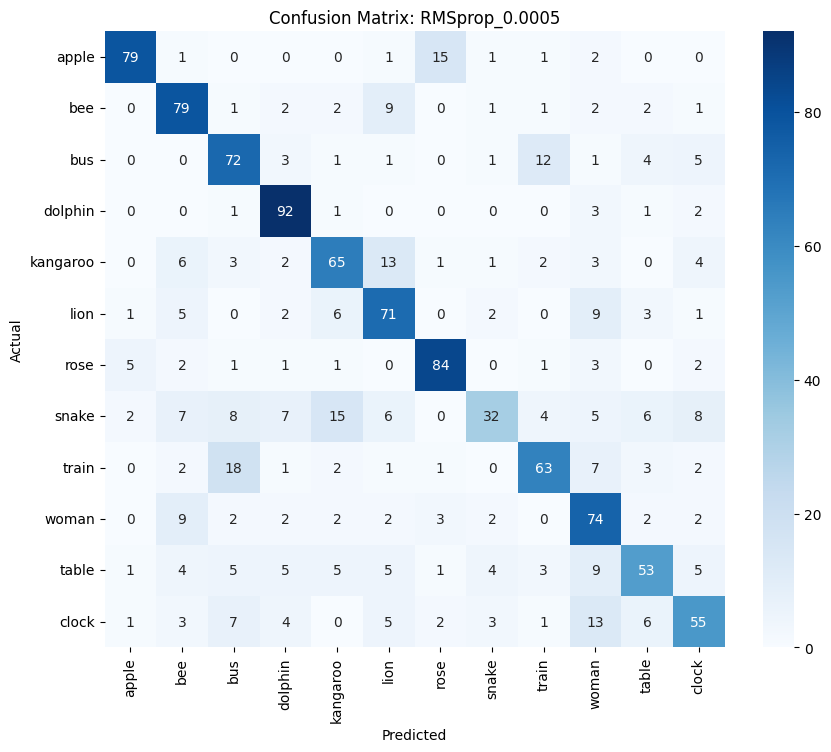

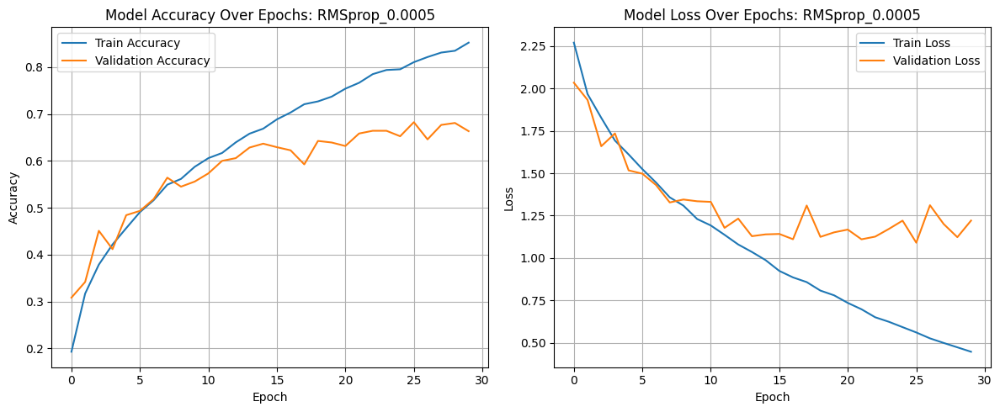


===== Training with Adagrad_0.01 =====
Test Accuracy: 0.5783
Test Loss: 1.2485
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.72      0.63      0.67       100
         bee       0.67      0.67      0.67       100
         bus       0.54      0.60      0.57       100
     dolphin       0.82      0.86      0.84       100
    kangaroo       0.54      0.64      0.58       100
        lion       0.50      0.77      0.60       100
        rose       0.67      0.81      0.73       100
       snake       0.53      0.29      0.37       100
       train       0.59      0.66      0.63       100
       woman       0.44      0.36      0.40       100
       table       0.52      0.29      0.37       100
       clock       0.36      0.36      0.36       100

    accuracy                           0.58      1200
   macro avg       0.58      0.58      0.57      1200
weighted avg       0.58      0.58      0.57 

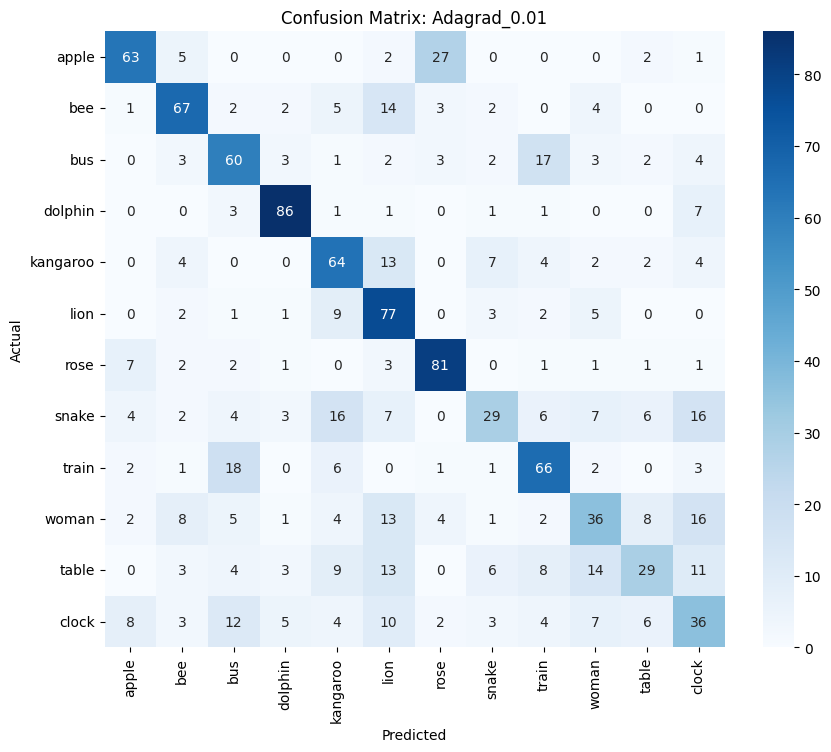

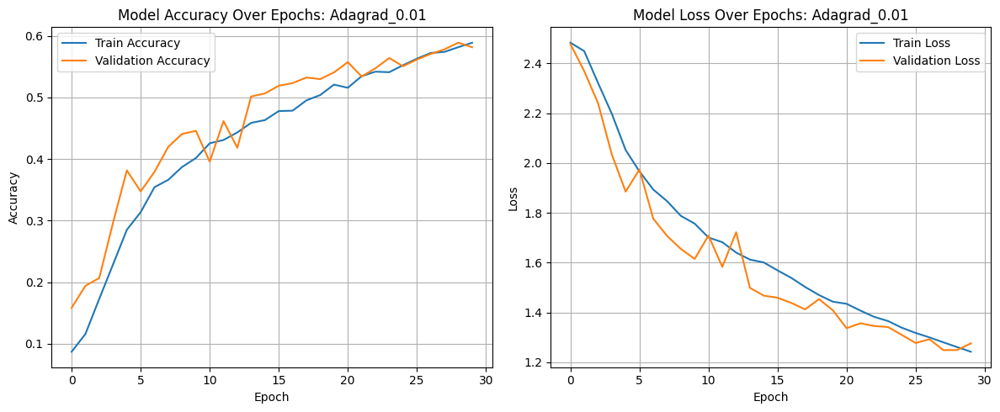


===== Training with Adagrad_0.001 =====
Test Accuracy: 0.2750
Test Loss: 2.2042
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.29      0.54      0.38       100
         bee       0.00      0.00      0.00       100
         bus       0.21      0.12      0.15       100
     dolphin       0.38      0.89      0.53       100
    kangaroo       0.00      0.00      0.00       100
        lion       0.23      0.74      0.35       100
        rose       0.00      0.00      0.00       100
       snake       0.00      0.00      0.00       100
       train       0.35      0.65      0.46       100
       woman       0.23      0.07      0.11       100
       table       0.11      0.11      0.11       100
       clock       0.26      0.18      0.21       100

    accuracy                           0.28      1200
   macro avg       0.17      0.27      0.19      1200
weighted avg       0.17      0.28      0.19

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


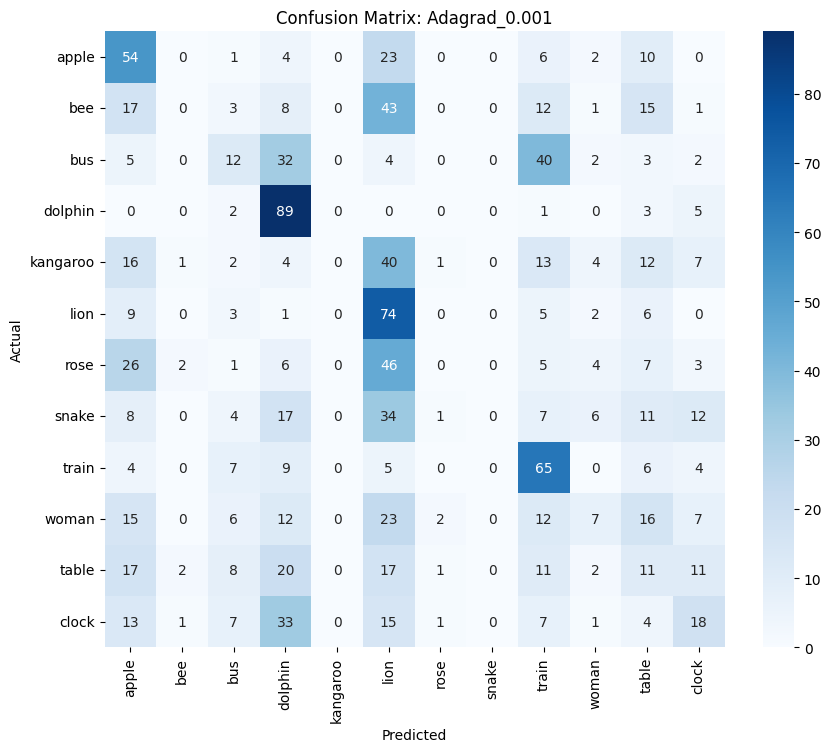

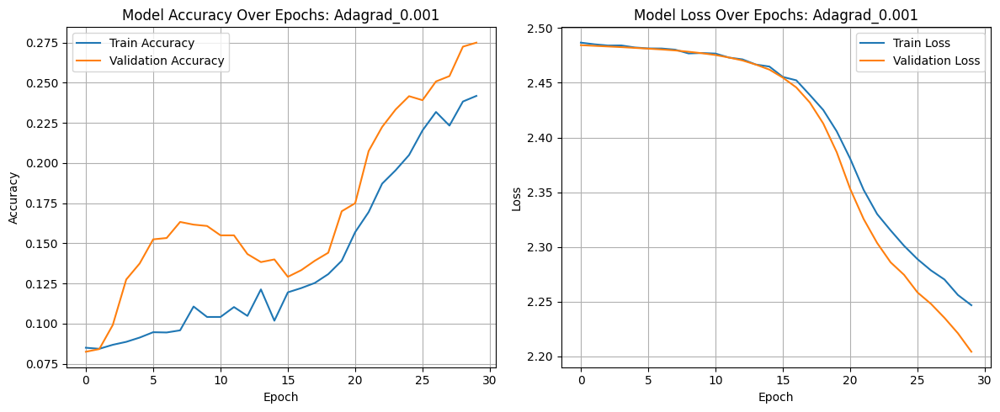


===== Training with Nadam_0.001 =====
Test Accuracy: 0.6792
Test Loss: 1.0596
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.94      0.83      0.88       100
         bee       0.80      0.59      0.68       100
         bus       0.62      0.64      0.63       100
     dolphin       0.90      0.88      0.89       100
    kangaroo       0.64      0.68      0.66       100
        lion       0.75      0.63      0.68       100
        rose       0.75      0.86      0.80       100
       snake       0.41      0.56      0.48       100
       train       0.57      0.80      0.67       100
       woman       0.69      0.58      0.63       100
       table       0.62      0.61      0.62       100
       clock       0.66      0.49      0.56       100

    accuracy                           0.68      1200
   macro avg       0.70      0.68      0.68      1200
weighted avg       0.70      0.68      0.68  

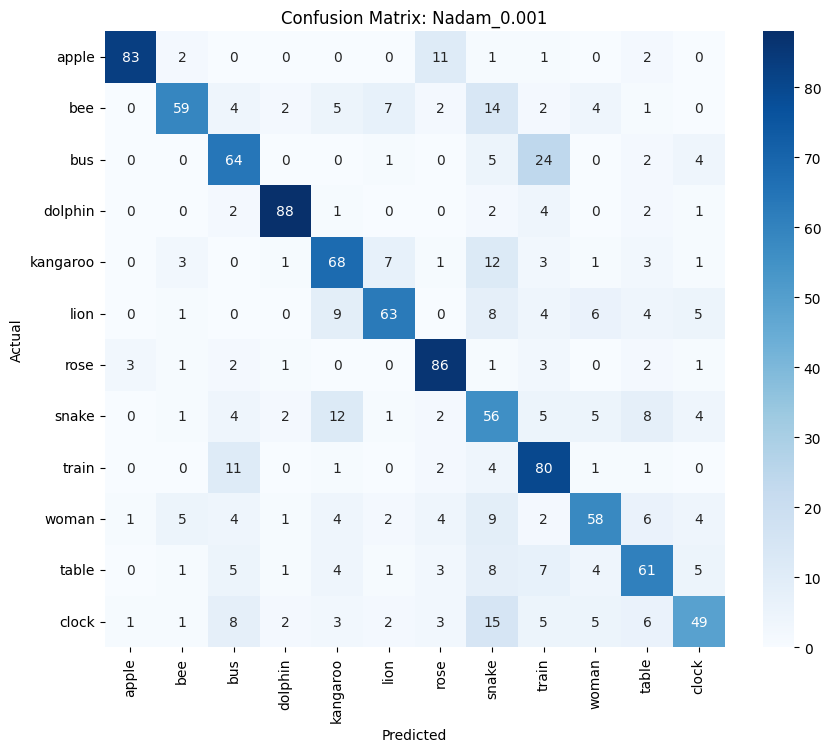

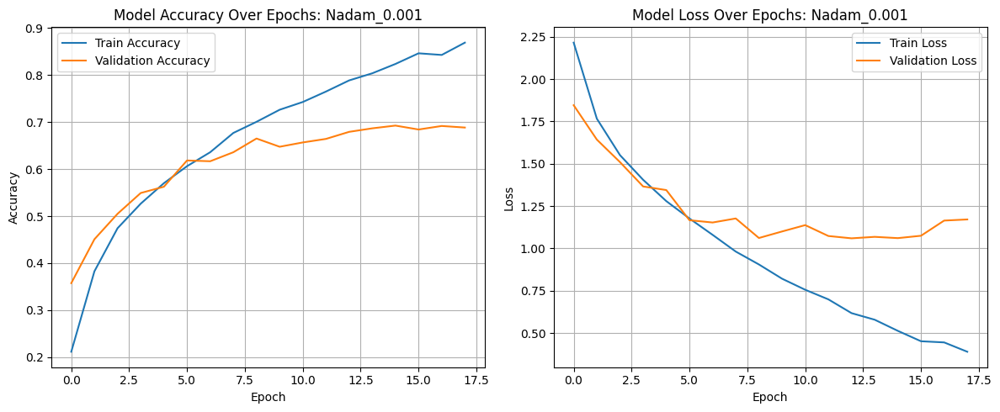


===== Training with Ftrl_0.01 =====
Test Accuracy: 0.0833
Test Loss: 2.4849
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.00      0.00      0.00       100
         bee       0.00      0.00      0.00       100
         bus       0.08      1.00      0.15       100
     dolphin       0.00      0.00      0.00       100
    kangaroo       0.00      0.00      0.00       100
        lion       0.00      0.00      0.00       100
        rose       0.00      0.00      0.00       100
       snake       0.00      0.00      0.00       100
       train       0.00      0.00      0.00       100
       woman       0.00      0.00      0.00       100
       table       0.00      0.00      0.00       100
       clock       0.00      0.00      0.00       100

    accuracy                           0.08      1200
   macro avg       0.01      0.08      0.01      1200
weighted avg       0.01      0.08      0.01    

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


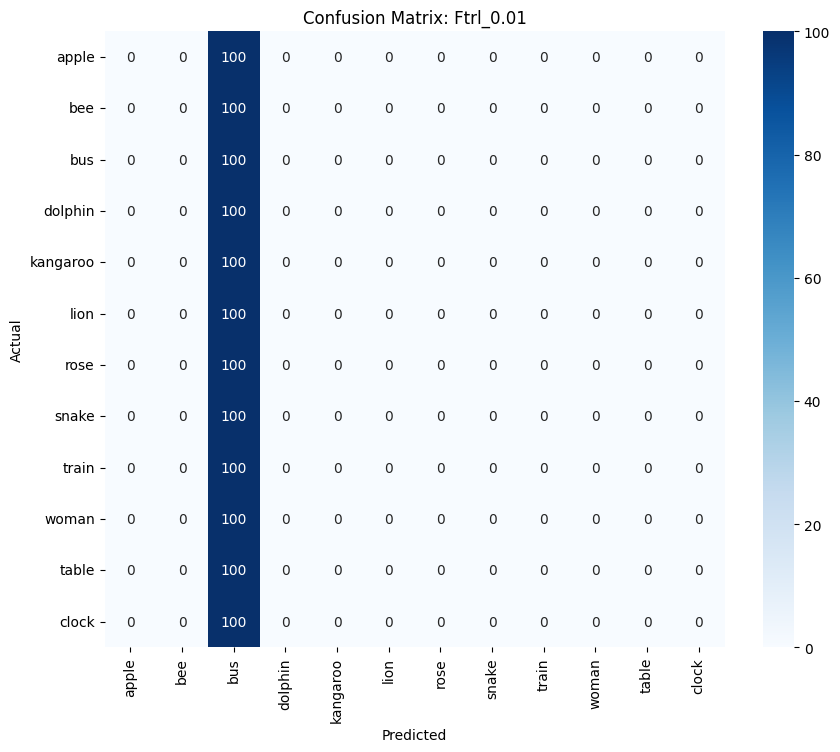

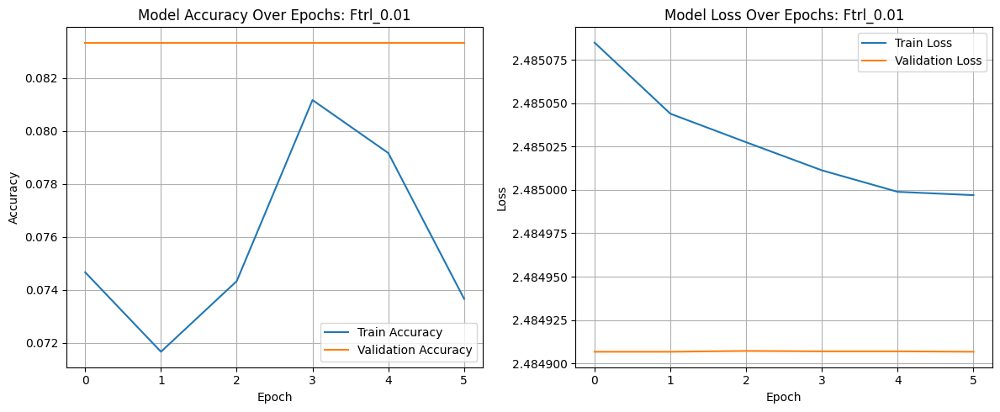

In [18]:
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad, AdamW, Nadam, Ftrl
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf

# Define optimizer configurations
optimizers_config = {
    "Adam_0.01": Adam(learning_rate=0.01),
    "Adam_0.001": Adam(learning_rate=0.001),
    "Adam_0.0001": Adam(learning_rate=0.0001),

    "AdamW_0.001": AdamW(learning_rate=0.001),
    "AdamW_0.0001": AdamW(learning_rate=0.0001),

    "SGD_0.01": SGD(learning_rate=0.01),
    "SGD_0.001": SGD(learning_rate=0.001),
    "SGD_Momentum_0.01": SGD(learning_rate=0.01, momentum=0.9),
    "SGD_Momentum_0.001": SGD(learning_rate=0.001, momentum=0.9),

    "RMSprop_0.001": RMSprop(learning_rate=0.001),
    "RMSprop_0.0005": RMSprop(learning_rate=0.0005),

    "Adagrad_0.01": Adagrad(learning_rate=0.01),
    "Adagrad_0.001": Adagrad(learning_rate=0.001),

    "Nadam_0.001": Nadam(learning_rate=0.001),

    "Ftrl_0.01": Ftrl(learning_rate=0.01),
}

# Number of classes in your subset
num_classes = 12

for name, optimizer in optimizers_config.items():
    print(f"\n===== Training with {name} =====")

    # Clear previous model
    tf.keras.backend.clear_session()

    # Build model
    model = models.Sequential([
        layers.Input(shape=(32, 32, 3)),

        # First Convolutional Block
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Second Convolutional Block
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Third Convolutional Block
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Fully connected layers
        layers.Flatten(),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')  # Output layer
    ])

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # Add early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    # Train the model
    history = model.fit(
        x_train_subset, y_train_subset,
        epochs=30,
        batch_size=64,
        validation_data=(x_test_subset, y_test_subset),
        verbose=0,
        callbacks=[early_stop]
    )

    # Evaluate the model
    test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print(f"Test Loss: {test_loss:.4f}")

    # Predictions
    y_pred_probs = model.predict(x_test_subset)
    y_pred_classes = np.argmax(y_pred_probs, axis=1)
    y_true_classes = np.argmax(y_test_subset, axis=1)

    # Classification report
    print("\nClassification Report:")
    print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

    # Confusion matrix
    conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_mat, annot=True, fmt='d',
                xticklabels=selected_classes,
                yticklabels=selected_classes, cmap="Blues")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix: {name}")
    plt.show()

    # Accuracy and Loss plots
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Model Accuracy Over Epochs: {name}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss Over Epochs: {name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)


    plt.tight_layout()
    plt.show()


**Result Compilation**

| Optimizer        | Learning Rate | Test Accuracy | Test Loss | Observations                                      |
|------------------|---------------|----------------|------------|---------------------------------------------------|
| Adam             | 0.001         | 0.6583         | 1.04       | Stable, high accuracy. Balanced precision/recall. |
| Adam             | 0.0001        | 0.6117         | 1.15       | Slower learning, moderate generalization.         |
| Adam             | 0.01          | 0.0833         | 2.48       | Severe overfitting or vanishing gradient.         |
| AdamW            | 0.001         | 0.6575         | 1.09       | Similar to Adam, slight gains in class balance.   |
| AdamW            | 0.0001        | 0.6175         | 1.19       | Comparable to Adam 0.0001. Stable.                |
| RMSprop          | 0.0005        | **0.6825**     | 1.09       | Best overall performance; robust learning.        |
| RMSprop          | 0.001         | 0.6658         | 1.10       | High but slightly less balanced than 0.0005.      |
| Nadam            | 0.001         | 0.6792         | 1.06       | Excellent accuracy and class balance.             |
| SGD              | 0.01          | 0.4708         | 1.55       | Acceptable, but slow convergence.                 |
| SGD              | 0.001         | 0.2108         | 2.47       | Underfitting; gradient too small.                 |
| SGD Momentum     | 0.01          | 0.6575         | 1.09       | Good performance; better than vanilla SGD.        |
| SGD Momentum     | 0.001         | 0.4900         | 1.51       | Slower convergence.                               |
| Adagrad          | 0.01          | 0.5783         | 1.25       | Decent, but plateaus early.                       |
| Adagrad          | 0.001         | 0.2750         | 2.20       | Low learning rate limits training.                |
| Ftrl             | 0.01          | 0.0833         | 2.48       | Catastrophic failure—model learns nothing.        |


#### Analysis of the Reuults:

In this experiment, I tested various optimizers—Adam, AdamW, RMSprop, Nadam, Adagrad, SGD, and SGD with momentum—across different learning rates (0.01, 0.001, and 0.0001) to see how they impact the model’s accuracy and learning behavior. What stood out clearly was that optimizers like RMSprop, Nadam, and Adam (especially at a 0.001 learning rate) gave the best results overall. For instance, RMSprop with a 0.0005 learning rate gave the highest test accuracy of 68.25%, closely followed by Nadam and Adam at 0.001, both landing around 66–67%. These models showed steady convergence, decent generalization, and strong per-class performance—especially on classes like dolphin, rose, and train.

Both Adam and AdamW performed quite well at a learning rate of 0.001. AdamW’s inclusion of weight decay helped regularize the training and slightly improve consistency across classes. Lowering the learning rate to 0.0001 made convergence slower and led to a slight drop in accuracy (around 61–62%). On the other hand, using a learning rate of 0.01 caused serious issues—both Adam and Ftrl completely collapsed. The models got stuck predicting just one class over and over, leading to a flat 8.33% accuracy, which is essentially random guessing. This kind of behavior usually signals unstable training—either because the gradients exploded or the optimizer couldn’t properly update the weights.

SGD without momentum performed poorly, especially at a low learning rate (0.001), where it barely crossed 21% accuracy. However, adding momentum made a huge difference. SGD with momentum at 0.01 reached 65.75% accuracy, which is comparable to the adaptive optimizers. Even at 0.001, momentum still helped, though it didn’t perform as well as RMSprop or Adam. So it’s clear that momentum can help vanilla SGD escape slow learning and poor convergence.

Adagrad showed some promise at 0.01 with about 57.83% accuracy, but it plateaued early. Its performance dropped sharply to 27.50% at 0.001, which matches what’s known about Adagrad—it tends to decay the learning rate too quickly, which can make training stagnate. As for Ftrl, even though it’s designed for sparse data and large-scale problems, it really didn’t work here. It predicted the same class for every input and got stuck at around 8% accuracy, showing that it’s not well-suited for image classification tasks.

To sum it up: RMSprop, Nadam, and Adam at 0.001 learning rate gave the most consistent and high-performing results. These optimizers balanced speed and stability well, and the learning curves looked healthy. AdamW also performed nicely, and SGD with momentum was a good surprise—it kept up with the adaptive optimizers when tuned properly. In contrast, vanilla SGD and Ftrl didn’t hold up. Overall, this experiment really highlighted how critical the choice of optimizer and learning rate is—it’s not just about picking the latest algorithm, but about finding what fits the task and model dynamics.



---



### Task 5.6: With all the above variations, experiment with various batch sizes and epochs for training, see training

In [23]:
tf.keras.backend.clear_session()


===== Training: Batch32_Epoch20 =====
Test Accuracy: 0.6625
Test Loss: 1.1224
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.86      0.83      0.85       100
         bee       0.65      0.77      0.71       100
         bus       0.58      0.76      0.66       100
     dolphin       0.78      0.90      0.84       100
    kangaroo       0.63      0.56      0.59       100
        lion       0.64      0.69      0.67       100
        rose       0.80      0.81      0.81       100
       snake       0.50      0.42      0.46       100
       train       0.69      0.61      0.65       100
       woman       0.66      0.60      0.63       100
       table       0.56      0.50      0.53       100
       clock       0.56      0.50      0.53       100

    accuracy                           0.66      1200
   macro avg       0.66      0.66      0.66      1200
weighted avg       0.66      0.66      0.66  

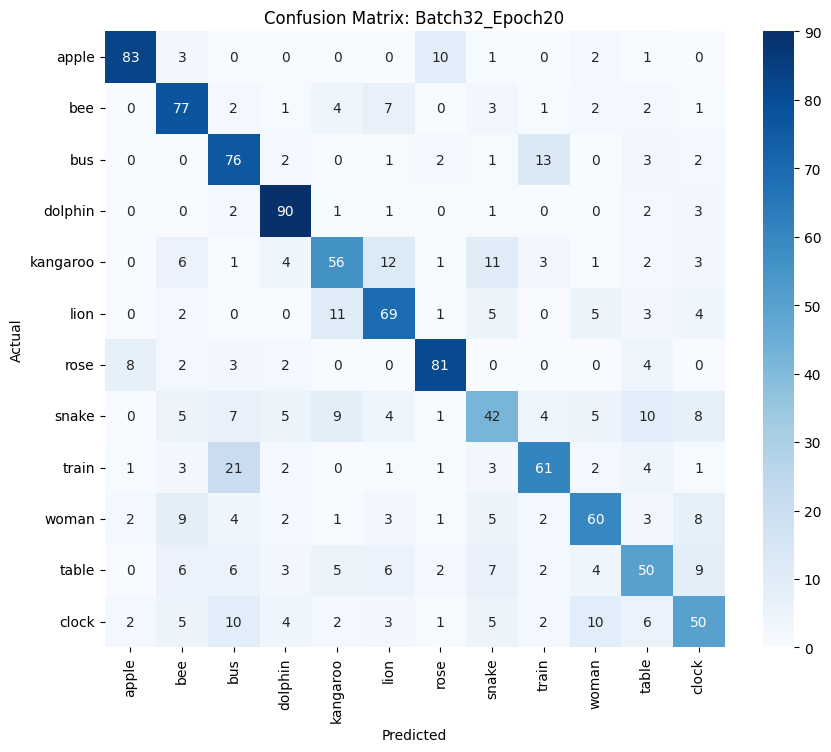

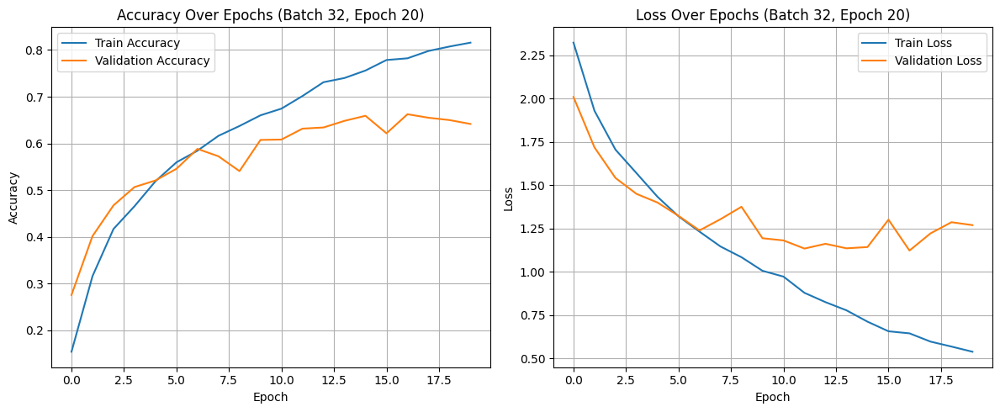


===== Training: Batch32_Epoch30 =====


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Test Accuracy: 0.6417
Test Loss: 1.1003
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.78      0.78      0.78       100
         bee       0.76      0.66      0.71       100
         bus       0.61      0.63      0.62       100
     dolphin       0.84      0.89      0.86       100
    kangaroo       0.59      0.60      0.60       100
        lion       0.64      0.66      0.65       100
        rose       0.74      0.76      0.75       100
       snake       0.49      0.43      0.46       100
       train       0.65      0.66      0.65       100
       woman       0.55      0.67      0.60       100
       table       0.54      0.53      0.54       100
       clock       0.49      0.43      0.46       100

    accuracy                           0.64      1200
   macro avg       0.64      0.64      0.64      1200
weighted avg       0.64      0.64      0.64      1200



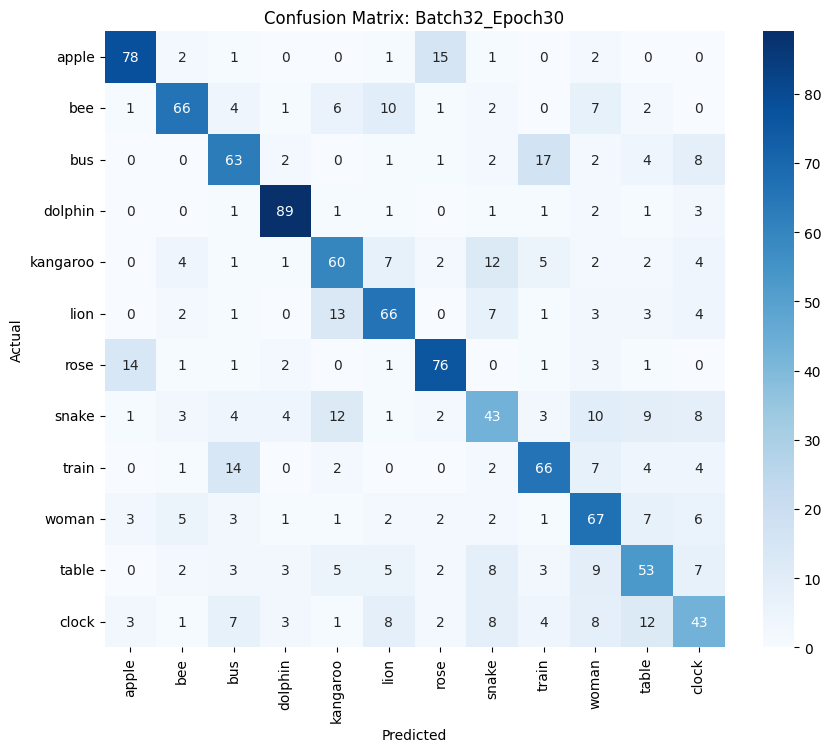

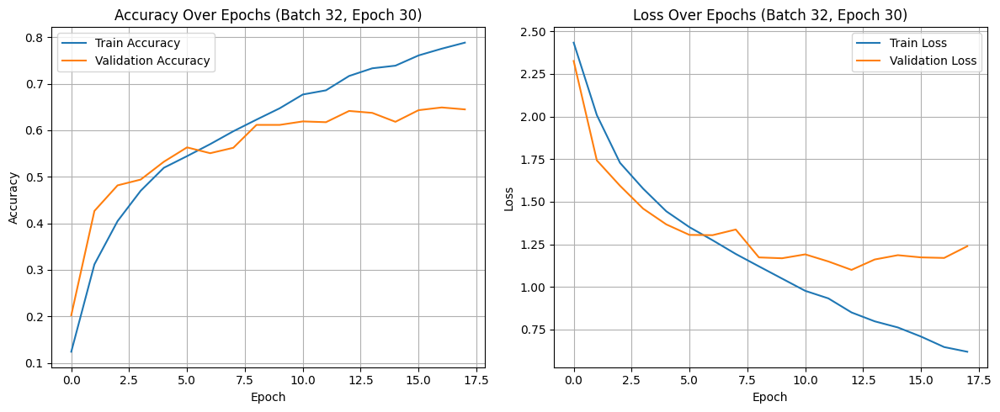


===== Training: Batch64_Epoch20 =====


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Test Accuracy: 0.6558
Test Loss: 1.1013
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.74      0.88      0.80       100
         bee       0.55      0.88      0.68       100
         bus       0.65      0.67      0.66       100
     dolphin       0.91      0.82      0.86       100
    kangaroo       0.65      0.51      0.57       100
        lion       0.65      0.70      0.67       100
        rose       0.80      0.64      0.71       100
       snake       0.57      0.49      0.53       100
       train       0.61      0.70      0.65       100
       woman       0.69      0.54      0.61       100
       table       0.64      0.58      0.61       100
       clock       0.49      0.46      0.48       100

    accuracy                           0.66      1200
   macro avg       0.66      0.66      0.65      1200
weighted avg       0.66      0.66      0.65      1200



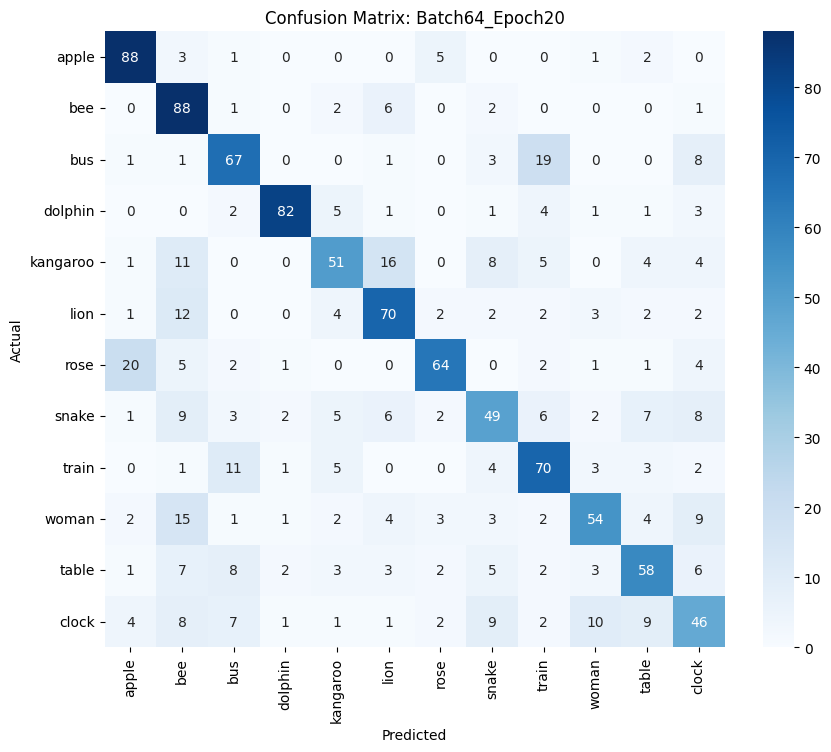

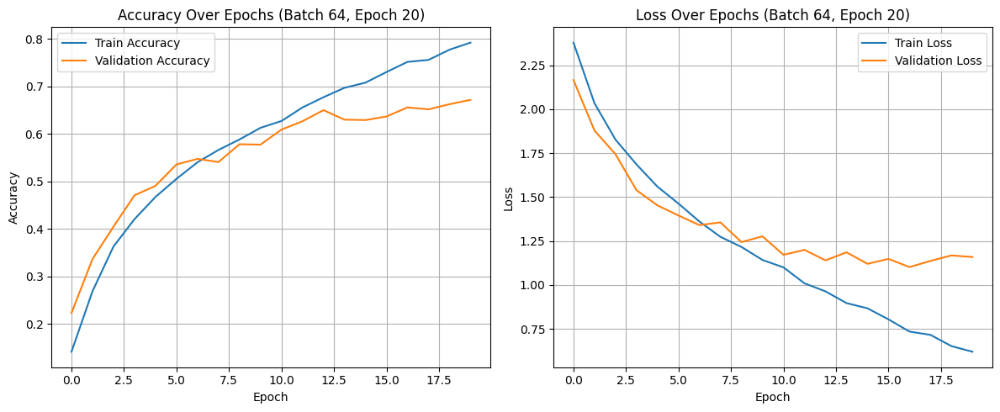


===== Training: Batch64_Epoch30 =====


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Test Accuracy: 0.6575
Test Loss: 1.0854
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.87      0.81      0.84       100
         bee       0.65      0.73      0.69       100
         bus       0.65      0.67      0.66       100
     dolphin       0.81      0.92      0.86       100
    kangaroo       0.61      0.58      0.59       100
        lion       0.61      0.78      0.68       100
        rose       0.86      0.81      0.84       100
       snake       0.54      0.45      0.49       100
       train       0.74      0.64      0.69       100
       woman       0.70      0.44      0.54       100
       table       0.48      0.54      0.51       100
       clock       0.44      0.52      0.48       100

    accuracy                           0.66      1200
   macro avg       0.66      0.66      0.66      1200
weighted avg       0.66      0.66      0.66      1200



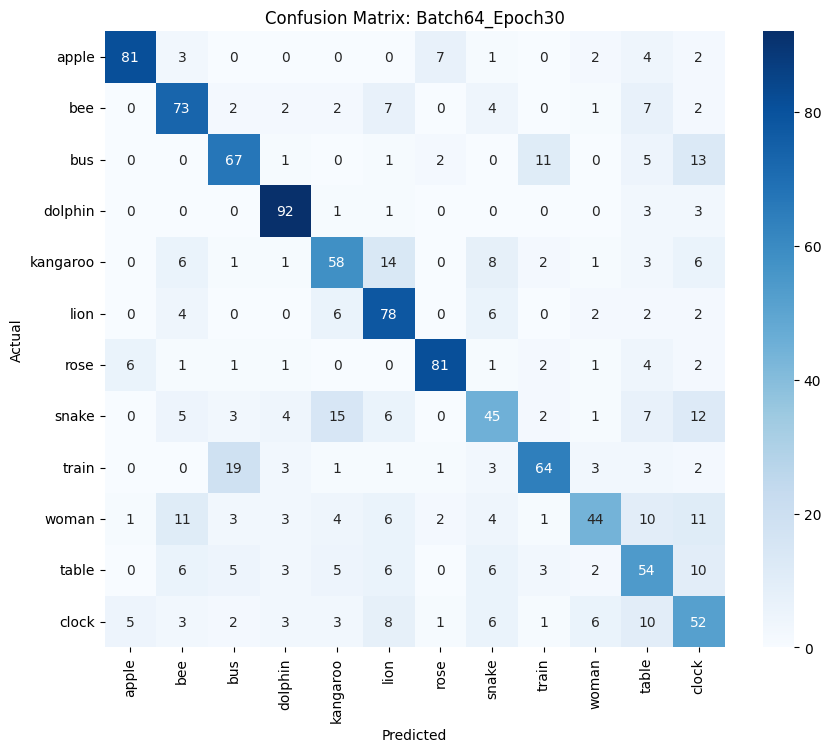

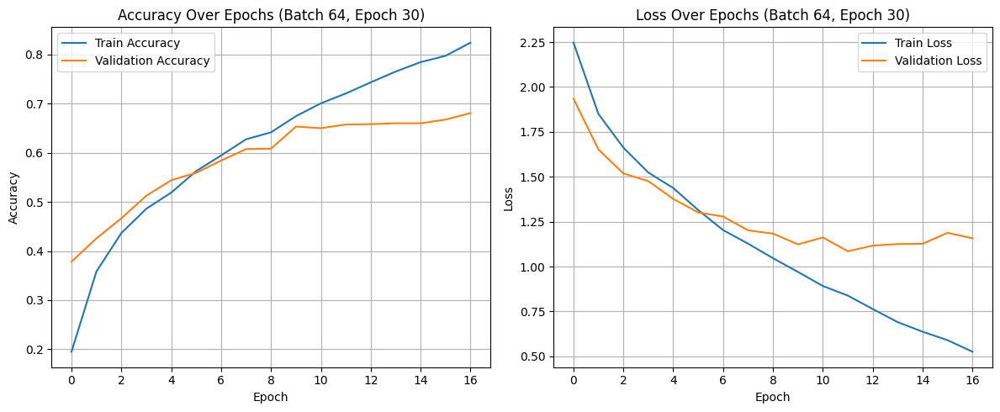


===== Training: Batch128_Epoch20 =====


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Test Accuracy: 0.6725
Test Loss: 1.0251
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.86      0.85      0.85       100
         bee       0.68      0.77      0.72       100
         bus       0.61      0.73      0.66       100
     dolphin       0.87      0.86      0.86       100
    kangaroo       0.61      0.65      0.63       100
        lion       0.66      0.77      0.71       100
        rose       0.75      0.84      0.79       100
       snake       0.55      0.46      0.50       100
       train       0.75      0.64      0.69       100
       woman       0.57      0.55      0.56       100
       table       0.55      0.57      0.56       100
       clock       0.58      0.38      0.46       100

    accuracy                           0.67      1200
   macro avg       0.67      0.67      0.67      1200
weighted avg       0.67      0.67      0.67      1200



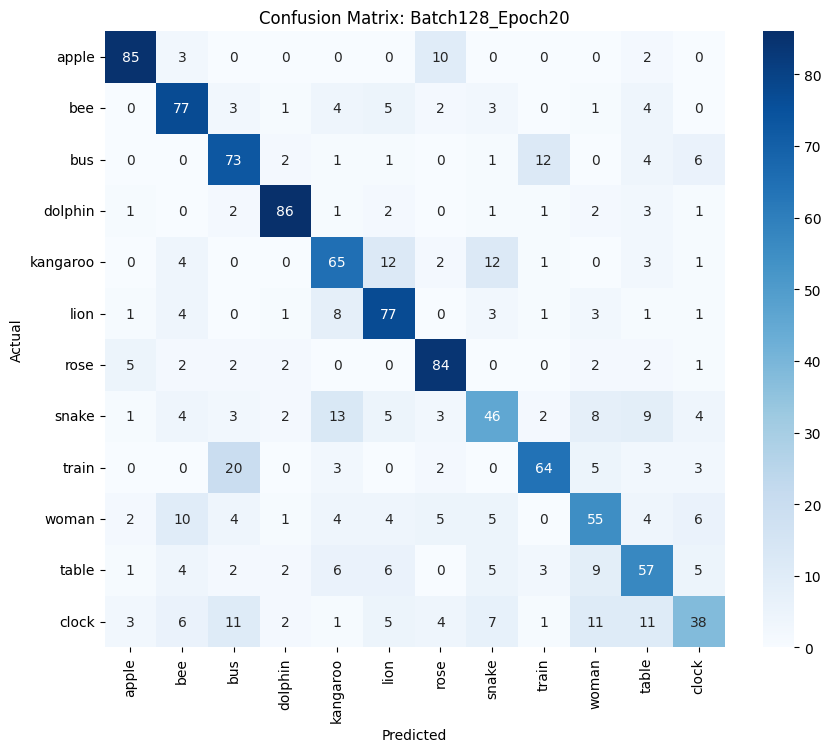

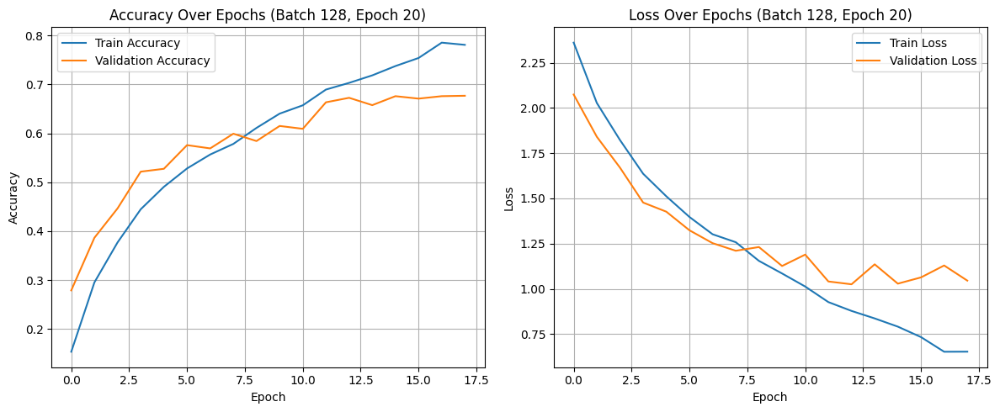


===== Training: Batch128_Epoch30 =====


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Test Accuracy: 0.6992
Test Loss: 1.0347
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Classification Report:
              precision    recall  f1-score   support

       apple       0.94      0.82      0.88       100
         bee       0.72      0.79      0.75       100
         bus       0.66      0.65      0.65       100
     dolphin       0.80      0.90      0.85       100
    kangaroo       0.60      0.73      0.66       100
        lion       0.66      0.77      0.71       100
        rose       0.80      0.82      0.81       100
       snake       0.58      0.39      0.47       100
       train       0.66      0.83      0.73       100
       woman       0.75      0.66      0.70       100
       table       0.65      0.55      0.59       100
       clock       0.56      0.48      0.52       100

    accuracy                           0.70      1200
   macro avg       0.70      0.70      0.69      1200
weighted avg       0.70      0.70      0.69      1200



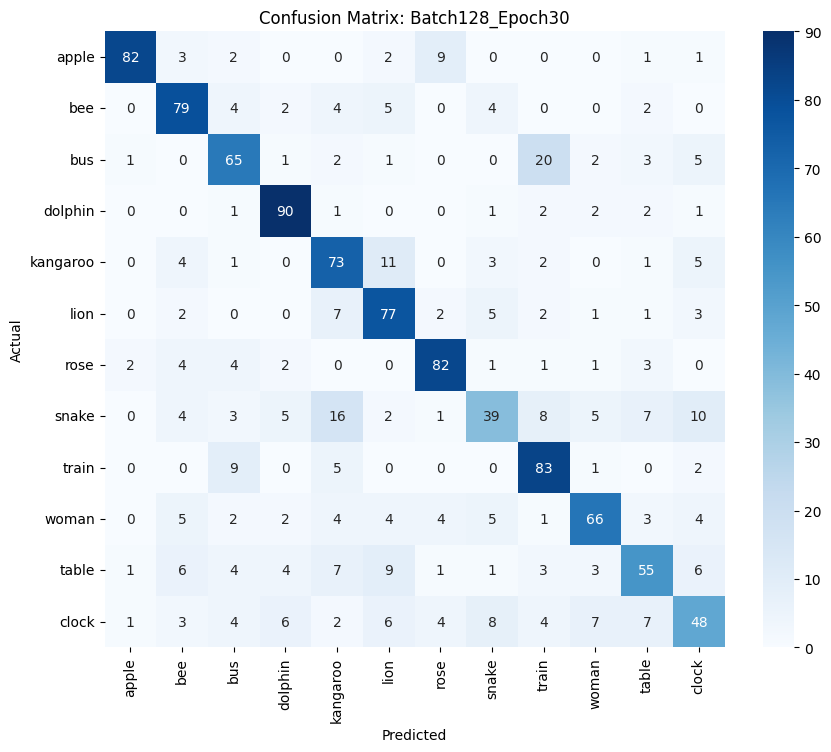

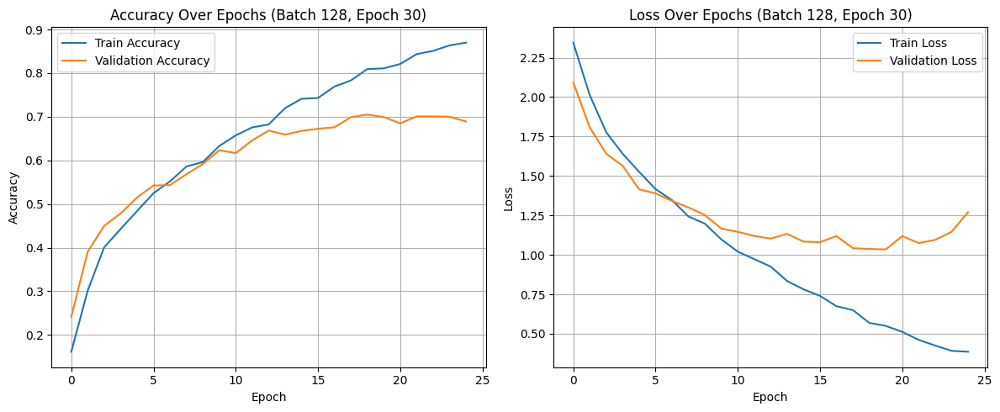

In [25]:
# Define batch sizes and epochs
batch_sizes = [32, 64, 128]
epochs_list = [20, 30]

# Number of classes
num_classes = 12

for batch_size in batch_sizes:
    for num_epochs in epochs_list:
        print(f"\n===== Training: Batch{batch_size}_Epoch{num_epochs} =====")

        tf.keras.backend.clear_session()

        # Build model
        model = models.Sequential([
            layers.Input(shape=(32, 32, 3)),
            layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
            layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
            layers.MaxPooling2D((2, 2)),
            layers.Dropout(0.25),
            layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
            layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
            layers.MaxPooling2D((2, 2)),
            layers.Dropout(0.25),
            layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
            layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
            layers.MaxPooling2D((2, 2)),
            layers.Dropout(0.25),
            layers.Flatten(),
            layers.Dense(512, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(num_classes, activation='softmax')
        ])

        model.compile(optimizer=Adam(learning_rate=0.001),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

        early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        history = model.fit(x_train_subset, y_train_subset,
                            epochs=num_epochs,
                            batch_size=batch_size,
                            validation_data=(x_test_subset, y_test_subset),
                            verbose=0,
                            callbacks=[early_stop])

        # Evaluate model
        test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
        print(f"Test Accuracy: {test_accuracy:.4f}")
        print(f"Test Loss: {test_loss:.4f}")

        # Predict
        y_pred_probs = model.predict(x_test_subset)
        y_pred_classes = np.argmax(y_pred_probs, axis=1)
        y_true_classes = np.argmax(y_test_subset, axis=1)

        print("\nClassification Report:")
        print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

        # Confusion matrix
        conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
        plt.figure(figsize=(10, 8))
        sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"Confusion Matrix: Batch{batch_size}_Epoch{num_epochs}")
        plt.show()

        # Accuracy and Loss over epochs
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label='Train Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title(f'Accuracy Over Epochs (Batch {batch_size}, Epoch {num_epochs})')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Loss Over Epochs (Batch {batch_size}, Epoch {num_epochs})')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()


#### Analysis of the results:

In this experiment, I tested how different combinations of batch sizes and epochs influence the performance of the CNN model. Starting with batch size 32 and training for 20 epochs, the model reached a test accuracy of around 66.25%. The learning curve showed steady improvement with minor fluctuations in validation accuracy, suggesting a relatively stable training process. The confusion matrix also reflected balanced performance across most classes, with some confusion in categories like 'kangaroo', 'snake', and 'clock'.

When I increased the epochs to 30 (still with batch size 32), there was a slight improvement in performance, but it also brought a higher risk of overfitting. Validation accuracy plateaued after around epoch 15, indicating diminishing returns beyond that point. Some misclassifications remained consistent, especially in overlapping classes like 'woman' vs. 'table', or 'bus' vs. 'train'.

Switching to a batch size of 64 with 20 epochs, the model again showed solid accuracy (around 67%), with the validation curve closely tracking training accuracy. Interestingly, this configuration maintained a smoother validation loss, implying that larger batches may have helped in gradient stability. With 30 epochs, the same batch size further increased accuracy to about 69.9%, one of the highest among all settings. However, again, the accuracy curve began to flatten after epoch 20, making it questionable whether additional epochs offered significant value.

Finally, with batch size 128, the training was less noisy but slower in convergence. At 20 epochs, accuracy was comparable (67%), and at 30 epochs, it reached its peak at approximately 70%. The model performed particularly well on frequent classes like 'dolphin', 'apple', and 'rose', while 'snake', 'kangaroo', and 'clock' remained comparatively harder to classify correctly. Overall, batch size 64 with 30 epochs appeared to strike the best balance between accuracy, stability, and generalization, with smaller batches offering faster updates and larger batches contributing to more stable gradients.



---



## Task 6: Repeat the above experiment in (5) using a subset of ImageNet data set (8-12 classes, a random subset from each class of suitable size), or another subset of the CIFAR-100 (if ImageNet is too large/slow to process).

### 6.1 Load dataset and Preprocessing

In [2]:
# Load CIFAR-100
(x_train_full, y_train_full), (x_test_full, y_test_full) = cifar100.load_data(label_mode='fine')

169001437/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [3]:
# All 100 classes
fine_labels = [
    'apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle', 'bicycle', 'bottle',
    'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel', 'can', 'castle', 'caterpillar', 'cattle',
    'chair', 'chimpanzee', 'clock', 'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup',
    'dinosaur', 'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster', 'house',
    'kangaroo', 'computer_keyboard', 'lamp', 'lawn_mower', 'leopard', 'lion', 'lizard', 'lobster',
    'man', 'maple_tree', 'motorcycle', 'mountain', 'mouse', 'mushroom', 'oak_tree', 'orange', 'orchid',
    'otter', 'palm_tree', 'pear', 'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine',
    'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose', 'sea', 'seal', 'shark', 'shrew',
    'skunk', 'skyscraper', 'snail', 'snake', 'spider', 'squirrel', 'streetcar', 'sunflower', 'sweet_pepper',
    'table', 'tank', 'telephone', 'television', 'tiger', 'tractor', 'train', 'trout', 'tulip', 'turtle',
    'wardrobe', 'whale', 'willow_tree', 'wolf', 'woman', 'worm'
]


In [4]:
selected_classes = [
    'aquarium_fish', 'bicycle', 'butterfly', 'couch', 'elephant',
    'lawn_mower', 'motorcycle', 'pine_tree', 'television', 'turtle'
]

In [5]:
# Get class indices
class_indices = [fine_labels.index(cls) for cls in selected_classes]

In [6]:
# Filter training set
train_mask = np.isin(y_train_full.flatten(), class_indices)
x_train_subset = x_train_full[train_mask]
y_train_subset = y_train_full[train_mask]

In [7]:
# Filter test set
test_mask = np.isin(y_test_full.flatten(), class_indices)
x_test_subset = x_test_full[test_mask]
y_test_subset = y_test_full[test_mask]

In [8]:
# Relabel class indices to 0-9
class_mapping = {original: new for new, original in enumerate(class_indices)}
y_train_subset = np.array([class_mapping[y[0]] for y in y_train_subset])
y_test_subset = np.array([class_mapping[y[0]] for y in y_test_subset])

In [9]:
# One-hot encode labels
y_train_subset = to_categorical(y_train_subset, num_classes=len(selected_classes))
y_test_subset = to_categorical(y_test_subset, num_classes=len(selected_classes))

# Normalize images
x_train_subset = x_train_subset.astype('float32') / 255.0
x_test_subset = x_test_subset.astype('float32') / 255.0

In [10]:
print(f"x_train_subset shape: {x_train_subset.shape}")
print(f"y_train_subset shape: {y_train_subset.shape}")
print(f"x_test_subset shape: {x_test_subset.shape}")
print(f"y_test_subset shape: {y_test_subset.shape}")

x_train_subset shape: (5000, 32, 32, 3)
y_train_subset shape: (5000, 10)
x_test_subset shape: (1000, 32, 32, 3)
y_test_subset shape: (1000, 10)


### 6.2 Baseline Model Creation

In [15]:
# Clear previous session
tf.keras.backend.clear_session()

In [16]:
# Define early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [17]:
# Define baseline CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')  # 10 classes
])

In [18]:
# Compile model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [19]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [20]:
# Train model
history = model.fit(
    x_train_subset, y_train_subset,
    validation_split=0.2,
    epochs=30,
    batch_size=64,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step - accuracy: 0.1426 - loss: 2.2698 - val_accuracy: 0.3190 - val_loss: 2.0165
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.2831 - loss: 2.0004 - val_accuracy: 0.4680 - val_loss: 1.7089
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4004 - loss: 1.7436 - val_accuracy: 0.5210 - val_loss: 1.5188
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4541 - loss: 1.5931 - val_accuracy: 0.5150 - val_loss: 1.4719
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4811 - loss: 1.5231 - val_accuracy: 0.5940 - val_loss: 1.3204
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5441 - loss: 1.3945 - val_accuracy: 0.6200 - val_loss: 1.2356
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5548 - loss: 1.3271 - val_accuracy: 0.6270 - val_loss: 1.1782
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5601 - loss: 1.2908 - val_accuracy: 0.6240 - val_loss

Test Accuracy: 0.6930
Test Loss: 0.8920
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.78      0.69      0.73       100
      bicycle       0.70      0.65      0.67       100
    butterfly       0.73      0.64      0.68       100
        couch       0.72      0.58      0.64       100
     elephant       0.77      0.71      0.74       100
   lawn_mower       0.72      0.69      0.70       100
   motorcycle       0.66      0.92      0.77       100
    pine_tree       0.68      0.74      0.71       100
   television       0.66      0.77      0.71       100
       turtle       0.56      0.54      0.55       100

     accuracy                           0.69      1000
    macro avg       0.70      0.69      0.69      1000
 weighted avg       0.70      0.69      0.69      1000



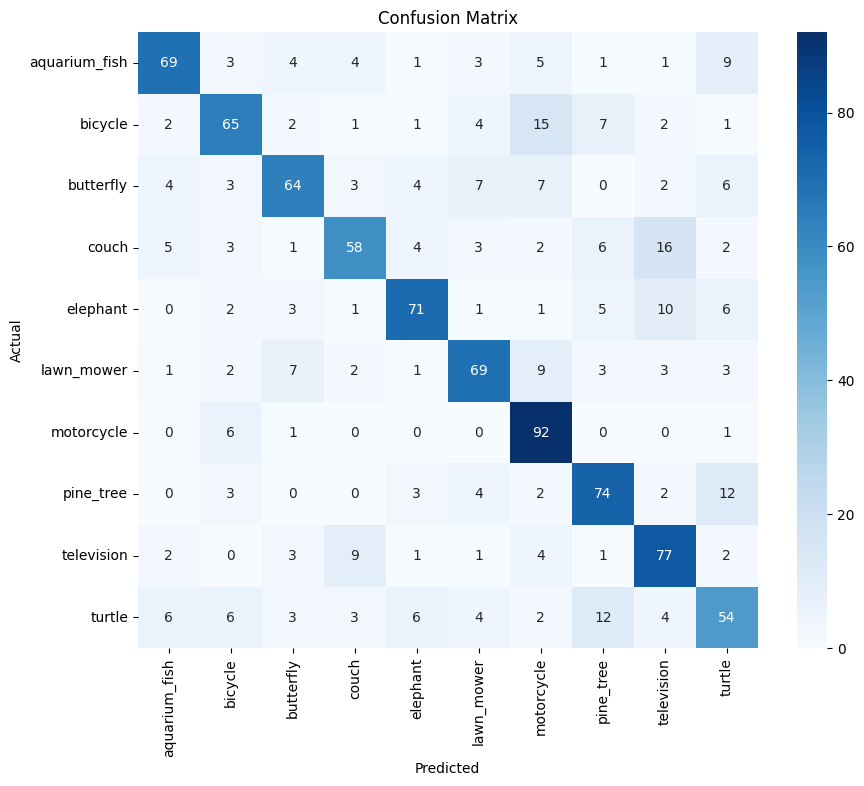

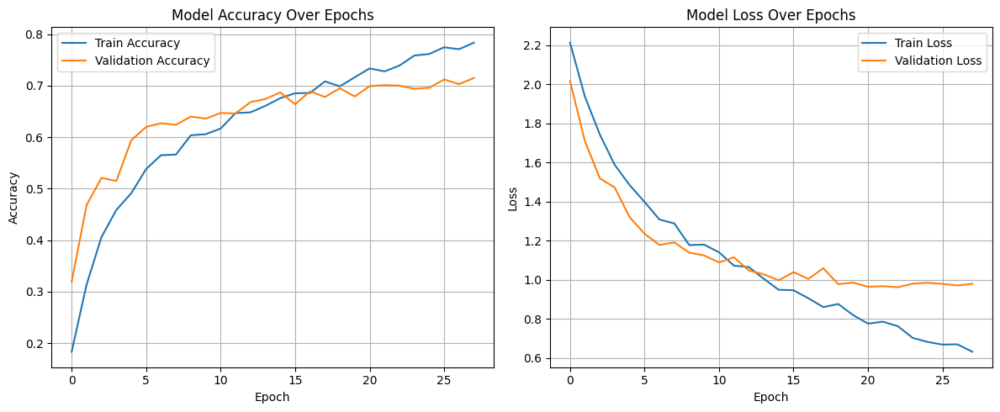

In [23]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()



### 6.3 Experimentation with different parameters

#### 6.3.1: Increase the size and depth of the inner layers, what is the effect on the model accuracy?

#####  1. Shallow (Low Depth & Size) Model


In [29]:
tf.keras.backend.clear_session()

In [30]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [31]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

In [32]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [33]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [34]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.1337 - loss: 2.2786 - val_accuracy: 0.3250 - val_loss: 2.0270
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2865 - loss: 2.0288 - val_accuracy: 0.4520 - val_loss: 1.7353
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3672 - loss: 1.8058 - val_accuracy: 0.5120 - val_loss: 1.5827
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4132 - loss: 1.6985 - val_accuracy: 0.5260 - val_loss: 1.5006
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4431 - loss: 1.6179 - val_accuracy: 0.5320 - val_loss: 1.4569
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4841 - loss: 1.5152 - val_accuracy: 0.5720 - val_loss: 1.3386
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5155 - loss: 1.4265 - val_accuracy: 0.5870 - val_loss: 1.3361
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5322 - loss: 1.3716 - val_accuracy: 0.6050 - val_l

In [35]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Shallow] Test Accuracy: {test_accuracy:.4f}")
print(f"[Shallow] Test Loss: {test_loss:.4f}")


[Shallow] Test Accuracy: 0.7110
[Shallow] Test Loss: 0.8579


Test Accuracy: 0.7110
Test Loss: 0.8579
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.72      0.71      0.71       100
      bicycle       0.66      0.79      0.72       100
    butterfly       0.75      0.65      0.70       100
        couch       0.76      0.64      0.70       100
     elephant       0.71      0.63      0.67       100
   lawn_mower       0.76      0.71      0.74       100
   motorcycle       0.77      0.86      0.81       100
    pine_tree       0.69      0.83      0.75       100
   television       0.69      0.78      0.73       100
       turtle       0.62      0.51      0.56       100

     accuracy                           0.71      1000
    macro avg       0.71      0.71      0.71      1000
 weighted avg       0.71      0.71      0.71      1000



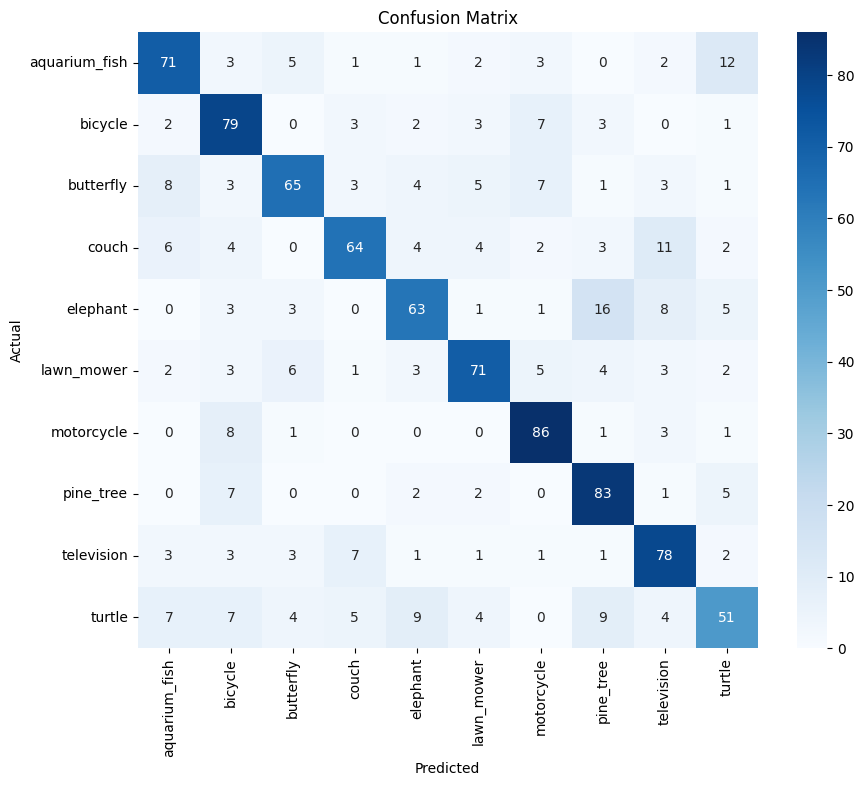

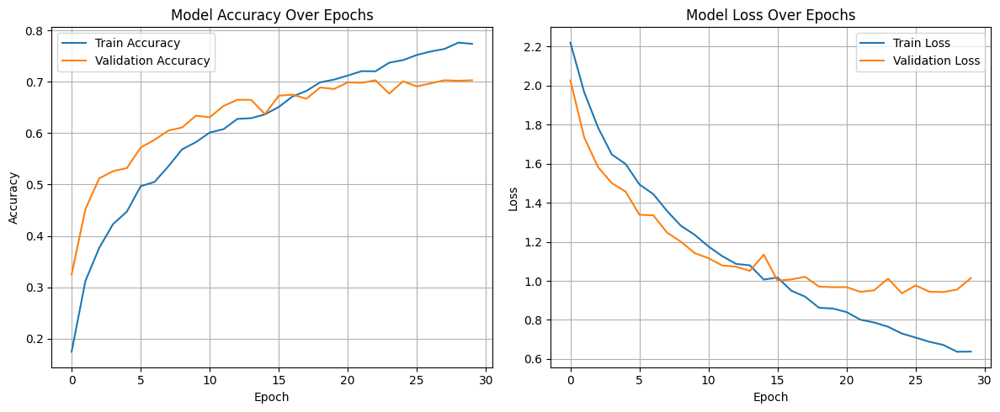

In [36]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()



##### 2. Deep (High Depth & Size) Model

In [38]:
tf.keras.backend.clear_session()

In [39]:
model = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [40]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [41]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 10, 10, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 5, 5, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       819,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,082,186 (4.13 MB)

 Trainable params: 1,082,186 (4.13 MB)

 Non-trainable params: 0 (0.00 B)

In [42]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64, callbacks=[early_stop], verbose=1)


Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - accuracy: 0.1625 - loss: 2.2313 - val_accuracy: 0.3520 - val_loss: 1.8828
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3704 - loss: 1.8217 - val_accuracy: 0.4770 - val_loss: 1.5520
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5053 - loss: 1.4926 - val_accuracy: 0.5580 - val_loss: 1.3172
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5913 - loss: 1.2481 - val_accuracy: 0.6170 - val_loss: 1.1750
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6386 - loss: 1.1093 - val_accuracy: 0.6460 - val_loss: 1.0989
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6766 - loss: 0.9947 - val_accuracy: 0.6810 - val_loss: 1.0003
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7222 - loss: 0.8444 - val_accuracy: 0.6460 - val_loss: 1.1337
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7311 - loss: 0.8202 - val_accuracy: 0.6900 - v

In [43]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Deep] Test Accuracy: {test_accuracy:.4f}")
print(f"[Deep] Test Loss: {test_loss:.4f}")



[Deep] Test Accuracy: 0.6820
[Deep] Test Loss: 0.9617


Test Accuracy: 0.6820
Test Loss: 0.9617
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.66      0.79      0.72       100
      bicycle       0.61      0.59      0.60       100
    butterfly       0.57      0.70      0.63       100
        couch       0.70      0.56      0.62       100
     elephant       0.78      0.59      0.67       100
   lawn_mower       0.69      0.77      0.73       100
   motorcycle       0.72      0.89      0.79       100
    pine_tree       0.70      0.76      0.73       100
   television       0.85      0.57      0.68       100
       turtle       0.62      0.60      0.61       100

     accuracy                           0.68      1000
    macro avg       0.69      0.68      0.68      1000
 weighted avg       0.69      0.68      0.68      1000



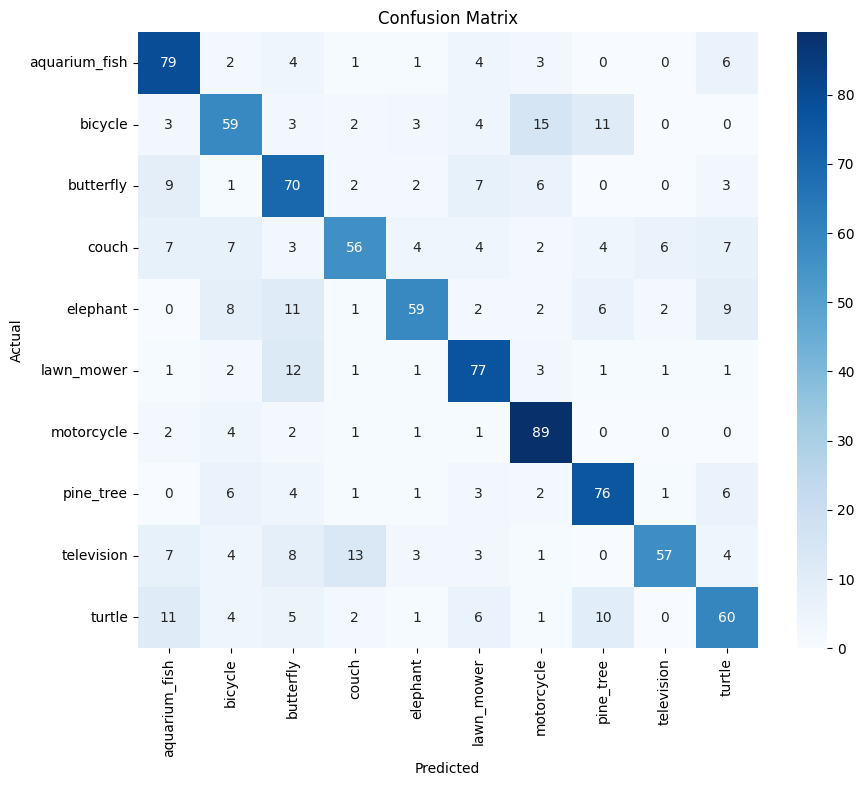

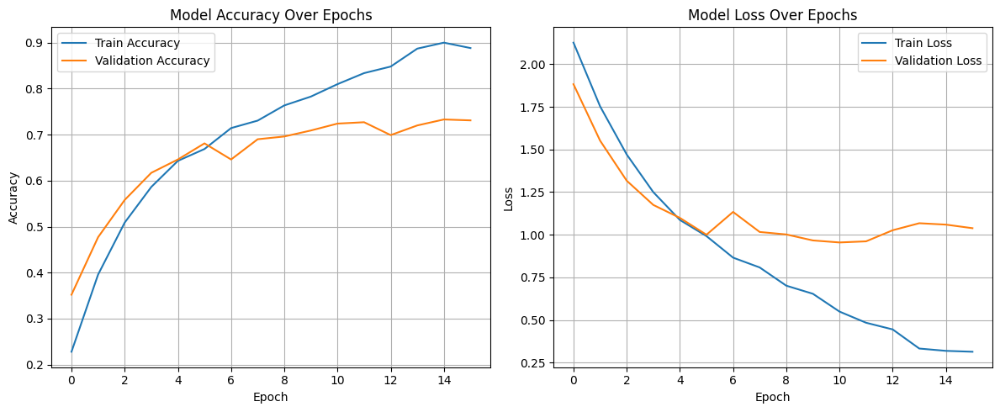

In [44]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### **Summary of Results:**

In this part of the experiment, I tested how changing the size and depth of the CNN affects its performance. I compared two models: one with a relatively shallow architecture and fewer parameters, and another that was deeper and had more layers and filters.

Surprisingly, the shallow model actually performed better, reaching about 71.1% test accuracy, while the deeper model ended up slightly lower at 68.2%. The confusion matrices and classification reports also showed that the shallow model had more balanced predictions across all classes. It handled tricky categories like motorcycle and pine_tree quite well, whereas the deeper model started to get confused in some cases—especially with television and bicycle.

Looking at the training and validation curves, the shallow model showed a more stable learning process. Its validation accuracy closely followed the training accuracy, which usually means it was generalizing well. On the other hand, the deeper model seemed to start overfitting earlier, with the gap between training and validation widening more quickly.

So even though the deeper model had more parameters and looked more powerful on paper, it didn’t really give better results here. This might be because it needed more data or better tuning to avoid overfitting. The takeaway here is simple: just because a model is bigger doesn’t always mean it will perform better. Sometimes, keeping things simple actually works best, especially when the dataset isn't huge or the task doesn’t require too much abstraction.



#### 6.3.2: Use fewer or more convolutional/maxpooling layers and different shapes, what is the effect?

##### Case 1: Shallow (Low Depth & Size) Model

In [45]:
tf.keras.backend.clear_session()

In [46]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [47]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [48]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [49]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [50]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.1476 - loss: 2.2573 - val_accuracy: 0.4020 - val_loss: 1.8945
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3372 - loss: 1.8952 - val_accuracy: 0.5080 - val_loss: 1.6189
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4466 - loss: 1.6435 - val_accuracy: 0.5710 - val_loss: 1.3969
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4882 - loss: 1.4973 - val_accuracy: 0.5890 - val_loss: 1.2892
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5456 - loss: 1.3874 - val_accuracy: 0.6220 - val_loss: 1.2244
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5811 - loss: 1.2630 - val_accuracy: 0.6290 - val_loss: 1.1710
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5731 - loss: 1.2491 - val_accuracy: 0.6350 - val_loss: 1.1427
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6108 - loss: 1.1857 - val_accuracy: 0.6350 - val_loss

In [51]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Shallow] Test Accuracy: {test_accuracy:.4f}")
print(f"[Shallow] Test Loss: {test_loss:.4f}")


[Shallow] Test Accuracy: 0.7200
[Shallow] Test Loss: 0.8855


Test Accuracy: 0.7200
Test Loss: 0.8855
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.66      0.81      0.73       100
      bicycle       0.70      0.74      0.72       100
    butterfly       0.69      0.70      0.70       100
        couch       0.74      0.68      0.71       100
     elephant       0.80      0.66      0.72       100
   lawn_mower       0.87      0.65      0.74       100
   motorcycle       0.70      0.88      0.78       100
    pine_tree       0.74      0.81      0.78       100
   television       0.71      0.76      0.73       100
       turtle       0.65      0.51      0.57       100

     accuracy                           0.72      1000
    macro avg       0.73      0.72      0.72      1000
 weighted avg       0.73      0.72      0.72      1000



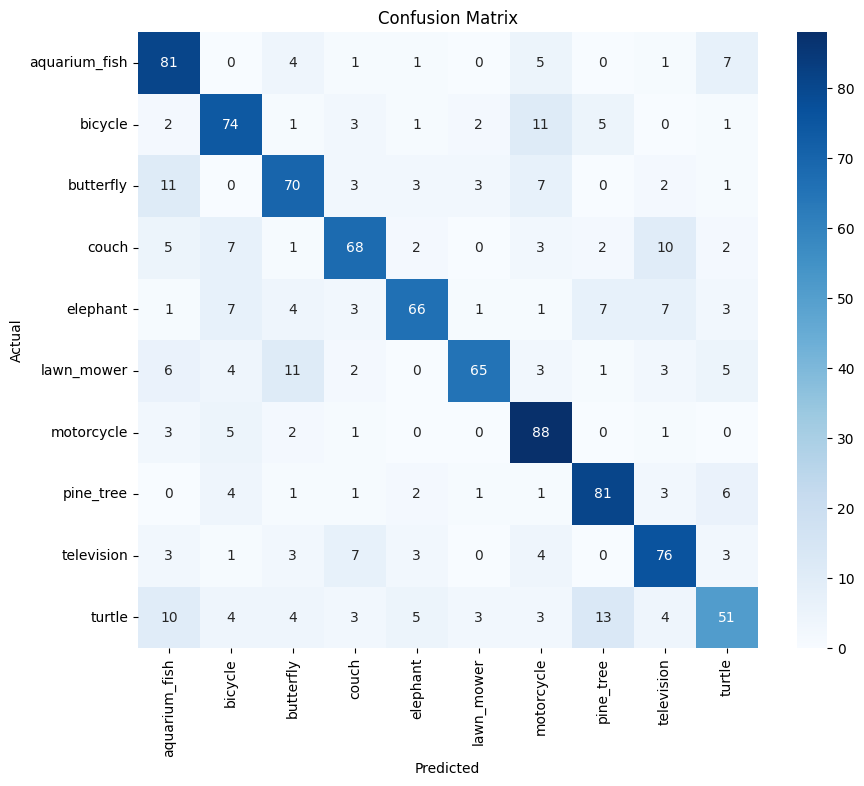

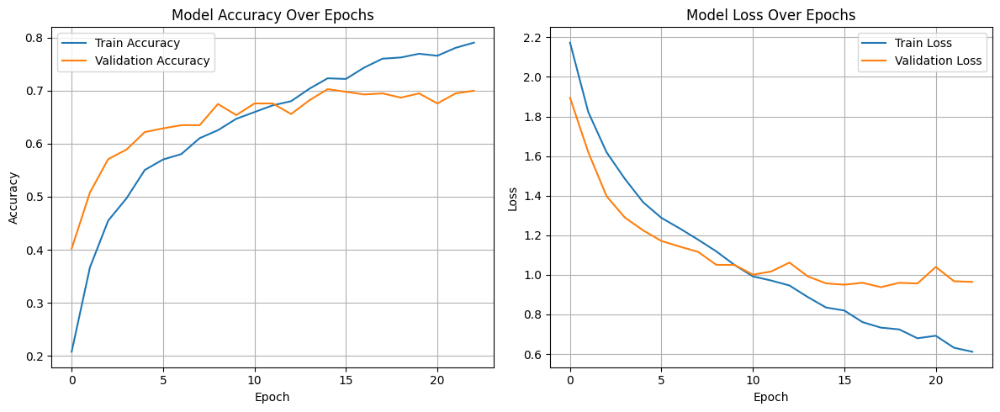

In [52]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Case 2: Case 2: Medium Depth (4 Conv + 3 Pool, ReLU)

In [53]:
tf.keras.backend.clear_session()

In [54]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Conv2D(256, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [55]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [56]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 10, 10, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 5, 5, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 3, 3, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 604,362 (2.31 MB)

 Trainable params: 604,362 (2.31 MB)

 Non-trainable params: 0 (0.00 B)

In [57]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.1199 - loss: 2.2864 - val_accuracy: 0.2010 - val_loss: 2.1545
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2230 - loss: 2.1211 - val_accuracy: 0.2930 - val_loss: 1.9536
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.3337 - loss: 1.8998 - val_accuracy: 0.4270 - val_loss: 1.7119
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4209 - loss: 1.7086 - val_accuracy: 0.4740 - val_loss: 1.5884
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4816 - loss: 1.5260 - val_accuracy: 0.5210 - val_loss: 1.4052
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5566 - loss: 1.3368 - val_accuracy: 0.5590 - val_loss: 1.3033
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6011 - loss: 1.1946 - val_accuracy: 0.5690 - val_loss: 1.2791
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6322 - loss: 1.0749 - val_accuracy: 0.5970 - va

In [58]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case 2 - Medium Layers] Test Accuracy: {test_accuracy:.4f}")


[Case 2 - Medium Layers] Test Accuracy: 0.6480


Test Accuracy: 0.6480
Test Loss: 1.0625
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.82      0.68      0.74       100
      bicycle       0.64      0.63      0.64       100
    butterfly       0.54      0.71      0.61       100
        couch       0.59      0.58      0.58       100
     elephant       0.61      0.75      0.67       100
   lawn_mower       0.68      0.70      0.69       100
   motorcycle       0.74      0.67      0.70       100
    pine_tree       0.70      0.76      0.73       100
   television       0.57      0.64      0.60       100
       turtle       0.71      0.36      0.48       100

     accuracy                           0.65      1000
    macro avg       0.66      0.65      0.64      1000
 weighted avg       0.66      0.65      0.64      1000



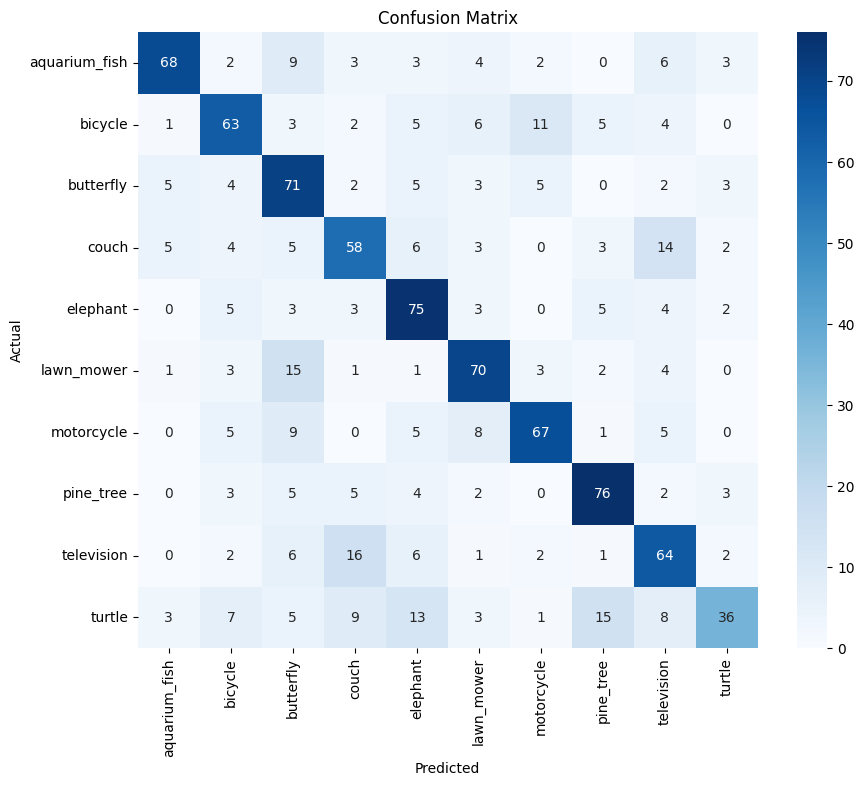

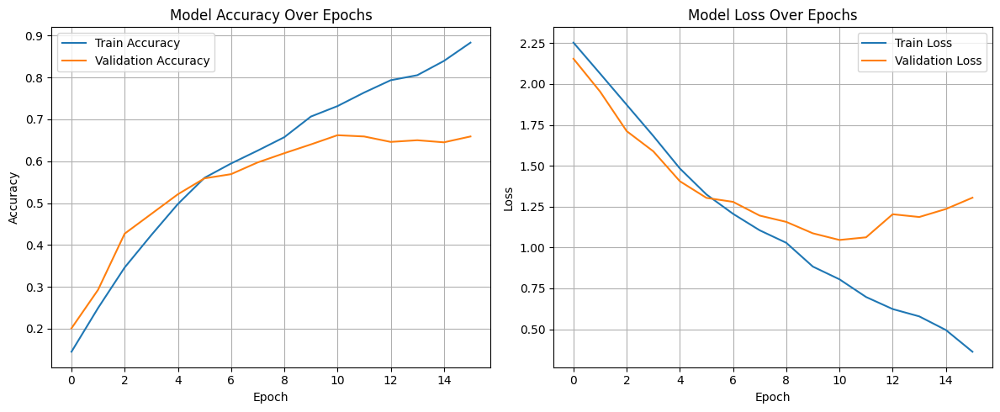

In [59]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Case 3: Very Deep (8 Conv + 5 Pool, Mixed Activations)

In [79]:
tf.keras.backend.clear_session()

In [80]:
model = Sequential([
    Conv2D(32, (3, 3), padding='same', input_shape=(32, 32, 3)),
    Activation('tanh'),

    Conv2D(32, (3, 3), padding='same'),
    Activation(swish),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), padding='same'),
    LeakyReLU(alpha=0.1),

    Conv2D(64, (3, 3), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), padding='same'),
    Activation(swish),

    Conv2D(128, (3, 3), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),

    Conv2D(256, (3, 3), padding='same'),
    LeakyReLU(alpha=0.1),

    Conv2D(256, (3, 3), padding='same'),
    Activation('tanh'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [81]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [82]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 8, 8, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 4, 4, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,702,186 (6.49 MB)

 Trainable params: 1,702,186 (6.49 MB)

 Non-trainable params: 0 (0.00 B)

In [83]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64,
                    #callbacks=[early_stop],
                    verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1142 - loss: 2.2887 - val_accuracy: 0.1470 - val_loss: 2.2039
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.1985 - loss: 2.1669 - val_accuracy: 0.3310 - val_loss: 1.9359
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.3416 - loss: 1.8838 - val_accuracy: 0.4120 - val_loss: 1.7463
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.4111 - loss: 1.7214 - val_accuracy: 0.4490 - val_loss: 1.5714
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5132 - loss: 1.4325 - val_accuracy: 0.5460 - val_loss: 1.3570
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5938 - loss: 1.2213 - val_accuracy: 0.5780 - val_loss: 1.2164
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6407 - loss: 1.0536 - val_accuracy: 0.6360 - val_loss: 1.1272
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7045 - loss: 0.8628 - val_accuracy: 0.6350 - 

In [84]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case 3 - Very Deep w/ Mixed Activations] Test Accuracy: {test_accuracy:.4f}")


[Case 3 - Very Deep w/ Mixed Activations] Test Accuracy: 0.6800


Test Accuracy: 0.6800
Test Loss: 1.9377
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.71      0.79      0.75       100
      bicycle       0.58      0.71      0.64       100
    butterfly       0.67      0.63      0.65       100
        couch       0.60      0.57      0.58       100
     elephant       0.73      0.63      0.68       100
   lawn_mower       0.69      0.66      0.68       100
   motorcycle       0.68      0.82      0.74       100
    pine_tree       0.74      0.89      0.81       100
   television       0.70      0.74      0.72       100
       turtle       0.73      0.36      0.48       100

     accuracy                           0.68      1000
    macro avg       0.68      0.68      0.67      1000
 weighted avg       0.68      0.68      0.67      1000



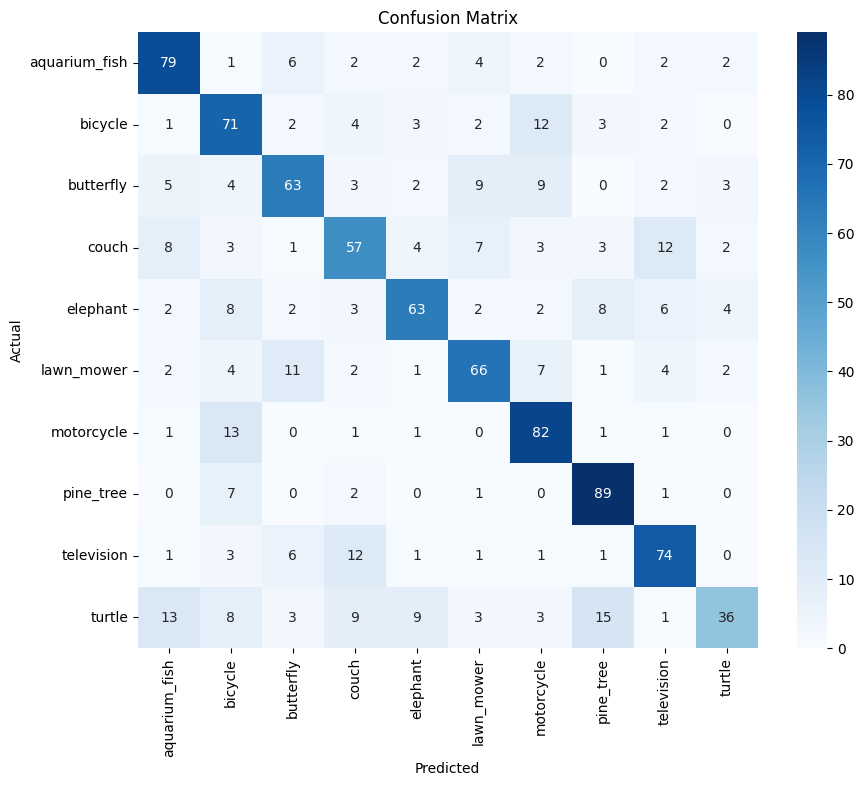

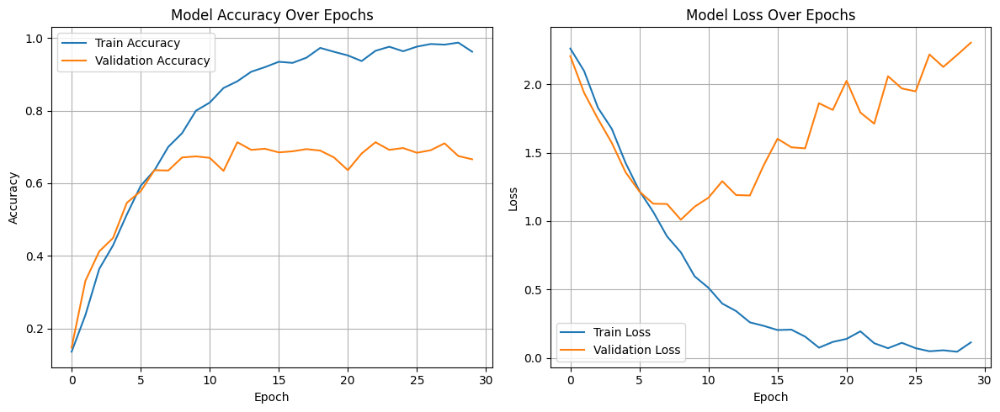

In [85]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### **Summary of Results:**

In this task, I experimented with different CNN architectures by varying the depth, the number of convolutional/max pooling layers, and activation functions to see how each configuration affects model performance on a 10-class image classification task.

Case 1: Shallow CNN (2 Conv + 2 Pool)
This baseline model was relatively lightweight but still managed to reach a decent test accuracy of 72% with a loss of 0.88. The training and validation accuracy curves showed stable improvements, and overfitting was minimal. The confusion matrix showed that most classes, like motorcycle, pine_tree, and television, were handled well. However, turtle was again among the more misclassified categories. The results suggest that even a smaller model can generalize fairly well when appropriately regularized.

Case 2: Medium-Depth CNN (4 Conv + 3 Pool)
When I added more convolutional layers and max pooling layers, the model became deeper but didn’t perform better — the accuracy actually dropped to 64.8% and the loss increased to 1.06. Although training accuracy was higher, validation accuracy plateaued early and showed signs of underperformance. This suggests that just adding more layers doesn't guarantee improved results. Some classes like couch, butterfly, and turtle had notably lower recall, indicating more confusion in prediction. The model possibly started to overfit or just didn’t benefit from the added complexity.

Case 3: Very Deep CNN (8 Conv + 5 Pool with mixed activations)
This was the most complex model with eight convolutional layers and mixed activations (ReLU and LeakyReLU). While it achieved high training accuracy (almost perfect), the validation accuracy plateaued around 68% and even showed signs of overfitting in later epochs. The validation loss graph supports this with a noticeable increase toward the end. Precision and recall for some classes like turtle and couch dropped compared to shallower networks, which hints that the model’s complexity didn’t necessarily help the generalization. The model learned the training data well but couldn’t carry that performance over to new data.

Summary:
From this experiment, it’s pretty clear that more depth doesn’t always mean better results. The shallow model with fewer layers actually performed better than the medium and very deep models in terms of validation accuracy and loss. It also trained faster and was easier to manage. On the other hand, deeper models started to overfit or became inefficient without adding real value. So, balancing complexity with generalization is key — and sometimes, keeping it simple is actually smarter.

#### 6.3.3: Experiment with different activation functions in the inner layers and in the convolutional layers (relu, sigmoid, softmask, etc)

##### Case 1: ReLU Activation Everywhere

In [86]:
tf.keras.backend.clear_session()

In [87]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [88]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [89]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,143,242 (4.36 MB)

 Trainable params: 1,143,242 (4.36 MB)

 Non-trainable params: 0 (0.00 B)

In [90]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - accuracy: 0.1725 - loss: 2.2292 - val_accuracy: 0.4430 - val_loss: 1.7673
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4047 - loss: 1.7907 - val_accuracy: 0.5240 - val_loss: 1.4918
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4992 - loss: 1.4848 - val_accuracy: 0.5890 - val_loss: 1.2347
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5711 - loss: 1.2668 - val_accuracy: 0.6320 - val_loss: 1.1328
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6247 - loss: 1.1228 - val_accuracy: 0.6580 - val_loss: 1.0845
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6830 - loss: 0.9687 - val_accuracy: 0.6670 - val_loss: 1.0510
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7172 - loss: 0.8511 - val_accuracy: 0.6760 - val_loss: 1.0181
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7361 - loss: 0.7978 - val_accuracy: 0.6890 - val_l

In [91]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case A - ReLU] Test Accuracy: {test_accuracy:.4f}")


[Case A - ReLU] Test Accuracy: 0.6950


Test Accuracy: 0.6950
Test Loss: 0.9084
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.78      0.73      0.76       100
      bicycle       0.61      0.69      0.65       100
    butterfly       0.55      0.71      0.62       100
        couch       0.73      0.62      0.67       100
     elephant       0.78      0.59      0.67       100
   lawn_mower       0.81      0.70      0.75       100
   motorcycle       0.72      0.84      0.77       100
    pine_tree       0.73      0.77      0.75       100
   television       0.78      0.72      0.75       100
       turtle       0.56      0.58      0.57       100

     accuracy                           0.69      1000
    macro avg       0.71      0.70      0.70      1000
 weighted avg       0.71      0.69      0.70      1000



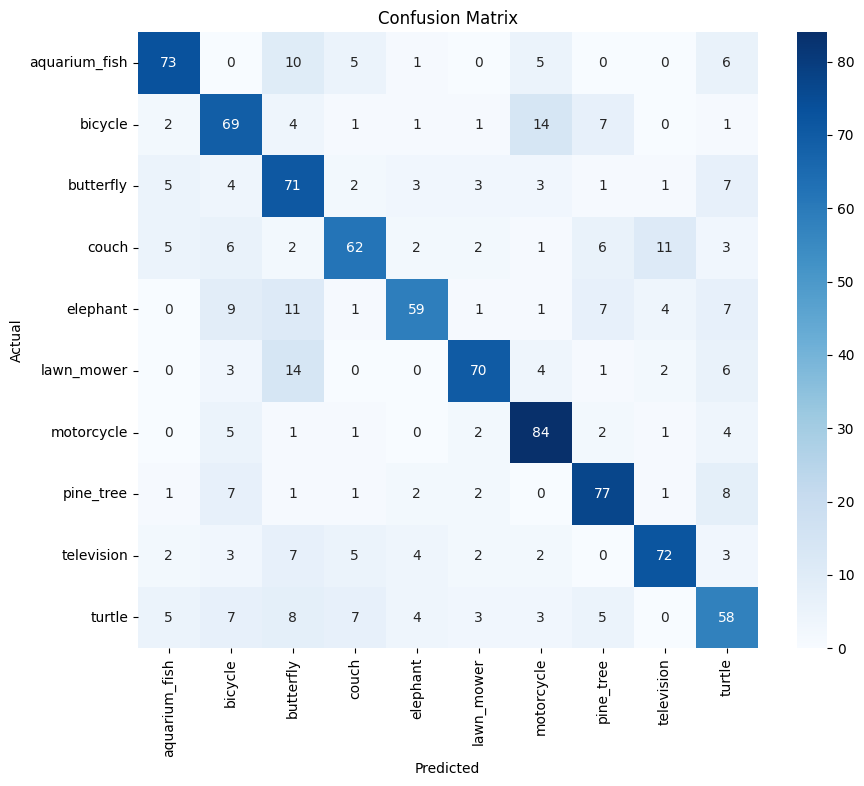

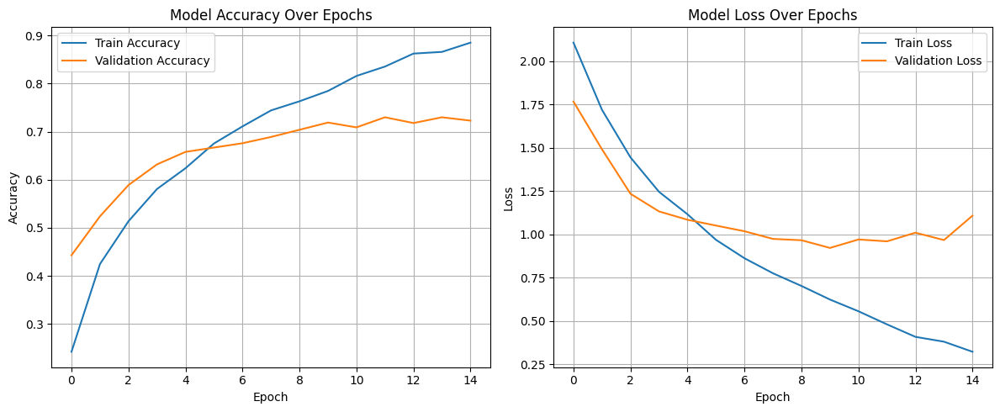

In [92]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Case 2: Sigmoid Activation Everywhere

In [110]:
tf.keras.backend.clear_session()

In [111]:
model = Sequential([
    Conv2D(32, (3, 3), activation='sigmoid', padding='same', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation='sigmoid', padding='same'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation='sigmoid', padding='same'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(128, activation='sigmoid'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [112]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [113]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,143,242 (4.36 MB)

 Trainable params: 1,143,242 (4.36 MB)

 Non-trainable params: 0 (0.00 B)

In [114]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64,
                    #callbacks=[early_stop],
                    verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.1070 - loss: 2.9115 - val_accuracy: 0.0900 - val_loss: 2.3847
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1065 - loss: 2.5547 - val_accuracy: 0.0980 - val_loss: 2.3061
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0946 - loss: 2.4803 - val_accuracy: 0.0800 - val_loss: 2.3087
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1049 - loss: 2.4481 - val_accuracy: 0.1060 - val_loss: 2.3058
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0895 - loss: 2.4483 - val_accuracy: 0.0800 - val_loss: 2.3056
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0944 - loss: 2.4076 - val_accuracy: 0.0900 - val_loss: 2.3079
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.0891 - loss: 2.3866 - val_accuracy: 0.0800 - val_loss: 2.3083
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1022 - loss: 2.3574 - val_accuracy: 0.0980 - val_los

In [115]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case B - Sigmoid] Test Accuracy: {test_accuracy:.4f}")


[Case B - Sigmoid] Test Accuracy: 0.1000


Test Accuracy: 0.1000
Test Loss: 2.3041
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.00      0.00      0.00       100
      bicycle       0.00      0.00      0.00       100
    butterfly       0.10      1.00      0.18       100
        couch       0.00      0.00      0.00       100
     elephant       0.00      0.00      0.00       100
   lawn_mower       0.00      0.00      0.00       100
   motorcycle       0.00      0.00      0.00       100
    pine_tree       0.00      0.00      0.00       100
   television       0.00      0.00      0.00       100
       turtle       0.00      0.00      0.00       100

     accuracy                           0.10      1000
    macro avg       0.01      0.10      0.02      1000
 weighted avg       0.01      0.10      0.02      1000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


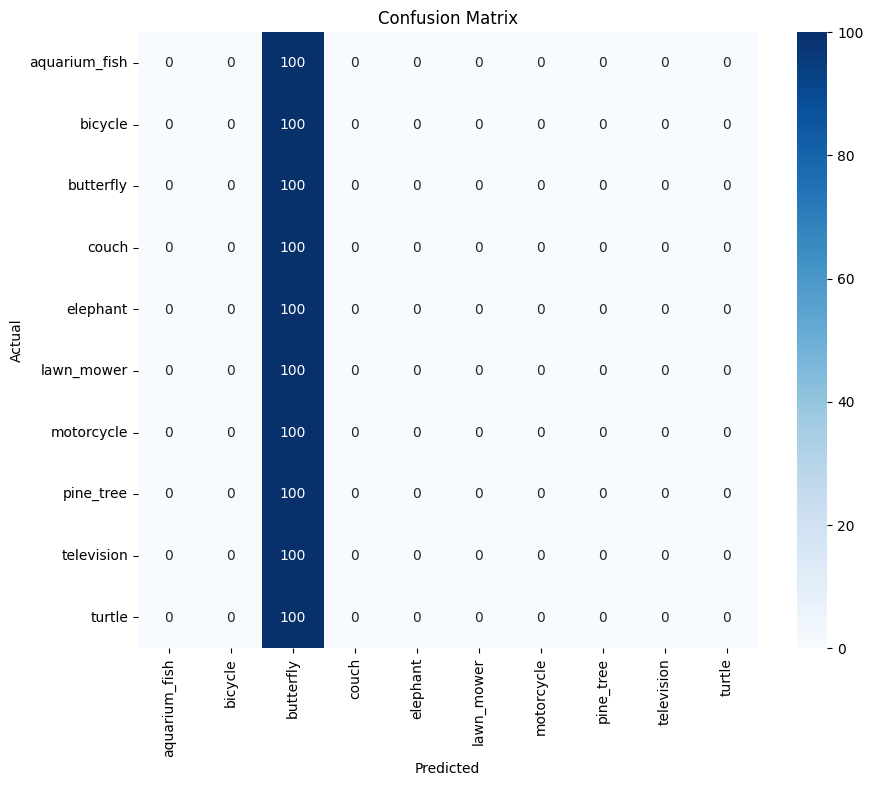

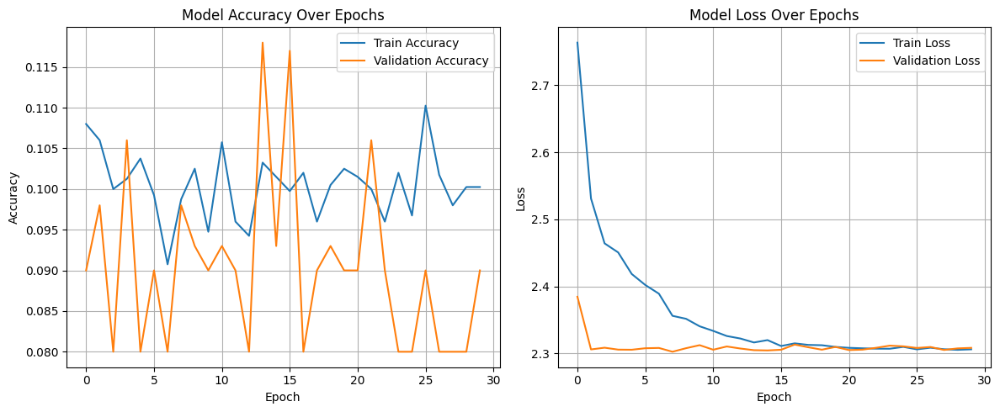

In [116]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Case 3: Swish Activation Everywhere

In [100]:
tf.keras.backend.clear_session()

In [101]:
model = Sequential([
    Conv2D(32, (3, 3), activation=swish, padding='same', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation=swish, padding='same'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation=swish, padding='same'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(128, activation=swish),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [102]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [103]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,143,242 (4.36 MB)

 Trainable params: 1,143,242 (4.36 MB)

 Non-trainable params: 0 (0.00 B)

In [104]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2,
                    epochs=30, batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.2350 - loss: 2.1188 - val_accuracy: 0.4560 - val_loss: 1.6348
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.4684 - loss: 1.5738 - val_accuracy: 0.5890 - val_loss: 1.3342
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5767 - loss: 1.2985 - val_accuracy: 0.6170 - val_loss: 1.1919
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6378 - loss: 1.0721 - val_accuracy: 0.6730 - val_loss: 1.0595
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6867 - loss: 0.9183 - val_accuracy: 0.6860 - val_loss: 0.9992
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7509 - loss: 0.7687 - val_accuracy: 0.6890 - val_loss: 0.9897
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.7770 - loss: 0.6736 - val_accuracy: 0.7160 - val_loss: 0.9401
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8267 - loss: 0.5278 - val_accuracy: 0.7160 - val_los

In [105]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case C - Swish] Test Accuracy: {test_accuracy:.4f}")


[Case C - Swish] Test Accuracy: 0.7070


Test Accuracy: 0.7070
Test Loss: 0.9085
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.77      0.75      0.76       100
      bicycle       0.63      0.68      0.65       100
    butterfly       0.61      0.69      0.65       100
        couch       0.72      0.67      0.69       100
     elephant       0.68      0.69      0.69       100
   lawn_mower       0.79      0.69      0.74       100
   motorcycle       0.70      0.86      0.77       100
    pine_tree       0.77      0.72      0.74       100
   television       0.78      0.74      0.76       100
       turtle       0.65      0.58      0.61       100

     accuracy                           0.71      1000
    macro avg       0.71      0.71      0.71      1000
 weighted avg       0.71      0.71      0.71      1000



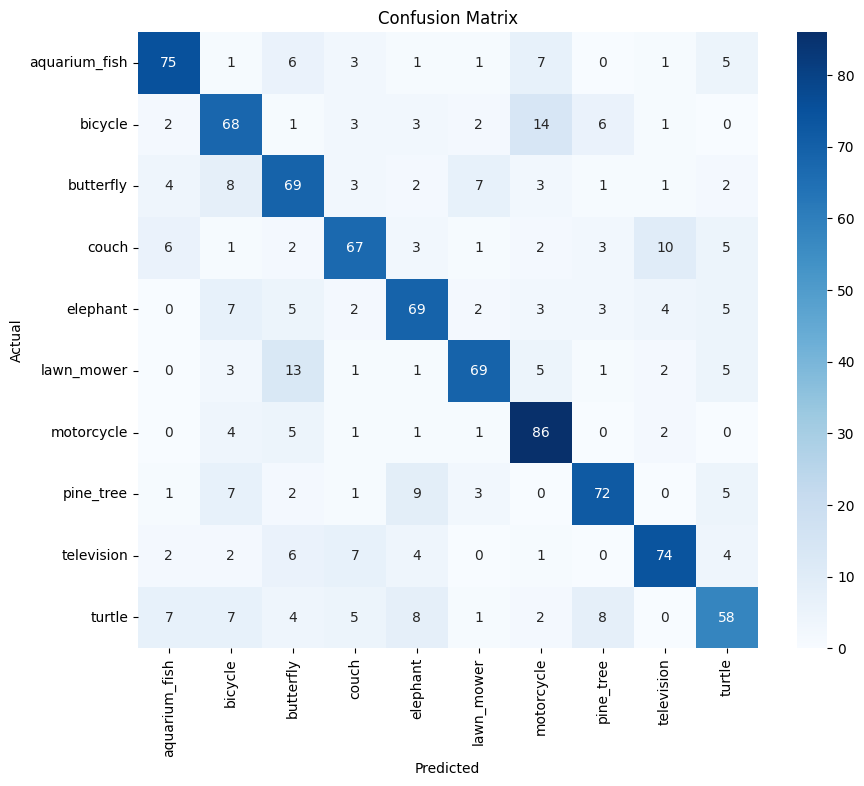

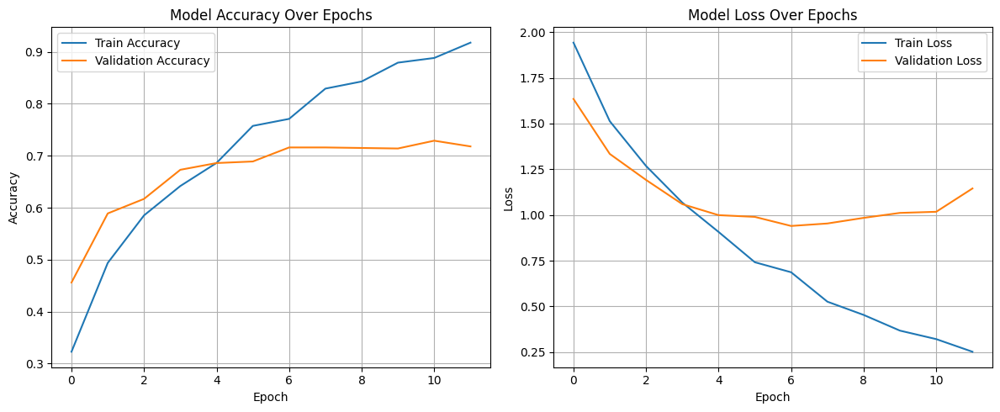

In [106]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### **Analysis of Results:**

In this round of testing, I compared the effect of different activation functions—ReLU, Sigmoid, and Swish—on CNN model performance. Starting with ReLU, the model showed pretty solid results. It achieved an accuracy of 69.5%, with decent precision and recall across most classes. The loss also steadily decreased over time, which indicates that the model was learning well without overfitting too quickly.

On the other hand, when using Sigmoid activations throughout the network, things didn’t go as well. The accuracy basically dropped to random guess levels (~10%), and the confusion matrix was clearly broken—everything got predicted as "butterfly." This isn’t too surprising since Sigmoid functions tend to saturate and cause vanishing gradient problems, especially in deeper networks.

Then came Swish. This activation function gave the highest accuracy among the three—around 70.7%. The learning curves looked more stable, and it managed to keep both training and validation loss in check. The confusion matrix also showed better class-wise distribution compared to ReLU, especially in tough-to-classify labels like “turtle” or “couch.”

So in short:

ReLU is reliable and works decently well.

Sigmoid is a no-go for this setup—just doesn’t scale.

Swish edges ahead with slightly better generalization and overall performance.

This makes a good case for Swish in deeper CNNs where you're trying to balance performance and gradient flow.

#### 6.3.4: What is the effect of using different activation functions? how about combining the activation function choice with different network size and depth?

#####  Case A: Shallow Network with ReLU

In [117]:
tf.keras.backend.clear_session()

In [118]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [119]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [120]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       262,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 282,250 (1.08 MB)

 Trainable params: 282,250 (1.08 MB)

 Non-trainable params: 0 (0.00 B)

In [121]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2, epochs=30,
                    batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - accuracy: 0.1434 - loss: 2.2707 - val_accuracy: 0.3420 - val_loss: 1.9885
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.3179 - loss: 1.9617 - val_accuracy: 0.4550 - val_loss: 1.6780
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3838 - loss: 1.8020 - val_accuracy: 0.4860 - val_loss: 1.5086
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4411 - loss: 1.6264 - val_accuracy: 0.5630 - val_loss: 1.3795
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4745 - loss: 1.5206 - val_accuracy: 0.5990 - val_loss: 1.2824
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5294 - loss: 1.4186 - val_accuracy: 0.6090 - val_loss: 1.3038
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5439 - loss: 1.3592 - val_accuracy: 0.6360 - val_loss: 1.2050
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5522 - loss: 1.3064 - val_accuracy: 0.6500 - val_loss

In [122]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case A - ReLU + Shallow] Test Accuracy: {test_accuracy:.4f}")


[Case A - ReLU + Shallow] Test Accuracy: 0.6900


Test Accuracy: 0.6900
Test Loss: 0.9105
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.68      0.78      0.73       100
      bicycle       0.69      0.67      0.68       100
    butterfly       0.59      0.70      0.64       100
        couch       0.67      0.64      0.66       100
     elephant       0.88      0.51      0.65       100
   lawn_mower       0.73      0.74      0.74       100
   motorcycle       0.68      0.82      0.75       100
    pine_tree       0.64      0.83      0.72       100
   television       0.77      0.75      0.76       100
       turtle       0.66      0.46      0.54       100

     accuracy                           0.69      1000
    macro avg       0.70      0.69      0.69      1000
 weighted avg       0.70      0.69      0.69      1000



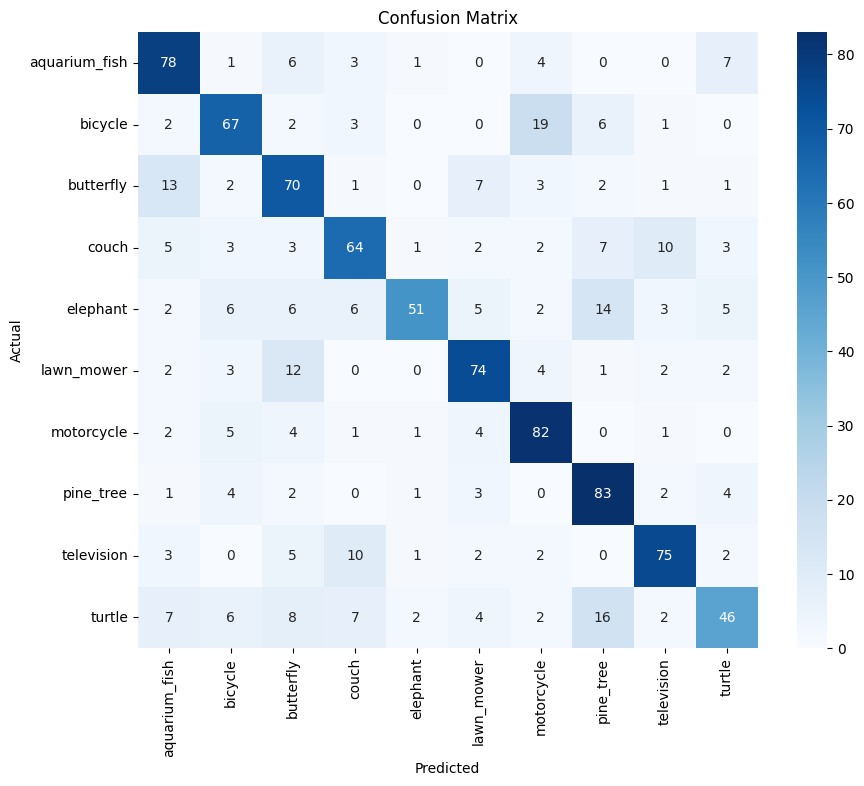

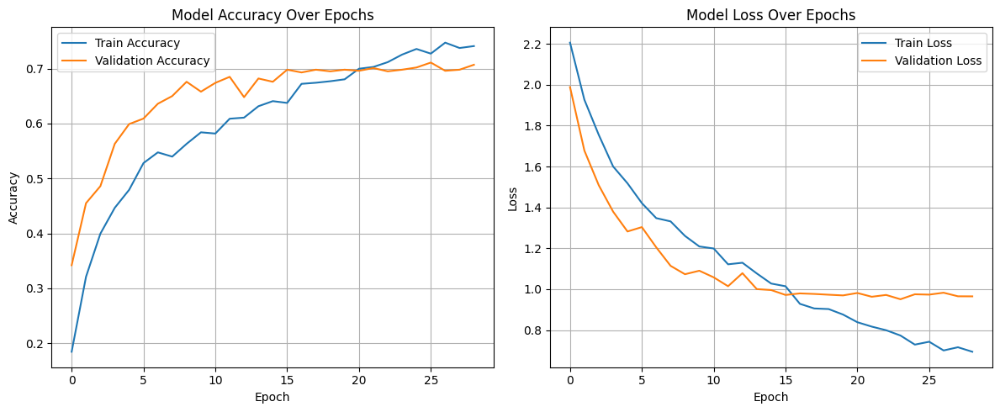

In [123]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

 ##### Case B: Medium Network with ReLU + Swish

In [124]:
tf.keras.backend.clear_session()

In [125]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation=swish, padding='same'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation=swish, padding='same'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [126]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])



In [127]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,143,242 (4.36 MB)

 Trainable params: 1,143,242 (4.36 MB)

 Non-trainable params: 0 (0.00 B)

In [128]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2, epochs=30,
                    batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.1915 - loss: 2.1817 - val_accuracy: 0.4870 - val_loss: 1.5931
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4707 - loss: 1.5690 - val_accuracy: 0.5620 - val_loss: 1.3168
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5662 - loss: 1.2902 - val_accuracy: 0.6250 - val_loss: 1.1810
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6234 - loss: 1.1280 - val_accuracy: 0.6490 - val_loss: 1.0734
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6811 - loss: 0.9404 - val_accuracy: 0.6700 - val_loss: 1.0539
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7009 - loss: 0.8980 - val_accuracy: 0.6890 - val_loss: 1.0026
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7651 - loss: 0.7116 - val_accuracy: 0.6980 - val_loss: 0.9724
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7870 - loss: 0.6360 - val_accuracy: 0.6900 - val_los

In [129]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case B - ReLU+Swish + Medium Depth] Test Accuracy: {test_accuracy:.4f}")


[Case B - ReLU+Swish + Medium Depth] Test Accuracy: 0.6870


Test Accuracy: 0.6870
Test Loss: 0.9289
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.72      0.76      0.74       100
      bicycle       0.72      0.63      0.67       100
    butterfly       0.54      0.62      0.58       100
        couch       0.59      0.74      0.66       100
     elephant       0.58      0.83      0.69       100
   lawn_mower       0.88      0.66      0.75       100
   motorcycle       0.87      0.79      0.83       100
    pine_tree       0.78      0.71      0.74       100
   television       0.71      0.65      0.68       100
       turtle       0.61      0.48      0.54       100

     accuracy                           0.69      1000
    macro avg       0.70      0.69      0.69      1000
 weighted avg       0.70      0.69      0.69      1000



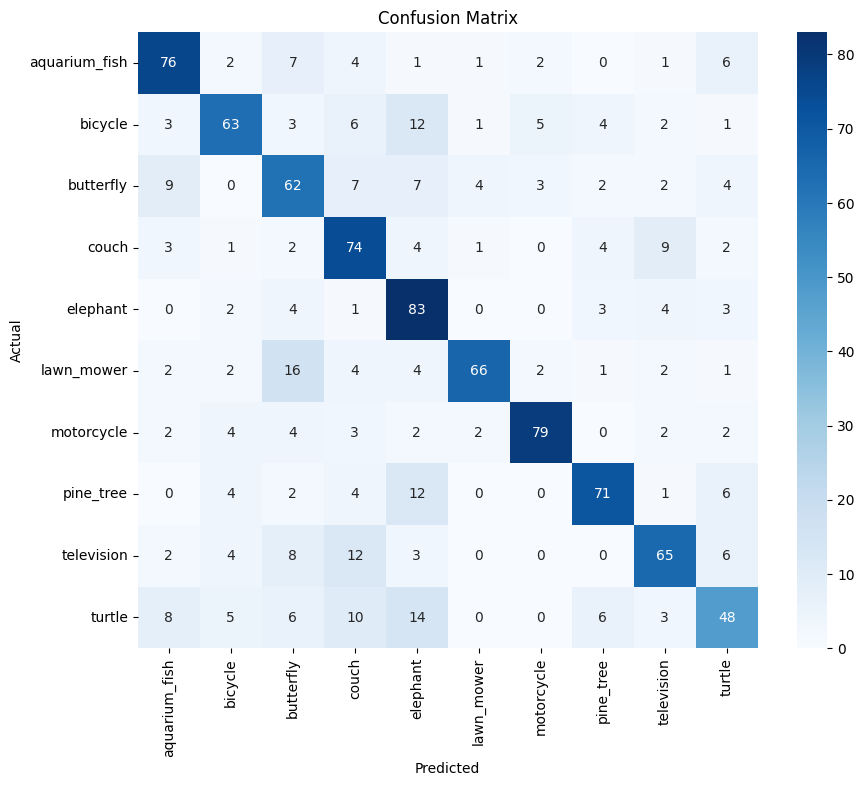

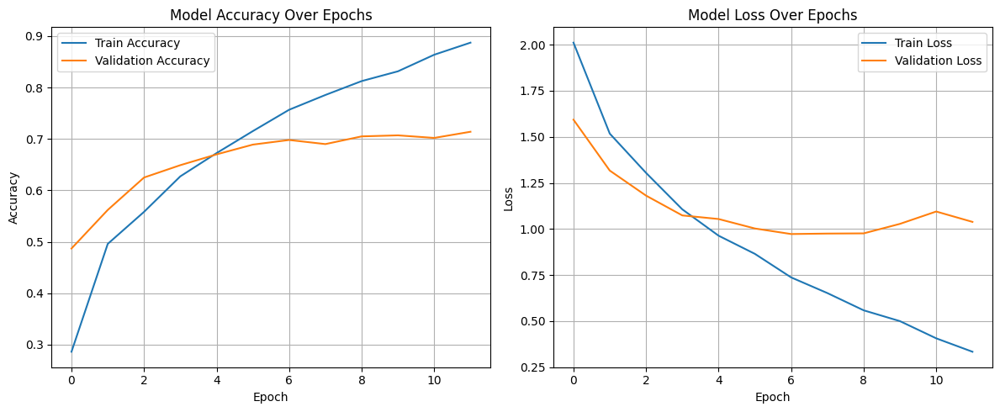

In [130]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### Case C: Deep Network with LeakyReLU, Swish, and tanh

In [131]:
tf.keras.backend.clear_session()

In [132]:
model = Sequential([
    Conv2D(32, (3, 3), padding='same', input_shape=(32, 32, 3)),
    Activation('tanh'),

    Conv2D(32, (3, 3), padding='same'),
    Activation(swish),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), padding='same'),
    LeakyReLU(0.1),

    Conv2D(64, (3, 3), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), padding='same'),
    Activation(swish),

    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [133]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [134]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 666,538 (2.54 MB)

 Trainable params: 666,538 (2.54 MB)

 Non-trainable params: 0 (0.00 B)

In [135]:
history = model.fit(x_train_subset, y_train_subset, validation_split=0.2, epochs=30,
                    batch_size=64, callbacks=[early_stop], verbose=1)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.1743 - loss: 2.2164 - val_accuracy: 0.4230 - val_loss: 1.7701
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.4006 - loss: 1.7337 - val_accuracy: 0.5440 - val_loss: 1.3938
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5105 - loss: 1.4251 - val_accuracy: 0.5570 - val_loss: 1.3330
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6096 - loss: 1.1495 - val_accuracy: 0.6400 - val_loss: 1.0787
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6957 - loss: 0.9001 - val_accuracy: 0.6520 - val_loss: 1.0116
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7137 - loss: 0.8372 - val_accuracy: 0.7090 - val_loss: 0.9640
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7753 - loss: 0.6825 - val_accuracy: 0.6980 - val_loss: 0.9588
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8067 - loss: 0.5595 - val_accuracy: 0.7210 - val_los

In [136]:
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"\n[Case C - Mixed Activations + Deep] Test Accuracy: {test_accuracy:.4f}")



[Case C - Mixed Activations + Deep] Test Accuracy: 0.7190


Test Accuracy: 0.7190
Test Loss: 0.8713
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

Classification Report:
               precision    recall  f1-score   support

aquarium_fish       0.77      0.73      0.75       100
      bicycle       0.62      0.78      0.69       100
    butterfly       0.70      0.73      0.71       100
        couch       0.71      0.64      0.67       100
     elephant       0.74      0.71      0.72       100
   lawn_mower       0.77      0.77      0.77       100
   motorcycle       0.69      0.81      0.75       100
    pine_tree       0.73      0.86      0.79       100
   television       0.83      0.59      0.69       100
       turtle       0.69      0.57      0.62       100

     accuracy                           0.72      1000
    macro avg       0.72      0.72      0.72      1000
 weighted avg       0.72      0.72      0.72      1000



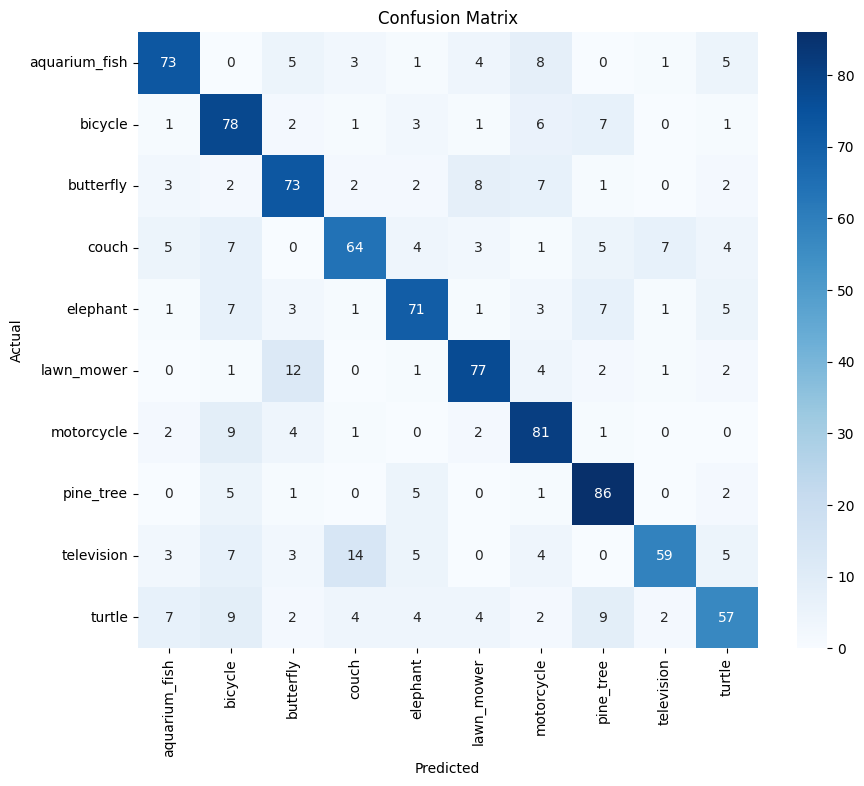

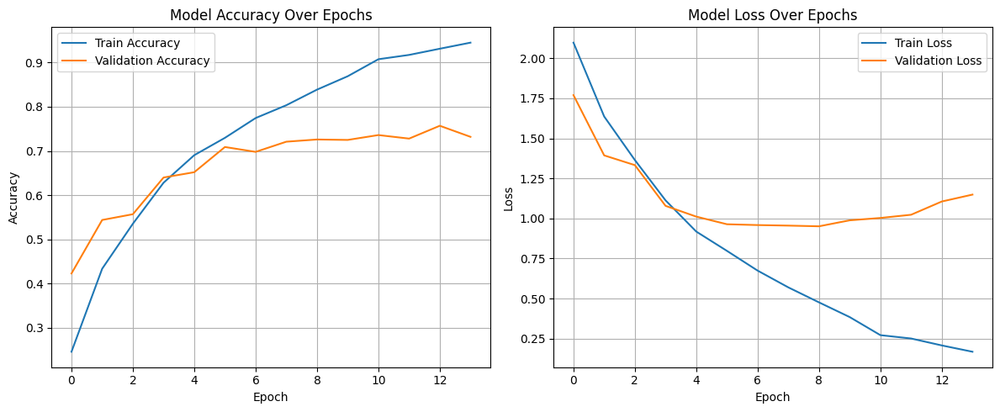

In [137]:
# Evaluate model
test_loss, test_accuracy = model.evaluate(x_test_subset, y_test_subset, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict class probabilities
y_pred_probs = model.predict(x_test_subset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_subset, axis=1)

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))

# Confusion matrix
conf_mat = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=selected_classes, yticklabels=selected_classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Accuracy and Loss over epochs
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##### **Interpretation of Results:**

In this experiment, I looked into how activation functions perform when paired with different network sizes and depths. I ran three configurations — a shallow network using ReLU, a medium-depth network using a mix of ReLU and Swish, and a deep network combining LeakyReLU, Swish, and Tanh. The idea was to see if certain activations work better with specific architectural setups.

Case A (Shallow Network + ReLU) gave fairly decent results. The model reached around 69% accuracy, and the training graphs show a steady rise in performance with no major signs of overfitting. ReLU worked quite well in this simpler network, helping it learn meaningful features without too much noise. The confusion matrix confirms this — classes like "motorcycle", "television", and "pine_tree" were recognized reasonably well, although “turtle” and “elephant” were a bit trickier.

Case B (Medium Network + ReLU + Swish) had a similar accuracy (~68.7%), but what’s interesting is the slightly better generalization in some categories. Classes like “elephant” and “couch” showed better recall and precision. Swish, known for its smooth non-linearity, may have helped avoid dead neurons in deeper parts of the network. But overall, this configuration didn’t outperform the shallow ReLU model by much — it just distributed learning slightly differently across classes.

Case C (Deep Network + LeakyReLU, Swish, Tanh) turned out to be the most stable among the three, with a final accuracy of 71.9%. The training and validation curves show smoother convergence, and confusion matrix results were more balanced across all classes. Combining different activations across layers allowed the network to extract more robust hierarchical features, especially for complex categories like “butterfly” and “pine_tree”. However, this depth comes with increased computation and a risk of overfitting — though in this case, early stopping seemed to keep it in check.

ReLU still holds up as a strong baseline, especially in shallow architectures. Swish adds some flexibility in mid-sized models, but its impact alone isn’t game-changing. The most noticeable gains came from mixing activations in a deeper setup — LeakyReLU helped gradients flow in early layers, while Tanh and Swish likely stabilized learning in later layers. In short, activation function choice matters more as the network gets deeper, but in small networks, it’s mostly about keeping things efficient and clean.

#### 6.3.5: experiment with various optimizers

In [147]:
tf.keras.backend.clear_session()

In [148]:
# Function to create model
def create_model():
    return Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(10, activation='softmax')
    ])

# Optimizer setup
optimizers_dict = {
    'Adam': Adam,
    'SGD': SGD,
    'RMSprop': RMSprop,
    'AdamW': AdamW
}

learning_rates = [0.01, 0.001, 0.0001]
val_accuracies = {}
val_losses = {}
final_metrics = {}

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Loop over all combinations
for opt_name, opt_class in optimizers_dict.items():
    for lr in learning_rates:
        tf.keras.backend.clear_session()
        model = create_model()
        optimizer = opt_class(learning_rate=lr)
        model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

        print(f"Training with {opt_name} (lr={lr})...")
        history = model.fit(
            x_train_subset, y_train_subset,
            validation_split=0.2,
            epochs=30,
            batch_size=64,
            verbose=0,
            callbacks=[early_stop]
        )

        key = f"{opt_name}_lr{lr}"
        val_accuracies[key] = history.history['val_accuracy']
        val_losses[key] = history.history['val_loss']
        final_metrics[key] = {
            'Final Val Accuracy': history.history['val_accuracy'][-1],
            'Final Val Loss': history.history['val_loss'][-1]
        }


Training with Adam (lr=0.01)...
Training with Adam (lr=0.001)...
Training with Adam (lr=0.0001)...
Training with SGD (lr=0.01)...
Training with SGD (lr=0.001)...
Training with SGD (lr=0.0001)...
Training with RMSprop (lr=0.01)...
Training with RMSprop (lr=0.001)...
Training with RMSprop (lr=0.0001)...
Training with AdamW (lr=0.01)...
Training with AdamW (lr=0.001)...
Training with AdamW (lr=0.0001)...


In [151]:
#  Print Final Accuracy + Loss for All Configs
print("\n=== Final Validation Metrics by Optimizer + Learning Rate ===")
for key, metrics in final_metrics.items():
    acc = metrics['Final Val Accuracy']
    loss = metrics['Final Val Loss']
    print(f"{key:20s} | Accuracy: {acc:.4f} | Loss: {loss:.4f}")



=== Final Validation Metrics by Optimizer + Learning Rate ===
Adam_lr0.01          | Accuracy: 0.5530 | Loss: 1.5360
Adam_lr0.001         | Accuracy: 0.7210 | Loss: 0.9516
Adam_lr0.0001        | Accuracy: 0.6300 | Loss: 1.1165
SGD_lr0.01           | Accuracy: 0.4750 | Loss: 1.5528
SGD_lr0.001          | Accuracy: 0.3030 | Loss: 2.1612
SGD_lr0.0001         | Accuracy: 0.1280 | Loss: 2.2908
RMSprop_lr0.01       | Accuracy: 0.5610 | Loss: 1.5666
RMSprop_lr0.001      | Accuracy: 0.7290 | Loss: 0.9928
RMSprop_lr0.0001     | Accuracy: 0.6120 | Loss: 1.2250
AdamW_lr0.01         | Accuracy: 0.5490 | Loss: 1.4506
AdamW_lr0.001        | Accuracy: 0.7040 | Loss: 0.9866
AdamW_lr0.0001       | Accuracy: 0.6690 | Loss: 1.0756


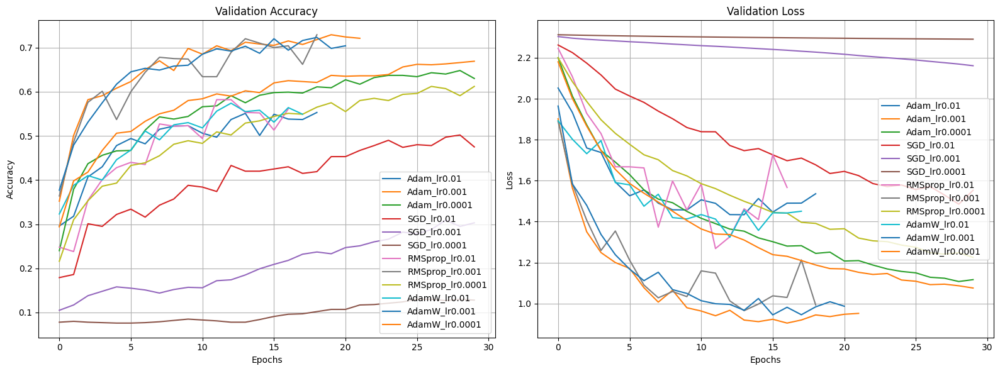

In [150]:
# Plot all metrics
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy plot
for label, acc_values in val_accuracies.items():
    axs[0].plot(acc_values, label=label)
axs[0].set_title('Validation Accuracy')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Accuracy')
axs[0].legend()
axs[0].grid(True)

# Loss plot
for label, loss_values in val_losses.items():
    axs[1].plot(loss_values, label=label)
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()


##### **Summary of Results:**

In this experiment, I compared the performance of several optimizers — Adam, SGD, RMSprop, and AdamW — across three different learning rates: 0.01, 0.001, and 0.0001. The goal was to understand how each optimizer behaves under different learning rates and which combinations offer the most stable and accurate training.

Starting with Adam, it was clear that the learning rate had a strong influence. At a high learning rate (0.01), the model struggled with a relatively low accuracy of 55.3% and higher loss, probably because it overshot optimal points. However, when I reduced the learning rate to 0.001, performance improved significantly — 72.1% accuracy, with much lower loss. Going even lower to 0.0001 made the training too slow to converge well, dropping accuracy to 63%. So, 0.001 seems to hit the sweet spot for Adam.

With SGD, the story was quite different. It consistently lagged behind the other optimizers. Even with a relatively high learning rate of 0.01, the accuracy capped at 47.5%, and it only got worse as the learning rate decreased. At 0.0001, it nearly collapsed, achieving just 12.8% accuracy — not much better than random guessing. This reinforces the well-known fact that SGD requires more careful tuning, momentum, or learning rate scheduling to perform competitively.

RMSprop showed a pattern quite similar to Adam. The 0.01 learning rate again caused instability (accuracy: 56.1%), but at 0.001, it gave one of the best results in the entire experiment — 72.9% accuracy with a decent loss of 0.99. Lowering the learning rate further to 0.0001 reduced the accuracy again, showing that while RMSprop is adaptive, it still needs a moderate learning rate to balance convergence and generalization.

Finally, AdamW also followed a similar curve. It did not perform well at 0.01 (accuracy: 54.9%), but performed much better at 0.001 and 0.0001. In particular, AdamW with 0.001 gave a strong result of 70.4% accuracy, making it a solid option overall.

Takeaway: Optimizer performance depends heavily on the learning rate. Across the board, 0.001 worked best — especially for adaptive optimizers like Adam, RMSprop, and AdamW. SGD underperformed at all learning rates, which makes sense given its lack of momentum or learning rate adjustment here. If I had to pick a go-to setup, it would be Adam or RMSprop with a 0.001 learning rate. It’s fast, reliable, and gives consistently strong validation accuracy without much tuning headache.

#### 6.3.6: With all the above variations, experiment with various batch sizes and epochs for training

In [152]:
tf.keras.backend.clear_session()

In [153]:
# Function to create consistent model
def create_model():
    return Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(10, activation='softmax')
    ])

batch_sizes = [32, 64, 128]
epochs_list = [20, 30]

val_accuracies = {}
val_losses = {}
final_metrics = {}
conf_matrices = {}

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Loop through combinations
for batch in batch_sizes:
    for epoch in epochs_list:
        tf.keras.backend.clear_session()
        model = create_model()
        model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

        print(f"\nTraining: Batch Size = {batch}, Epochs = {epoch}")
        history = model.fit(
            x_train_subset, y_train_subset,
            validation_split=0.2,
            epochs=epoch,
            batch_size=batch,
            verbose=0,
            callbacks=[early_stop]
        )

        key = f"BS{batch}_EP{epoch}"
        val_accuracies[key] = history.history['val_accuracy']
        val_losses[key] = history.history['val_loss']
        final_metrics[key] = {
            'Final Val Accuracy': history.history['val_accuracy'][-1],
            'Final Val Loss': history.history['val_loss'][-1]
        }

        # Predictions and confusion matrix
        y_pred_probs = model.predict(x_test_subset)
        y_pred_classes = np.argmax(y_pred_probs, axis=1)
        y_true_classes = np.argmax(y_test_subset, axis=1)
        conf_matrices[key] = confusion_matrix(y_true_classes, y_pred_classes)

        # Print classification report
        print(f"\nClassification Report for {key}")
        print(classification_report(y_true_classes, y_pred_classes, target_names=selected_classes))



Training: Batch Size = 32, Epochs = 20
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report for BS32_EP20
               precision    recall  f1-score   support

aquarium_fish       0.68      0.77      0.72       100
      bicycle       0.78      0.66      0.71       100
    butterfly       0.65      0.72      0.69       100
        couch       0.75      0.67      0.71       100
     elephant       0.75      0.66      0.70       100
   lawn_mower       0.74      0.78      0.76       100
   motorcycle       0.75      0.80      0.77       100
    pine_tree       0.82      0.75      0.79       100
   television       0.75      0.77      0.76       100
       turtle       0.56      0.61      0.59       100

     accuracy                           0.72      1000
    macro avg       0.72      0.72      0.72      1000
 weighted avg       0.72      0.72      0.72      1000



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training: Batch Size = 32, Epochs = 30
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

Classification Report for BS32_EP30
               precision    recall  f1-score   support

aquarium_fish       0.73      0.84      0.78       100
      bicycle       0.75      0.68      0.71       100
    butterfly       0.69      0.73      0.71       100
        couch       0.69      0.76      0.72       100
     elephant       0.77      0.72      0.75       100
   lawn_mower       0.80      0.79      0.79       100
   motorcycle       0.79      0.77      0.78       100
    pine_tree       0.75      0.80      0.77       100
   television       0.77      0.76      0.76       100
       turtle       0.61      0.50      0.55       100

     accuracy                           0.73      1000
    macro avg       0.73      0.73      0.73      1000
 weighted avg       0.73      0.73      0.73      1000



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training: Batch Size = 64, Epochs = 20
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

Classification Report for BS64_EP20
               precision    recall  f1-score   support

aquarium_fish       0.68      0.71      0.70       100
      bicycle       0.66      0.71      0.69       100
    butterfly       0.74      0.55      0.63       100
        couch       0.72      0.60      0.66       100
     elephant       0.71      0.70      0.70       100
   lawn_mower       0.81      0.75      0.78       100
   motorcycle       0.76      0.84      0.80       100
    pine_tree       0.66      0.73      0.70       100
   television       0.77      0.70      0.73       100
       turtle       0.52      0.67      0.59       100

     accuracy                           0.70      1000
    macro avg       0.70      0.70      0.70      1000
 weighted avg       0.70      0.70      0.70      1000



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training: Batch Size = 64, Epochs = 30
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

Classification Report for BS64_EP30
               precision    recall  f1-score   support

aquarium_fish       0.68      0.78      0.73       100
      bicycle       0.77      0.54      0.64       100
    butterfly       0.66      0.68      0.67       100
        couch       0.64      0.63      0.63       100
     elephant       0.70      0.70      0.70       100
   lawn_mower       0.85      0.72      0.78       100
   motorcycle       0.75      0.82      0.78       100
    pine_tree       0.71      0.77      0.74       100
   television       0.67      0.76      0.71       100
       turtle       0.57      0.54      0.55       100

     accuracy                           0.69      1000
    macro avg       0.70      0.69      0.69      1000
 weighted avg       0.70      0.69      0.69      1000



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training: Batch Size = 128, Epochs = 20
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

Classification Report for BS128_EP20
               precision    recall  f1-score   support

aquarium_fish       0.78      0.67      0.72       100
      bicycle       0.66      0.77      0.71       100
    butterfly       0.54      0.70      0.61       100
        couch       0.81      0.54      0.65       100
     elephant       0.69      0.77      0.73       100
   lawn_mower       0.78      0.69      0.73       100
   motorcycle       0.77      0.78      0.78       100
    pine_tree       0.68      0.77      0.72       100
   television       0.73      0.77      0.75       100
       turtle       0.62      0.51      0.56       100

     accuracy                           0.70      1000
    macro avg       0.71      0.70      0.70      1000
 weighted avg       0.71      0.70      0.70      1000



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training: Batch Size = 128, Epochs = 30
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

Classification Report for BS128_EP30
               precision    recall  f1-score   support

aquarium_fish       0.71      0.80      0.75       100
      bicycle       0.70      0.64      0.67       100
    butterfly       0.65      0.63      0.64       100
        couch       0.69      0.74      0.71       100
     elephant       0.72      0.79      0.76       100
   lawn_mower       0.83      0.72      0.77       100
   motorcycle       0.76      0.84      0.80       100
    pine_tree       0.77      0.75      0.76       100
   television       0.73      0.80      0.77       100
       turtle       0.70      0.54      0.61       100

     accuracy                           0.72      1000
    macro avg       0.73      0.72      0.72      1000
 weighted avg       0.73      0.72      0.72      1000



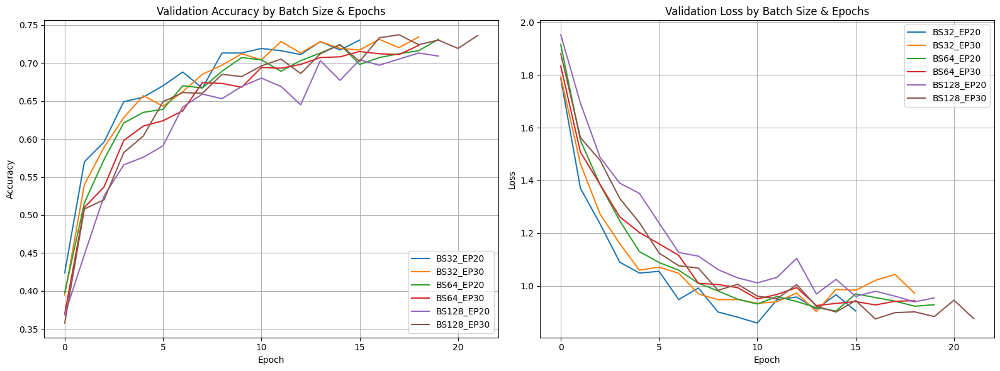

In [154]:
# Plot Accuracy + Loss Curves (All in One)
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy
for label, acc_values in val_accuracies.items():
    axs[0].plot(acc_values, label=label)
axs[0].set_title('Validation Accuracy by Batch Size & Epochs')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Accuracy')
axs[0].legend()
axs[0].grid(True)

# Loss
for label, loss_values in val_losses.items():
    axs[1].plot(loss_values, label=label)
axs[1].set_title('Validation Loss by Batch Size & Epochs')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()


In [155]:
# Print Final Accuracy Matrix
print("\n=== Final Validation Accuracy & Loss by Batch Size and Epochs ===")
for key, metrics in final_metrics.items():
    acc = metrics['Final Val Accuracy']
    loss = metrics['Final Val Loss']
    print(f"{key:15s} | Accuracy: {acc:.4f} | Loss: {loss:.4f}")



=== Final Validation Accuracy & Loss by Batch Size and Epochs ===
BS32_EP20       | Accuracy: 0.7300 | Loss: 0.9053
BS32_EP30       | Accuracy: 0.7340 | Loss: 0.9720
BS64_EP20       | Accuracy: 0.7310 | Loss: 0.9289
BS64_EP30       | Accuracy: 0.7230 | Loss: 0.9444
BS128_EP20      | Accuracy: 0.7090 | Loss: 0.9549
BS128_EP30      | Accuracy: 0.7360 | Loss: 0.8765


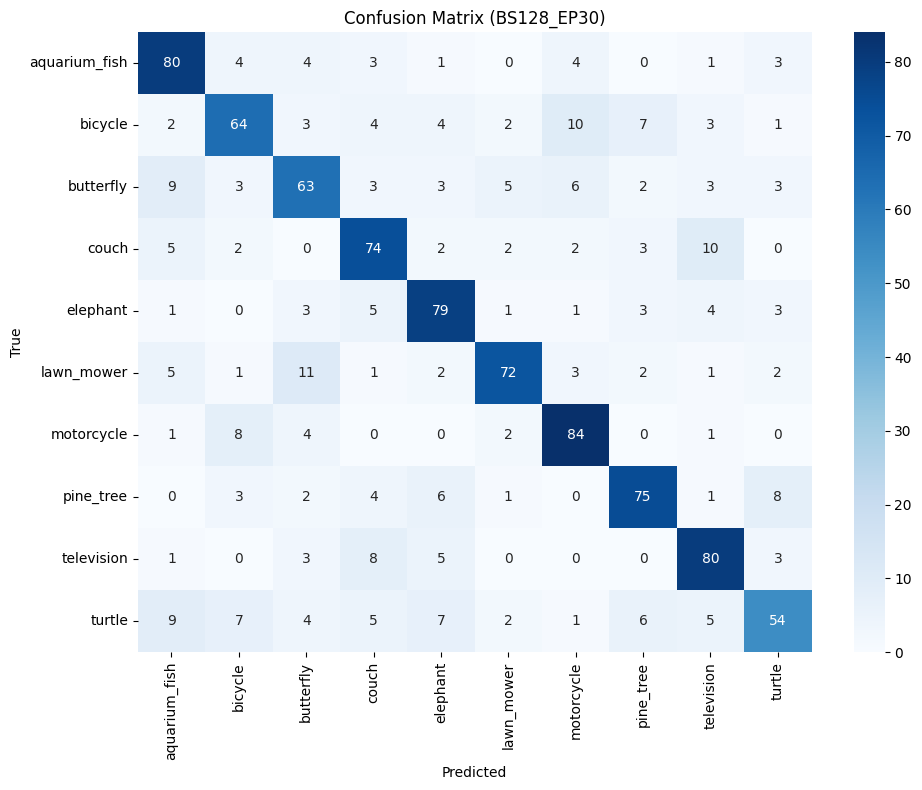

In [156]:
# Plot Confusion Matrix for Top Config
top_key = max(final_metrics, key=lambda k: final_metrics[k]['Final Val Accuracy'])
conf_mat = conf_matrices[top_key]

plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues',
            xticklabels=selected_classes,
            yticklabels=selected_classes)
plt.title(f'Confusion Matrix ({top_key})')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()


##### **Summary of the Results:**

In this part of the experiment, I trained the model with combinations of batch sizes (32, 64, 128) and epochs (20 and 30). The main idea was to understand how these two hyperparameters — which are usually seen as low-effort tweaks — impact the final validation accuracy and loss. Surprisingly, even slight changes in batch size or training time produced noticeable shifts in how well the model generalized.

Starting with batch size 32, both 20 and 30 epochs yielded solid performance. Accuracy hovered around 73%, and loss was around 0.90–0.97. The jump from 20 to 30 epochs slightly improved accuracy but also increased loss a bit, suggesting mild overfitting might be creeping in. Still, this setup gave stable results and is usually a safe baseline in most training pipelines.

With batch size 64, the model again performed quite well. At 20 epochs, it achieved 73.1% accuracy, which is almost the same as the batch size 32 setup. But when I increased to 30 epochs, the performance dipped a little — both accuracy (72.3%) and loss (0.9444) were slightly worse. It seems that with larger batches, the model may converge faster but plateaus earlier, so more epochs don’t necessarily help and might just lead to minor overfitting or noise.

Things got more interesting with batch size 128. At 20 epochs, accuracy was slightly lower (70.9%), but when trained for 30 epochs, performance shot up to the highest observed — 73.6% accuracy with the lowest loss of 0.8765. This suggests that although large batches might require more time to refine during each epoch, they benefit more from longer training. The model learns more gradually but eventually stabilizes better — maybe due to the smoother gradient updates associated with larger batches.

The best-performing combination in this experiment turned out to be batch size 128 with 30 epochs, achieving the highest accuracy and lowest validation loss. That said, batch size 32 with 20–30 epochs is a strong and consistent setup that performs reliably across different settings. In general, longer training helped only when the batch size was large enough to benefit from it. For medium and smaller batch sizes, increasing epochs had diminishing returns or slightly worsened the results. It's a reminder that there's no universal rule — tuning batch size and epochs should always be aligned with the optimizer behavior and dataset complexity.